# UAP Machine Learning

Name : Haidar Dimas Heryanto

NIM : 202210370311088

Class : Machine Learning 7A/D


In [ ]:
# ============================================
# 1. Install & Import Library
# ============================================
!pip install kagglehub
!pip install tensorflow seaborn

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
import random

from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.applications import ResNet50, MobileNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
# ============================================
# 2. Download Dataset via KaggleHub
# ============================================
import kagglehub

# Download dataset
path = kagglehub.dataset_download("sujaykapadnis/emotion-recognition-dataset")
print("Dataset downloaded at:", path)

# Copy dataset ke /content agar mudah diakses
dataset_path = "/content/emotion_dataset"
if not os.path.exists(dataset_path):
    shutil.copytree(path, dataset_path)

print("Dataset copied to:", dataset_path)
print("Isi folder:", os.listdir(dataset_path))

100%|██████████| 1.98G/1.98G [00:25<00:00, 83.5MB/s]

Extracting files...


Dataset downloaded at: /root/.cache/kagglehub/datasets/sujaykapadnis/emotion-recognition-dataset/versions/1
Dataset copied to: /content/emotion_dataset
Isi folder: ['dataset', 'data.csv']


In [ ]:
# ============================================
# 3. Filter Only Angry, Sad, Surprise (Path Fix)
# ============================================
selected_classes = ['Angry', 'Sad', 'Surprise']
source_root = "/content/emotion_dataset/dataset"  # perbaikan path
base_dir = "/content/emotion_filtered"
os.makedirs(base_dir, exist_ok=True)

for cls in selected_classes:
    src = os.path.join(source_root, cls)
    dst = os.path.join(base_dir, cls)
    if os.path.exists(src):
        shutil.copytree(src, dst)
        print(f"✅ Folder {cls} berhasil disalin ke {dst}")
    else:
        print(f"⚠️ Folder {cls} tidak ditemukan di {src}")


✅ Folder Angry berhasil disalin ke /content/emotion_filtered/Angry
✅ Folder Sad berhasil disalin ke /content/emotion_filtered/Sad
✅ Folder Surprise berhasil disalin ke /content/emotion_filtered/Surprise


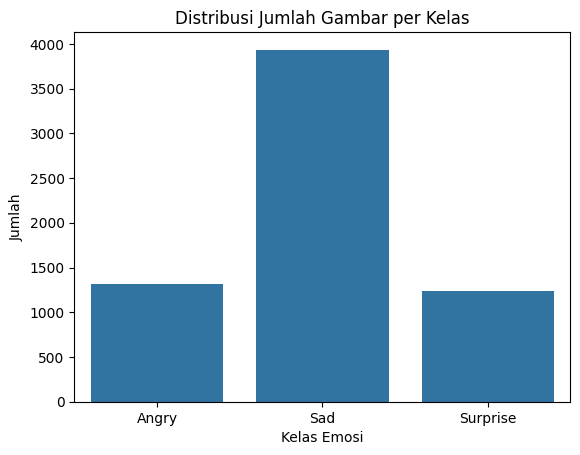

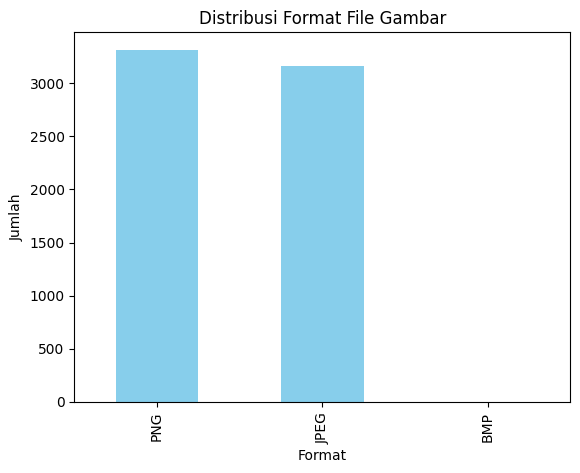

Statistik Ukuran Gambar:
             Width       Height
count  6481.000000  6481.000000
mean    391.122203   444.328499
std     338.037585   344.416344
min      36.000000    55.000000
25%     197.000000   235.000000
50%     283.000000   340.000000
75%     463.000000   534.000000
max    4414.000000  4414.000000


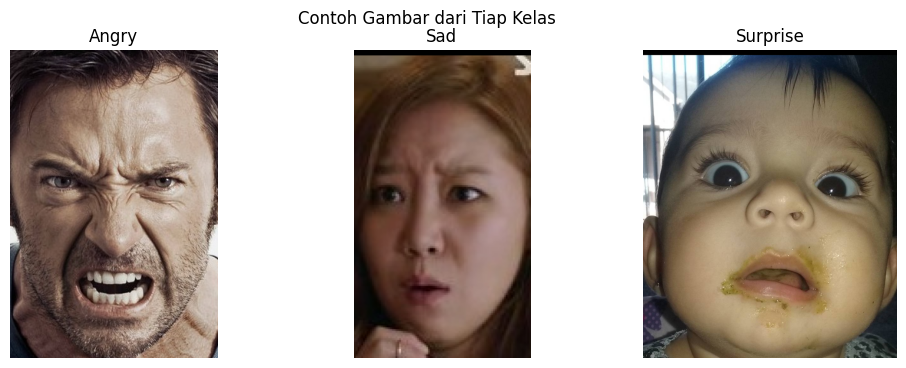

In [ ]:
import cv2
from PIL import Image
from tqdm import tqdm

# ============================================
# 4. EDA Lengkap: Distribusi, Ukuran, Format, Contoh Gambar
# ============================================

# 1. Distribusi Jumlah Gambar per Kelas
data_counts = {cls: len(os.listdir(os.path.join(base_dir, cls))) for cls in selected_classes}
df_counts = pd.DataFrame(list(data_counts.items()), columns=['Kelas', 'Jumlah Gambar'])

sns.barplot(data=df_counts, x='Kelas', y='Jumlah Gambar')
plt.title("Distribusi Jumlah Gambar per Kelas")
plt.ylabel("Jumlah")
plt.xlabel("Kelas Emosi")
plt.show()

# 2. Format File & Ukuran Gambar
image_formats = []
image_shapes = []

for cls in selected_classes:
    folder = os.path.join(base_dir, cls)
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        try:
            img = Image.open(img_path)
            image_formats.append(img.format)
            image_shapes.append(img.size)  # (width, height)
        except:
            continue

# Format file
format_series = pd.Series(image_formats).value_counts()
format_series.plot(kind='bar', color='skyblue')
plt.title("Distribusi Format File Gambar")
plt.xlabel("Format")
plt.ylabel("Jumlah")
plt.show()

# Ukuran gambar
shape_df = pd.DataFrame(image_shapes, columns=['Width', 'Height'])
print("Statistik Ukuran Gambar:")
print(shape_df.describe())

# 3. Contoh Gambar dari Tiap Kelas
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for i, cls in enumerate(selected_classes):
    folder = os.path.join(base_dir, cls)
    sample_img = random.choice(os.listdir(folder))
    img_path = os.path.join(folder, sample_img)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(f"{cls}")
    axes[i].axis('off')
plt.suptitle("Contoh Gambar dari Tiap Kelas")
plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight

# ============================================
# 5. Preprocessing & Data Generator (Improved)
# ============================================

img_size = (128, 128)
batch_size = 32

# PERBAIKAN 1: Hitung class weights untuk mengatasi imbalance

class_counts = {cls: len(os.listdir(os.path.join(base_dir, cls))) for cls in selected_classes}
total_samples = sum(class_counts.values())
class_weights_dict = {}

for i, cls in enumerate(sorted(selected_classes)):
    count = class_counts[cls]
    weight = total_samples / (len(selected_classes) * count)
    class_weights_dict[i] = weight
    print(f"Class {cls}: {count} samples, weight: {weight:.2f}")

# Data augmentation yang lebih agresif untuk minority classes
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=30,        # Increased
    width_shift_range=0.2,    # Increased
    height_shift_range=0.2,   # Increased
    shear_range=0.15,         # Increased
    zoom_range=0.2,           # Increased
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],  # NEW: Variasi brightness
    fill_mode='nearest'
)

train_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

print("\n📊 Informasi Dataset Split:")
print(f"Jumlah kelas: {len(train_gen.class_indices)} -> {train_gen.class_indices}")
print(f"Jumlah data training: {train_gen.samples}")
print(f"Jumlah data validation: {val_gen.samples}")
print(f"Class Weights: {class_weights_dict}")

Class Angry: 1313 samples, weight: 1.65
Class Sad: 3934 samples, weight: 0.55
Class Surprise: 1234 samples, weight: 1.75
Found 5187 images belonging to 3 classes.
Found 1294 images belonging to 3 classes.

📊 Informasi Dataset Split:
Jumlah kelas: 3 -> {'Angry': 0, 'Sad': 1, 'Surprise': 2}
Jumlah data training: 5187
Jumlah data validation: 1294
Class Weights: {0: 1.6453414572226452, 1: 0.5491442128452805, 2: 1.7506753106428958}


### Model 1 - CNN

In [ ]:
# ============================================
# 6.1 Model CNN (Enhanced Architecture)
# ============================================

from tensorflow.keras.layers import BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# PERBAIKAN 2: Arsitektur yang lebih dalam dengan regularization
cnn_model = Sequential([
    # Block 1
    Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(128,128,3)),
    BatchNormalization(),
    Conv2D(32, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.25),

    # Block 2
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.25),

    # Block 3
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.25),

    # Block 4
    Conv2D(256, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    GlobalAveragePooling2D(),  # Lebih baik dari Flatten

    # Fully Connected
    Dense(256, activation='relu', kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.3),
    Dense(3, activation='softmax')
])

# PERBAIKAN 3: Learning rate yang lebih optimal
cnn_model.compile(
    optimizer=Adam(learning_rate=0.001),  # Start higher, akan turun dengan ReduceLR
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(cnn_model.summary())

# Callback yang lebih baik
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,  # Lebih sabar
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=4,  # Lebih sabar
    min_lr=1e-7,
    verbose=1
)

# PERBAIKAN 4: Training dengan class weights
history = cnn_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  # Lebih banyak epoch, tapi dengan early stopping
    callbacks=[early_stop, reduce_lr],
    class_weight=class_weights_dict,  # PENTING untuk imbalance
    verbose=1
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │             

 Total params: 685,091 (2.61 MB)

 Trainable params: 683,171 (2.61 MB)

 Non-trainable params: 1,920 (7.50 KB)

None


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 100s 481ms/step - accuracy: 0.3645 - loss: 2.0112 - val_accuracy: 0.1770 - val_loss: 2.0589 - learning_rate: 0.0010
Epoch 2/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 63s 387ms/step - accuracy: 0.4124 - loss: 1.6305 - val_accuracy: 0.2133 - val_loss: 1.6638 - learning_rate: 0.0010
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 63s 386ms/step - accuracy: 0.4537 - loss: 1.4879 - val_accuracy: 0.4026 - val_loss: 1.5010 - learning_rate: 0.0010
Epoch 4/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 62s 383ms/step - accuracy: 0.4654 - loss: 1.4205 - val_accuracy: 0.4606 - val_loss: 1.4944 - learning_rate: 0.0010
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 62s 381ms/step - accuracy: 0.5061 - loss: 1.3472 - val_accuracy: 0.5309 - val_loss: 1.3261 - learning_rate: 0.0010
Epoch 6/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 61s 373ms/step - accuracy: 0.5143 - loss: 1.3065 - val_accuracy: 0.2890 - val_loss: 1.4987 - learning_rate: 0.0010
Epoch 7/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 62s 380ms/step - accuracy: 0.

41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step

📋 CLASSIFICATION REPORT - CNN (Enhanced)
              precision    recall  f1-score   support

       Angry       0.60      0.73      0.66       262
         Sad       0.87      0.84      0.85       786
    Surprise       0.78      0.70      0.74       246

    accuracy                           0.79      1294
   macro avg       0.75      0.76      0.75      1294
weighted avg       0.80      0.79      0.79      1294



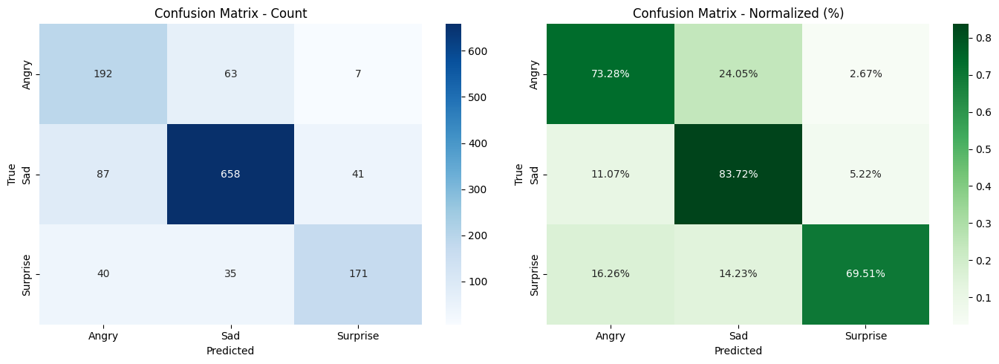

In [ ]:
# ============================================
# 6.2 Evaluasi & Classification Report (Enhanced)
# ============================================

val_gen.reset()
y_true = val_gen.classes
y_pred_proba = cnn_model.predict(val_gen)
y_pred = np.argmax(y_pred_proba, axis=1)

print("\n" + "="*60)
print("📋 CLASSIFICATION REPORT - CNN (Enhanced)")
print("="*60)
print(classification_report(y_true, y_pred, target_names=val_gen.class_indices.keys()))

# Confusion Matrix dengan persentase
cm = confusion_matrix(y_true, y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confusion Matrix (Count)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=val_gen.class_indices.keys(),
            yticklabels=val_gen.class_indices.keys())
axes[0].set_title("Confusion Matrix - Count")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

# Confusion Matrix (Normalized)
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1],
            xticklabels=val_gen.class_indices.keys(),
            yticklabels=val_gen.class_indices.keys())
axes[1].set_title("Confusion Matrix - Normalized (%)")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()

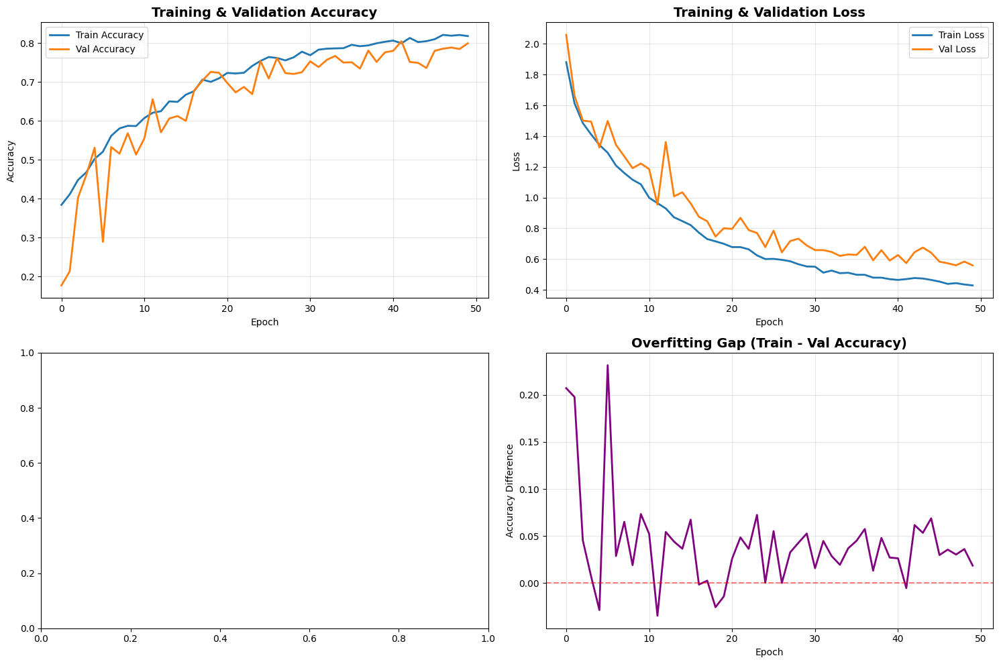

In [ ]:
# ============================================
# 6.3 Grafik Accuracy & Loss (Enhanced)
# ============================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Accuracy
axes[0, 0].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0, 0].set_title('Training & Validation Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Learning Rate (jika tersedia)
if 'lr' in history.history:
    axes[1, 0].plot(history.history['lr'], linewidth=2, color='red')
    axes[1, 0].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Learning Rate')
    axes[1, 0].set_yscale('log')
    axes[1, 0].grid(True, alpha=0.3)

# Overfitting Analysis
train_val_diff = np.array(history.history['accuracy']) - np.array(history.history['val_accuracy'])
axes[1, 1].plot(train_val_diff, linewidth=2, color='purple')
axes[1, 1].axhline(y=0, color='r', linestyle='--', alpha=0.5)
axes[1, 1].set_title('Overfitting Gap (Train - Val Accuracy)', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Accuracy Difference')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



🔍 DETAILED ERROR ANALYSIS

📊 Overall Performance:
Total Samples: 1294
Correctly Classified: 1021 (78.90%)
Misclassified: 273 (21.10%)

--------------------------------------------------------------------------------
📈 Per-Class Detailed Analysis:
--------------------------------------------------------------------------------

🎯 Class: Angry
   Total Samples: 262
   Correct: 192 (73.28%)
   Misclassified: 70 (26.72%)
   Avg Confidence: 0.812
   Confused with:
      → Sad: 63 times (90.0% of errors)
      → Surprise: 7 times (10.0% of errors)

🎯 Class: Sad
   Total Samples: 786
   Correct: 658 (83.72%)
   Misclassified: 128 (16.28%)
   Avg Confidence: 0.847
   Confused with:
      → Angry: 87 times (68.0% of errors)
      → Surprise: 41 times (32.0% of errors)

🎯 Class: Surprise
   Total Samples: 246
   Correct: 171 (69.51%)
   Misclassified: 75 (30.49%)
   Avg Confidence: 0.830
   Confused with:
      → Angry: 40 times (53.3% of errors)
      → Sad: 35 times (46.7% of errors)

-------

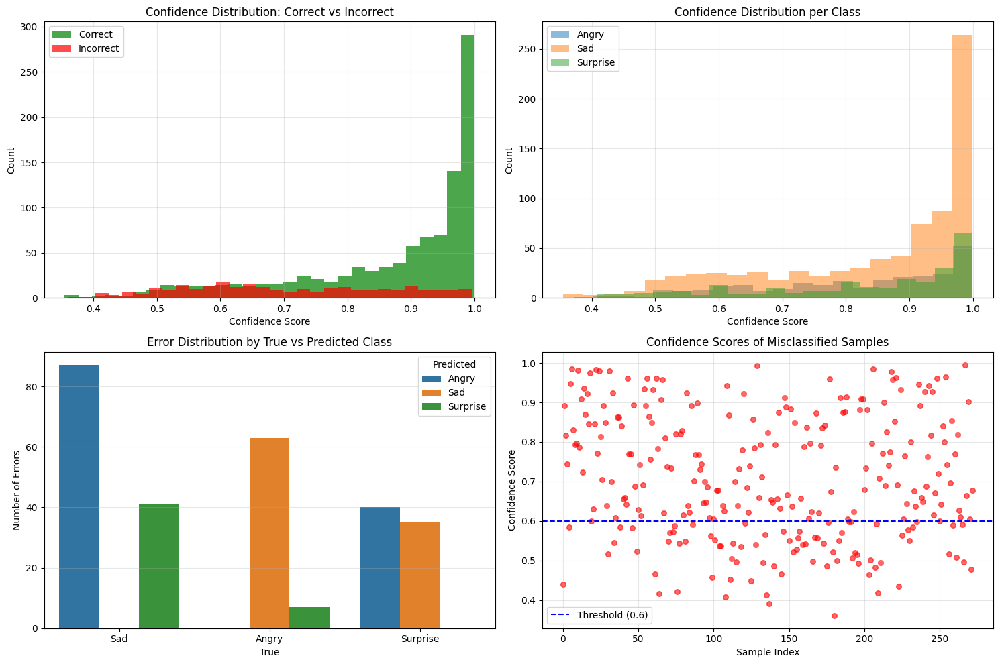


--------------------------------------------------------------------------------
⚡ Most Confident Errors (Model was very sure, but wrong):
--------------------------------------------------------------------------------
    True Predicted  Confidence
Surprise     Angry    0.995986
     Sad  Surprise    0.993395
   Angry       Sad    0.985416
Surprise       Sad    0.984201
   Angry  Surprise    0.984072
   Angry       Sad    0.981156
   Angry       Sad    0.980755
   Angry       Sad    0.980297
Surprise       Sad    0.978188
   Angry       Sad    0.975560

--------------------------------------------------------------------------------
🔬 Sample Images - Error Analysis:
--------------------------------------------------------------------------------


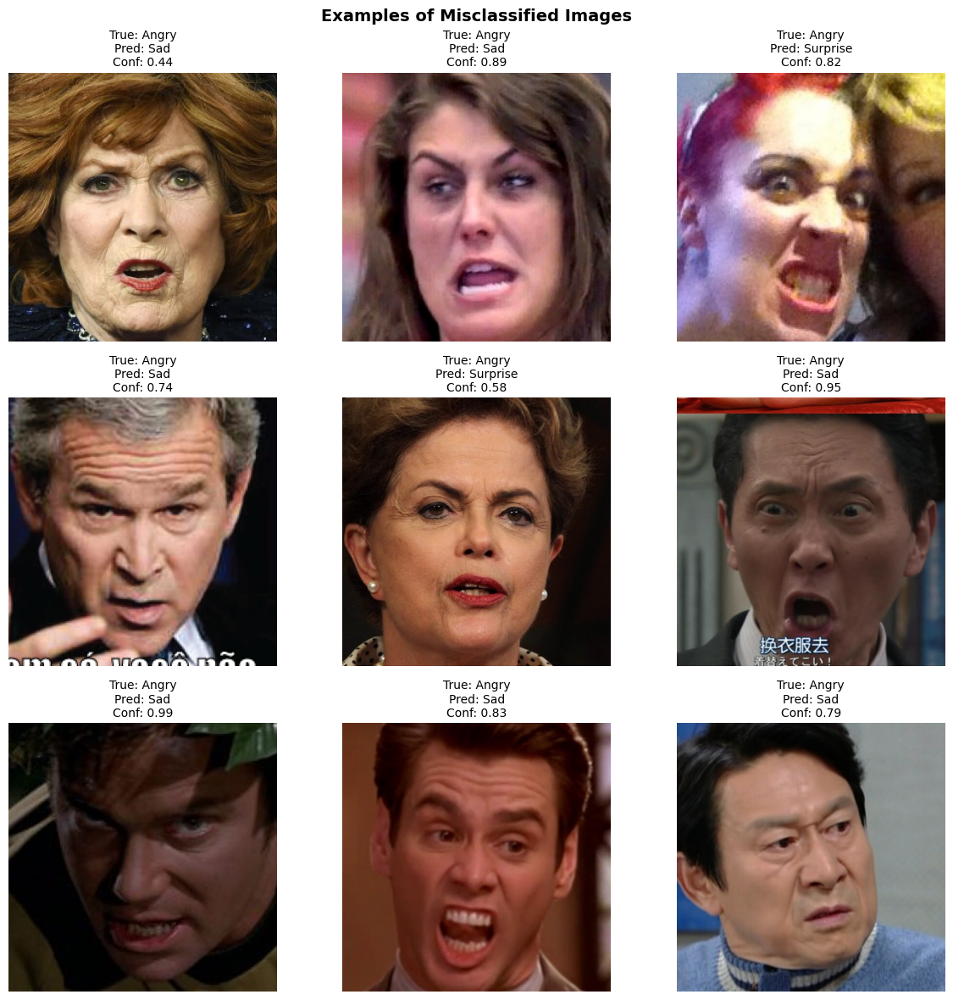


✅ Error Analysis Complete!


In [ ]:
# ============================================
# 6.4 ERROR ANALYSIS - DETAILED & ENHANCED
# ============================================

print("\n" + "="*80)
print("🔍 DETAILED ERROR ANALYSIS")
print("="*80)

class_names = list(val_gen.class_indices.keys())
misclassified_idx = np.where(y_true != y_pred)[0]
correctly_classified_idx = np.where(y_true == y_pred)[0]

print(f"\n📊 Overall Performance:")
print(f"Total Samples: {len(y_true)}")
print(f"Correctly Classified: {len(correctly_classified_idx)} ({len(correctly_classified_idx)/len(y_true)*100:.2f}%)")
print(f"Misclassified: {len(misclassified_idx)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)")

# 1. Per-Class Detailed Metrics
print("\n" + "-"*80)
print("📈 Per-Class Detailed Analysis:")
print("-"*80)

for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_true = y_true[cls_mask]
    cls_pred = y_pred[cls_mask]
    cls_proba = y_pred_proba[cls_mask]

    correct = np.sum(cls_true == cls_pred)
    total = len(cls_true)
    accuracy = correct / total if total > 0 else 0

    # Hitung confidence score
    confidence_scores = np.max(cls_proba, axis=1)
    avg_confidence = np.mean(confidence_scores)

    # Misclassification per target class
    misclass_targets = cls_pred[cls_true != cls_pred]

    print(f"\n🎯 Class: {cls}")
    print(f"   Total Samples: {total}")
    print(f"   Correct: {correct} ({accuracy*100:.2f}%)")
    print(f"   Misclassified: {total - correct} ({(1-accuracy)*100:.2f}%)")
    print(f"   Avg Confidence: {avg_confidence:.3f}")

    if len(misclass_targets) > 0:
        print(f"   Confused with:")
        for target_idx in np.unique(misclass_targets):
            count = np.sum(misclass_targets == target_idx)
            print(f"      → {class_names[target_idx]}: {count} times ({count/(total-correct)*100:.1f}% of errors)")

# 2. Confidence Distribution Analysis
print("\n" + "-"*80)
print("📊 Confidence Score Analysis:")
print("-"*80)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Confidence distribution for correct vs incorrect
correct_confidence = np.max(y_pred_proba[correctly_classified_idx], axis=1)
incorrect_confidence = np.max(y_pred_proba[misclassified_idx], axis=1)

axes[0, 0].hist(correct_confidence, bins=30, alpha=0.7, label='Correct', color='green')
axes[0, 0].hist(incorrect_confidence, bins=30, alpha=0.7, label='Incorrect', color='red')
axes[0, 0].set_title('Confidence Distribution: Correct vs Incorrect')
axes[0, 0].set_xlabel('Confidence Score')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

print(f"Avg Confidence (Correct): {np.mean(correct_confidence):.3f}")
print(f"Avg Confidence (Incorrect): {np.mean(incorrect_confidence):.3f}")

# Per-class confidence
for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_confidence = np.max(y_pred_proba[cls_mask], axis=1)
    axes[0, 1].hist(cls_confidence, bins=20, alpha=0.5, label=cls)

axes[0, 1].set_title('Confidence Distribution per Class')
axes[0, 1].set_xlabel('Confidence Score')
axes[0, 1].set_ylabel('Count')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 3. Confusion patterns
errors_df = pd.DataFrame({
    "True": [class_names[i] for i in y_true[misclassified_idx]],
    "Predicted": [class_names[i] for i in y_pred[misclassified_idx]],
    "Confidence": np.max(y_pred_proba[misclassified_idx], axis=1)
})

error_counts = errors_df.groupby(["True", "Predicted"]).size().reset_index(name="Count")
error_counts = error_counts.sort_values("Count", ascending=False)

sns.barplot(data=error_counts, x="True", y="Count", hue="Predicted", ax=axes[1, 0])
axes[1, 0].set_title('Error Distribution by True vs Predicted Class')
axes[1, 0].set_ylabel('Number of Errors')
axes[1, 0].grid(True, alpha=0.3, axis='y')

print(f"\n🔴 Top Confusion Patterns:")
print(error_counts.head(10).to_string(index=False))

# 4. Low confidence errors (most uncertain mistakes)
low_confidence_threshold = 0.6
low_conf_errors = errors_df[errors_df['Confidence'] < low_confidence_threshold]

axes[1, 1].scatter(range(len(errors_df)), errors_df['Confidence'],
                   alpha=0.6, c='red', s=30)
axes[1, 1].axhline(y=low_confidence_threshold, color='blue',
                   linestyle='--', label=f'Threshold ({low_confidence_threshold})')
axes[1, 1].set_title('Confidence Scores of Misclassified Samples')
axes[1, 1].set_xlabel('Sample Index')
axes[1, 1].set_ylabel('Confidence Score')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

print(f"\n⚠️ Low Confidence Errors (< {low_confidence_threshold}): {len(low_conf_errors)}")
if len(low_conf_errors) > 0:
    print(low_conf_errors.head(10).to_string(index=False))

plt.tight_layout()
plt.show()

# 5. Most Confident Errors (High confidence but wrong)
print("\n" + "-"*80)
print("⚡ Most Confident Errors (Model was very sure, but wrong):")
print("-"*80)

high_conf_errors = errors_df.nlargest(10, 'Confidence')
print(high_conf_errors.to_string(index=False))

# 6. Sample-level analysis
print("\n" + "-"*80)
print("🔬 Sample Images - Error Analysis:")
print("-"*80)

# Show misclassified examples
num_examples = min(9, len(misclassified_idx))
if num_examples > 0:
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    axes = axes.ravel()

    for i in range(num_examples):
        idx = misclassified_idx[i]
        img_path = val_gen.filepaths[idx]
        img = Image.open(img_path)

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        confidence = np.max(y_pred_proba[idx])

        axes[i].imshow(img)
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label}\nConf: {confidence:.2f}",
                          fontsize=10)
        axes[i].axis('off')

    plt.suptitle("Examples of Misclassified Images", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("\n" + "="*80)
print("✅ Error Analysis Complete!")
print("="*80)

In [ ]:
# ============================================
# 6.5 Model Saving & Export (FIXED)
# ============================================

import json
from datetime import datetime

print("\n" + "="*80)
print("💾 SAVING MODEL & ARTIFACTS")
print("="*80)

# Buat folder untuk menyimpan model
model_save_dir = "/content/saved_models"
os.makedirs(model_save_dir, exist_ok=True)

# Timestamp untuk versioning
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
model_name = "cnn_model"

# ============================================
# 1. Save Full Model (Recommended - Keras format)
# ============================================
model_path_keras = os.path.join(model_save_dir, f"{model_name}.keras")
cnn_model.save(model_path_keras)
print(f"✅ Model saved (Keras format): {model_path_keras}")

# ============================================
# 2. Save Model Architecture (JSON)
# ============================================
model_json = cnn_model.to_json()
json_path = os.path.join(model_save_dir, f"{model_name}_architecture.json")
with open(json_path, 'w') as json_file:
    json_file.write(model_json)
print(f"✅ Model architecture saved: {json_path}")

# ============================================
# 3. Save Model Weights Only (FIXED - menggunakan .weights.h5)
# ============================================
weights_path = os.path.join(model_save_dir, f"{model_name}.weights.h5")  # PERBAIKAN DI SINI
cnn_model.save_weights(weights_path)
print(f"✅ Model weights saved: {weights_path}")

# ============================================
# 4. Save Model with Timestamp (Versioning)
# ============================================
versioned_path = os.path.join(model_save_dir, f"{model_name}_{timestamp}.keras")
cnn_model.save(versioned_path)
print(f"✅ Versioned model saved: {versioned_path}")

# ============================================
# 5. Save Training History
# ============================================
history_path = os.path.join(model_save_dir, f"{model_name}_history.json")
with open(history_path, 'w') as f:
    # Convert numpy arrays to lists for JSON serialization
    history_dict = {key: [float(val) for val in values]
                   for key, values in history.history.items()}
    json.dump(history_dict, f, indent=4)
print(f"✅ Training history saved: {history_path}")

# ============================================
# 6. Save Class Indices Mapping
# ============================================
class_indices_path = os.path.join(model_save_dir, f"{model_name}_class_indices.json")
with open(class_indices_path, 'w') as f:
    json.dump(train_gen.class_indices, f, indent=4)
print(f"✅ Class indices saved: {class_indices_path}")

# ============================================
# 7. Save Model Configuration & Metadata
# ============================================
model_config = {
    "model_name": model_name,
    "timestamp": timestamp,
    "architecture": "Custom CNN",
    "input_shape": [128, 128, 3],
    "num_classes": 3,
    "class_names": list(train_gen.class_indices.keys()),
    "class_weights": class_weights_dict,
    "total_params": cnn_model.count_params(),
    "training_samples": train_gen.samples,
    "validation_samples": val_gen.samples,
    "batch_size": batch_size,
    "epochs_trained": len(history.history['loss']),
    "final_train_accuracy": float(history.history['accuracy'][-1]),
    "final_val_accuracy": float(history.history['val_accuracy'][-1]),
    "final_train_loss": float(history.history['loss'][-1]),
    "final_val_loss": float(history.history['val_loss'][-1]),
    "best_val_accuracy": float(max(history.history['val_accuracy'])),
    "optimizer": "Adam",
    "initial_learning_rate": 0.001,
    "loss_function": "categorical_crossentropy"
}

config_path = os.path.join(model_save_dir, f"{model_name}_config.json")
with open(config_path, 'w') as f:
    json.dump(model_config, f, indent=4)
print(f"✅ Model configuration saved: {config_path}")

# ============================================
# 8. Save Performance Metrics
# ============================================
from sklearn.metrics import precision_score, recall_score, f1_score

val_gen.reset()
y_true = val_gen.classes
y_pred = np.argmax(cnn_model.predict(val_gen), axis=1)

performance_metrics = {
    "overall_accuracy": float(np.mean(y_true == y_pred)),
    "per_class_metrics": {}
}

class_names = list(train_gen.class_indices.keys())

for i, cls in enumerate(class_names):
    cls_true = (y_true == i).astype(int)
    cls_pred = (y_pred == i).astype(int)

    performance_metrics["per_class_metrics"][cls] = {
        "precision": float(precision_score(cls_true, cls_pred, zero_division=0)),
        "recall": float(recall_score(cls_true, cls_pred, zero_division=0)),
        "f1_score": float(f1_score(cls_true, cls_pred, zero_division=0)),
        "support": int(np.sum(cls_true))
    }

metrics_path = os.path.join(model_save_dir, f"{model_name}_metrics.json")
with open(metrics_path, 'w') as f:
    json.dump(performance_metrics, f, indent=4)
print(f"✅ Performance metrics saved: {metrics_path}")

# ============================================
# 9. Create Model Info Summary
# ============================================
summary_path = os.path.join(model_save_dir, f"{model_name}_summary.txt")
with open(summary_path, 'w') as f:
    f.write("="*80 + "\n")
    f.write(f"MODEL SUMMARY: {model_name}\n")
    f.write("="*80 + "\n\n")

    f.write(f"Created: {timestamp}\n")
    f.write(f"Total Parameters: {cnn_model.count_params():,}\n")
    f.write(f"Training Samples: {train_gen.samples}\n")
    f.write(f"Validation Samples: {val_gen.samples}\n")
    f.write(f"Epochs Trained: {len(history.history['loss'])}\n\n")

    f.write("FINAL PERFORMANCE:\n")
    f.write(f"  Train Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"  Val Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write(f"  Train Loss: {history.history['loss'][-1]:.4f}\n")
    f.write(f"  Val Loss: {history.history['val_loss'][-1]:.4f}\n\n")

    f.write("BEST PERFORMANCE:\n")
    f.write(f"  Best Val Accuracy: {max(history.history['val_accuracy']):.4f}\n")
    f.write(f"  Best Val Loss: {min(history.history['val_loss']):.4f}\n\n")

    f.write("PER-CLASS METRICS:\n")
    for cls, metrics in performance_metrics["per_class_metrics"].items():
        f.write(f"\n  {cls}:\n")
        f.write(f"    Precision: {metrics['precision']:.4f}\n")
        f.write(f"    Recall: {metrics['recall']:.4f}\n")
        f.write(f"    F1-Score: {metrics['f1_score']:.4f}\n")
        f.write(f"    Support: {metrics['support']}\n")

    # Model architecture summary
    f.write("\n" + "="*80 + "\n")
    f.write("MODEL ARCHITECTURE:\n")
    f.write("="*80 + "\n")

    # Redirect summary to file
    cnn_model.summary(print_fn=lambda x: f.write(x + '\n'))

print(f"✅ Model summary saved: {summary_path}")

# ============================================
# 10. List All Saved Files
# ============================================
print("\n" + "-"*80)
print("📁 All Saved Files:")
print("-"*80)

saved_files = os.listdir(model_save_dir)
total_size = 0
for idx, file in enumerate(sorted(saved_files), 1):
    file_path = os.path.join(model_save_dir, file)
    file_size = os.path.getsize(file_path) / (1024 * 1024)  # Convert to MB
    total_size += file_size
    print(f"{idx}. {file} ({file_size:.2f} MB)")

print(f"\nTotal Size: {total_size:.2f} MB")

print("\n" + "="*80)
print("✅ ALL FILES SAVED SUCCESSFULLY!")
print("="*80)

# ============================================
# 11. Quick Load Example (untuk referensi future use)
# ============================================
print("\n" + "-"*80)
print("📖 HOW TO LOAD THE MODEL LATER:")
print("-"*80)
print("""
# Method 1: Load full model (Recommended - Easiest)
from tensorflow.keras.models import load_model
loaded_model = load_model('/content/saved_models/cnn_model.keras')
print("✅ Model loaded successfully!")

# Method 2: Load architecture + weights separately
import json
from tensorflow.keras.models import model_from_json

# Load architecture
with open('/content/saved_models/cnn_model_architecture.json', 'r') as f:
    loaded_model_json = f.read()
loaded_model = model_from_json(loaded_model_json)

# Load weights (PERHATIKAN: gunakan .weights.h5)
loaded_model.load_weights('/content/saved_models/cnn_model.weights.h5')

# Compile the model
from tensorflow.keras.optimizers import Adam
loaded_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("✅ Model loaded and compiled successfully!")

# Load class indices
with open('/content/saved_models/cnn_model_class_indices.json', 'r') as f:
    class_indices = json.load(f)
print(f"✅ Class indices loaded: {class_indices}")

# Load model configuration
with open('/content/saved_models/cnn_model_config.json', 'r') as f:
    model_config = json.load(f)
print(f"✅ Model config loaded")

# Load performance metrics
with open('/content/saved_models/cnn_model_metrics.json', 'r') as f:
    performance_metrics = json.load(f)
print(f"✅ Performance metrics loaded")
print(f"Overall Accuracy: {performance_metrics['overall_accuracy']:.4f}")
""")

print("\n" + "="*80)
print("💾 MODEL SAVING COMPLETE!")
print("="*80)

# ============================================
# 12. Create a Quick Test Function
# ============================================
print("\n" + "-"*80)
print("🧪 Testing Model Load (Quick Verification):")
print("-"*80)

try:
    # Test loading
    test_model = load_model(model_path_keras)
    print("✅ Model can be loaded successfully!")
    print(f"   Model input shape: {test_model.input_shape}")
    print(f"   Model output shape: {test_model.output_shape}")
    print(f"   Total parameters: {test_model.count_params():,}")
except Exception as e:
    print(f"❌ Error loading model: {e}")


💾 SAVING MODEL & ARTIFACTS
✅ Model saved (Keras format): /content/saved_models/cnn_model.keras
✅ Model architecture saved: /content/saved_models/cnn_model_architecture.json
✅ Model weights saved: /content/saved_models/cnn_model.weights.h5
✅ Versioned model saved: /content/saved_models/cnn_model_20251224_023624.keras
✅ Training history saved: /content/saved_models/cnn_model_history.json
✅ Class indices saved: /content/saved_models/cnn_model_class_indices.json
✅ Model configuration saved: /content/saved_models/cnn_model_config.json
41/41 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step
✅ Performance metrics saved: /content/saved_models/cnn_model_metrics.json


✅ Model summary saved: /content/saved_models/cnn_model_summary.txt

--------------------------------------------------------------------------------
📁 All Saved Files:
--------------------------------------------------------------------------------
1. cnn_model.keras (7.95 MB)
2. cnn_model.weights.h5 (7.93 MB)
3. cnn_model_20251224_023624.keras (7.95 MB)
4. cnn_model_architecture.json (0.02 MB)
5. cnn_model_class_indices.json (0.00 MB)
6. cnn_model_config.json (0.00 MB)
7. cnn_model_history.json (0.01 MB)
8. cnn_model_metrics.json (0.00 MB)
9. cnn_model_summary.txt (0.01 MB)

Total Size: 23.86 MB

✅ ALL FILES SAVED SUCCESSFULLY!

--------------------------------------------------------------------------------
📖 HOW TO LOAD THE MODEL LATER:
--------------------------------------------------------------------------------

# Method 1: Load full model (Recommended - Easiest)
from tensorflow.keras.models import load_model
loaded_model = load_model('/content/saved_models/cnn_model.keras')
pr

In [ ]:
# ============================================
# 6.6 Download CNN Model Files (ZIP)
# ============================================

import zipfile
from datetime import datetime

print("\n" + "="*80)
print("📦 CREATING ZIP ARCHIVE FOR CNN MODEL")
print("="*80)

# Nama file ZIP (menggunakan timestamp yang sama dari section 6.5)
zip_filename = f"/content/{model_name}_complete_{timestamp}.zip"

# List file CNN yang akan di-zip
cnn_files = [
    f"{model_name}.keras",
    f"{model_name}.weights.h5",
    f"{model_name}_architecture.json",
    f"{model_name}_{timestamp}.keras",  # versioned model
    f"{model_name}_history.json",
    f"{model_name}_class_indices.json",
    f"{model_name}_config.json",
    f"{model_name}_metrics.json",
    f"{model_name}_summary.txt"
]

print("\n📋 Files to be included in ZIP:")
files_found = 0
total_size_uncompressed = 0

# Compress file CNN ke dalam ZIP
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for file in cnn_files:
        file_path = os.path.join(model_save_dir, file)
        if os.path.exists(file_path):
            # Calculate file size
            file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB
            total_size_uncompressed += file_size
            files_found += 1

            # Add to ZIP with relative path
            zipf.write(file_path, arcname=file)
            print(f"  ✅ {file} ({file_size:.2f} MB)")
        else:
            print(f"  ⚠️  {file} - File not found, skipping...")

# Calculate ZIP statistics
zip_size = os.path.getsize(zip_filename) / (1024 * 1024)
compression_ratio = ((total_size_uncompressed - zip_size) / total_size_uncompressed * 100) if total_size_uncompressed > 0 else 0

print(f"\n📊 Archive Statistics:")
print(f"  Files included: {files_found}/{len(cnn_files)}")
print(f"  Total size (uncompressed): {total_size_uncompressed:.2f} MB")
print(f"  ZIP size (compressed): {zip_size:.2f} MB")
print(f"  Space saved: {compression_ratio:.1f}%")
print(f"\n✅ All CNN model files compressed to: {zip_filename}")

# Download file (hanya untuk Google Colab)
print("\n" + "-"*80)
print("⬇️  DOWNLOADING ZIP FILE...")
print("-"*80)

try:
    from google.colab import files
    files.download(zip_filename)
    print("✅ Download started! Check your browser's download folder.")
    print(f"   File name: {model_name}_complete_{timestamp}.zip")
    print(f"   File size: {zip_size:.2f} MB")
except ImportError:
    print("ℹ️  Not running in Google Colab - ZIP file saved locally at:")
    print(f"   {zip_filename}")
    print("   You can download it manually from the file browser.")
except Exception as e:
    print(f"⚠️  Error during download: {e}")
    print(f"   But ZIP file is still saved at: {zip_filename}")

# ============================================
# Create Usage Instructions File
# ============================================

print("\n" + "-"*80)
print("📝 Creating Usage Instructions...")
print("-"*80)

instructions = f"""
================================================================================
CNN MODEL - USAGE INSTRUCTIONS
================================================================================

Model: {model_name}
Created: {timestamp}
Architecture: Custom CNN
Input Shape: (128, 128, 3)
Number of Classes: 3
Class Names: {model_config['class_names']}

================================================================================
FILES INCLUDED
================================================================================

1. {model_name}.keras
   - Full model (recommended for loading)
   - Contains architecture, weights, and optimizer state
   - Size: ~{[f for f in cnn_files if f == f'{model_name}.keras']}

2. {model_name}.weights.h5
   - Model weights only
   - Use with architecture JSON

3. {model_name}_architecture.json
   - Model structure in JSON format
   - Use with weights file

4. {model_name}_{timestamp}.keras
   - Versioned copy of the model
   - Keep for backup/comparison

5. {model_name}_history.json
   - Training history (loss, accuracy per epoch)

6. {model_name}_class_indices.json
   - Mapping of class names to indices

7. {model_name}_config.json
   - Model configuration and metadata

8. {model_name}_metrics.json
   - Performance metrics (precision, recall, f1-score)

9. {model_name}_summary.txt
   - Complete model summary and architecture details

================================================================================
QUICK START - LOADING THE MODEL
================================================================================

Method 1: Load Full Model (Easiest & Recommended)
--------------------------------------------------
from tensorflow.keras.models import load_model
import numpy as np

# Load model
model = load_model('{model_name}.keras')
print("✅ Model loaded successfully!")

# Test with dummy input
test_input = np.random.rand(1, 128, 128, 3)
prediction = model.predict(test_input)
print(f"Output shape: {{prediction.shape}}")


Method 2: Load Architecture + Weights Separately
-------------------------------------------------
import json
from tensorflow.keras.models import model_from_json
from tensorflow.keras.optimizers import Adam

# Load architecture
with open('{model_name}_architecture.json', 'r') as f:
    model_json = f.read()
model = model_from_json(model_json)

# Load weights
model.load_weights('{model_name}.weights.h5')

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("✅ Model loaded and compiled!")


================================================================================
MAKING PREDICTIONS
================================================================================

Single Image Prediction:
------------------------
from tensorflow.keras.preprocessing import image
import numpy as np

# Load image
img_path = 'path/to/your/image.jpg'
img = image.load_img(img_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Normalize (0-1)

# Predict
predictions = model.predict(img_array)

# Load class names
import json
with open('{model_name}_class_indices.json', 'r') as f:
    class_indices = json.load(f)

class_names = list(class_indices.keys())
predicted_class = class_names[np.argmax(predictions[0])]
confidence = np.max(predictions[0])

print(f"Predicted Class: {{predicted_class}}")
print(f"Confidence: {{confidence:.2%}}")
print(f"\\nAll Probabilities:")
for cls, prob in zip(class_names, predictions[0]):
    print(f"  {{cls}}: {{prob:.2%}}")


Batch Prediction:
-----------------
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create test generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    'path/to/test/folder',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Predict
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(test_generator.classes, predicted_classes))


================================================================================
LOADING MODEL METADATA
================================================================================

Load Configuration:
-------------------
import json

with open('{model_name}_config.json', 'r') as f:
    config = json.load(f)

print(f"Model Name: {{config['model_name']}}")
print(f"Architecture: {{config['architecture']}}")
print(f"Total Parameters: {{config['total_params']:,}}")
print(f"Training Samples: {{config['training_samples']}}")
print(f"Validation Samples: {{config['validation_samples']}}")
print(f"Best Val Accuracy: {{config['best_val_accuracy']:.4f}}")
print(f"Class Weights: {{config['class_weights']}}")


Load Performance Metrics:
--------------------------
with open('{model_name}_metrics.json', 'r') as f:
    metrics = json.load(f)

print(f"Overall Accuracy: {{metrics['overall_accuracy']:.4f}}")
print("\\nPer-Class Metrics:")
for cls, metric in metrics['per_class_metrics'].items():
    print(f"\\n{{cls}}:")
    print(f"  Precision: {{metric['precision']:.4f}}")
    print(f"  Recall: {{metric['recall']:.4f}}")
    print(f"  F1-Score: {{metric['f1_score']:.4f}}")
    print(f"  Support: {{metric['support']}}")


Load Training History:
-----------------------
with open('{model_name}_history.json', 'r') as f:
    history = json.load(f)

# Plot training curves
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


================================================================================
MODEL INFORMATION
================================================================================

Total Parameters: {model_config['total_params']:,}
Trainable Parameters: {model_config['total_params']:,}

Training Configuration:
  - Optimizer: {model_config['optimizer']}
  - Initial Learning Rate: {model_config['initial_learning_rate']}
  - Loss Function: {model_config['loss_function']}
  - Batch Size: {model_config['batch_size']}
  - Epochs Trained: {model_config['epochs_trained']}

Performance:
  - Final Train Accuracy: {model_config['final_train_accuracy']:.4f}
  - Final Val Accuracy: {model_config['final_val_accuracy']:.4f}
  - Best Val Accuracy: {model_config['best_val_accuracy']:.4f}
  - Final Train Loss: {model_config['final_train_loss']:.4f}
  - Final Val Loss: {model_config['final_val_loss']:.4f}

Class Information:
  - Number of Classes: {model_config['num_classes']}
  - Class Names: {', '.join(model_config['class_names'])}
  - Class Weights: {model_config['class_weights']}

Dataset:
  - Training Samples: {model_config['training_samples']}
  - Validation Samples: {model_config['validation_samples']}


================================================================================
TIPS & BEST PRACTICES
================================================================================

1. Image Preprocessing:
   - Always resize images to (128, 128)
   - Normalize pixel values to [0, 1] by dividing by 255
   - Use RGB format (3 channels)

2. Batch Processing:
   - Use ImageDataGenerator for large datasets
   - Set appropriate batch_size based on your memory

3. Model Evaluation:
   - Always evaluate on a separate test set
   - Check confusion matrix to identify problem classes
   - Monitor confidence scores for predictions

4. Fine-tuning:
   - You can unfreeze some layers and retrain
   - Use a very small learning rate (1e-5 or lower)
   - Monitor validation loss to avoid overfitting

5. Saving Predictions:
   - Save predictions with timestamps
   - Include confidence scores
   - Log any preprocessing steps used


================================================================================
TROUBLESHOOTING
================================================================================

Q: Model fails to load
A: Ensure you're using compatible TensorFlow/Keras version.
   Try: pip install tensorflow==2.15.0

Q: Predictions seem random
A: Check if you're normalizing input images (divide by 255)
   Verify image is RGB (3 channels) and size is (128, 128)

Q: Out of memory errors
A: Reduce batch_size when making predictions
   Process images one at a time if necessary

Q: Different results each time
A: Set random seeds for reproducibility:
   np.random.seed(42)
   tf.random.set_seed(42)


================================================================================
CONTACT & SUPPORT
================================================================================

For questions or issues:
- Check model summary: {model_name}_summary.txt
- Review training history: {model_name}_history.json
- Examine model config: {model_name}_config.json

Model created on: {timestamp}
Architecture: Custom CNN for Emotion Recognition
Task: Multi-class Classification (3 classes)

================================================================================
"""

# Save instructions
instructions_path = os.path.join(model_save_dir, f"{model_name}_instructions.txt")
with open(instructions_path, 'w') as f:
    f.write(instructions)

print(f"✅ Instructions saved: {instructions_path}")

# Add instructions to ZIP
with zipfile.ZipFile(zip_filename, 'a', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(instructions_path, arcname=f"{model_name}_instructions.txt")

print(f"✅ Instructions added to ZIP archive")

# ============================================
# Final Summary
# ============================================

print("\n" + "="*80)
print("📊 FINAL SUMMARY - CNN MODEL")
print("="*80)
print(f"✅ Model files saved to: {model_save_dir}")
print(f"✅ ZIP archive created: {zip_filename}")
print(f"✅ ZIP size: {zip_size:.2f} MB")
print(f"✅ Compression: {compression_ratio:.1f}% space saved")
print(f"✅ Files included: {files_found}")
print(f"✅ Instructions file: {model_name}_instructions.txt")

print("\n📦 Archive Contents:")
for idx, file in enumerate(cnn_files + [f"{model_name}_instructions.txt"], 1):
    file_path = os.path.join(model_save_dir, file)
    if os.path.exists(file_path):
        size = os.path.getsize(file_path) / (1024 * 1024)
        print(f"   {idx}. {file} ({size:.2f} MB)")

print("\n" + "="*80)
print("✅ CNN MODEL PACKAGING COMPLETE!")
print("="*80)
print("\n💡 Next Steps:")
print("   1. Download the ZIP file from your browser")
print("   2. Extract the ZIP file to your desired location")
print("   3. Read the instructions file for usage examples")
print("   4. Load the model using the provided code snippets")
print("\n" + "="*80)


📦 CREATING ZIP ARCHIVE FOR CNN MODEL

📋 Files to be included in ZIP:
  ✅ cnn_model.keras (7.95 MB)
  ✅ cnn_model.weights.h5 (7.93 MB)
  ✅ cnn_model_architecture.json (0.02 MB)
  ✅ cnn_model_20251224_023624.keras (7.95 MB)
  ✅ cnn_model_history.json (0.01 MB)
  ✅ cnn_model_class_indices.json (0.00 MB)
  ✅ cnn_model_config.json (0.00 MB)
  ✅ cnn_model_metrics.json (0.00 MB)
  ✅ cnn_model_summary.txt (0.01 MB)

📊 Archive Statistics:
  Files included: 9/9
  Total size (uncompressed): 23.86 MB
  ZIP size (compressed): 21.74 MB
  Space saved: 8.9%

✅ All CNN model files compressed to: /content/cnn_model_complete_20251224_023624.zip

--------------------------------------------------------------------------------
⬇️  DOWNLOADING ZIP FILE...
--------------------------------------------------------------------------------


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Download started! Check your browser's download folder.
   File name: cnn_model_complete_20251224_023624.zip
   File size: 21.74 MB

--------------------------------------------------------------------------------
📝 Creating Usage Instructions...
--------------------------------------------------------------------------------
✅ Instructions saved: /content/saved_models/cnn_model_instructions.txt
✅ Instructions added to ZIP archive

📊 FINAL SUMMARY - CNN MODEL
✅ Model files saved to: /content/saved_models
✅ ZIP archive created: /content/cnn_model_complete_20251224_023624.zip
✅ ZIP size: 21.74 MB
✅ Compression: 8.9% space saved
✅ Files included: 9
✅ Instructions file: cnn_model_instructions.txt

📦 Archive Contents:
   1. cnn_model.keras (7.95 MB)
   2. cnn_model.weights.h5 (7.93 MB)
   3. cnn_model_architecture.json (0.02 MB)
   4. cnn_model_20251224_023624.keras (7.95 MB)
   5. cnn_model_history.json (0.01 MB)
   6. cnn_model_class_indices.json (0.00 MB)
   7. cnn_model_config.json (0

### Model 2 - ResNet50

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau # Fix: Import ReduceLROnPlateau

# ============================================
# 7.1 Model 2: ResNet50 (Enhanced)
# ============================================

print("\n" + "="*80)
print("🔥 RESNET50 - ENHANCED VERSION")
print("="*80)

# PERBAIKAN 1: Preprocessing khusus untuk ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

img_size = (128, 128)
batch_size = 32

# Data generator dengan preprocessing ResNet50
train_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # Khusus untuk ResNet
    validation_split=0.2,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

train_gen_resnet = train_datagen_resnet.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # Penting untuk validation juga
    validation_split=0.2
)

val_gen_resnet = val_datagen_resnet.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# PERBAIKAN 2: Base model ResNet50 dengan fine-tuning strategy yang lebih baik
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(128, 128, 3)
)

# Strategy: Freeze all layers initially
for layer in base_model.layers:
    layer.trainable = False

# PERBAIKAN 3: Custom head yang lebih robust
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x)

resnet_model = Model(inputs=base_model.input, outputs=preds)

print(f"\n📊 Model Info:")
print(f"Total layers: {len(resnet_model.layers)}")
print(f"Trainable layers (initial): {sum([layer.trainable for layer in resnet_model.layers])}")

# Compile dengan learning rate rendah untuk transfer learning
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks yang lebih baik
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
    verbose=1
)

# PERBAIKAN 4: Two-stage training

print("\n" + "-"*80)
print("🎯 STAGE 1: Training custom head only (frozen base)")
print("-"*80)

# Stage 1: Train only the custom head
history_stage1 = resnet_model.fit(
    train_gen_resnet,
    validation_data=val_gen_resnet,
    epochs=15,
    callbacks=[early_stop, reduce_lr],
    class_weight=class_weights_dict,
    verbose=1
)

print("\n" + "-"*80)
print("🎯 STAGE 2: Fine-tuning top layers of base model")
print("-"*80)

# Stage 2: Unfreeze top layers for fine-tuning
# Unfreeze last 30 layers (lebih banyak dari sebelumnya)
for layer in base_model.layers[-30:]:
    layer.trainable = True

print(f"Trainable layers (after unfreezing): {sum([layer.trainable for layer in resnet_model.layers])}")

# Recompile dengan learning rate lebih rendah untuk fine-tuning
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Learning rate sangat kecil
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tuning
early_stop_ft = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_ft = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=4,
    min_lr=1e-8,
    verbose=1
)

history_stage2 = resnet_model.fit(
    train_gen_resnet,
    validation_data=val_gen_resnet,
    epochs=25,
    callbacks=[early_stop_ft, reduce_lr_ft],
    class_weight=class_weights_dict,
    verbose=1
)

# Combine histories
history_resnet = {
    'accuracy': history_stage1.history['accuracy'] + history_stage2.history['accuracy'],
    'val_accuracy': history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy'],
    'loss': history_stage1.history['loss'] + history_stage2.history['loss'],
    'val_loss': history_stage1.history['val_loss'] + history_stage2.history['val_loss']
}


🔥 RESNET50 - ENHANCED VERSION
Found 5187 images belonging to 3 classes.
Found 1294 images belonging to 3 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

📊 Model Info:
Total layers: 186
Trainable layers (initial): 11

--------------------------------------------------------------------------------
🎯 STAGE 1: Training custom head only (frozen base)
--------------------------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 89s 435ms/step - accuracy: 0.2896 - loss: 2.7619 - val_accuracy: 0.4845 - val_loss: 2.3101 - learning_rate: 1.0000e-04
Epoch 2/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 56s 344ms/step - accuracy: 0.4305 - loss: 2.4496 - val_accuracy: 0.5518 - val_loss: 2.2429 - learning_rate: 1.0000e-04
Epoch 3/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 54s 334ms/step - accuracy: 0.4897 - loss: 2.3306 - val_accuracy: 0.5827 - val_loss: 2.2058 - learning_rate: 1.0000e-04
Epoch 4/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 55s 336ms/step - accuracy: 0.5179 - loss: 2.3101 - val_accuracy: 0.5881 - val_loss: 2.1764 - learning_rate: 1.0000e-04
Epoch 5/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 54s 333ms/step - accuracy: 0.5514 - loss: 2.2568 - val_accuracy: 0.6097 - val_loss: 2.1455 - learning_rate: 1.0000e-04
Epoch 6/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 55s 336ms/step - accuracy: 0.5589 - loss: 2.2163 - val_accuracy: 0.6121 - val_loss: 2.1403 - learning_rate: 1.0000e-04
Epoch 7/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 54s 33


📊 EVALUATION - RESNET50
41/41 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step

📋 CLASSIFICATION REPORT - ResNet50 (Enhanced)
              precision    recall  f1-score   support

       Angry       0.53      0.42      0.47       262
         Sad       0.76      0.88      0.82       786
    Surprise       0.79      0.59      0.67       246

    accuracy                           0.73      1294
   macro avg       0.69      0.63      0.65      1294
weighted avg       0.72      0.73      0.72      1294



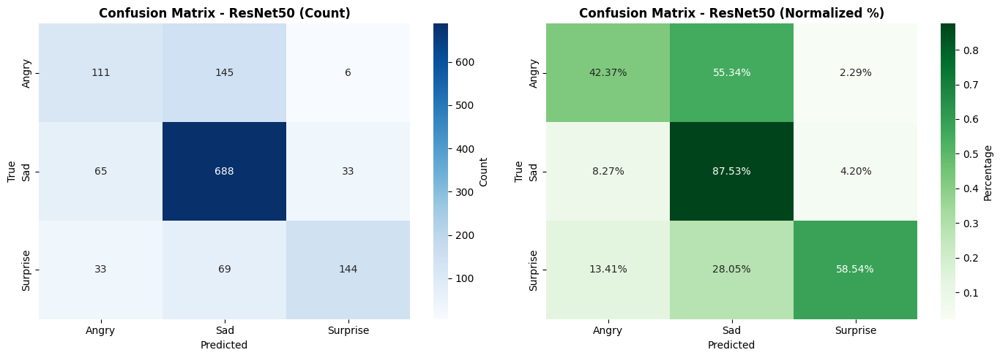

In [ ]:
# ============================================
# 7.2 Evaluasi & Classification Report (Enhanced)
# ============================================

print("\n" + "="*80)
print("📊 EVALUATION - RESNET50")
print("="*80)

val_gen_resnet.reset()
y_true = val_gen_resnet.classes
y_pred_proba = resnet_model.predict(val_gen_resnet, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)

print("\n" + "="*60)
print("📋 CLASSIFICATION REPORT - ResNet50 (Enhanced)")
print("="*60)
print(classification_report(y_true, y_pred, target_names=val_gen_resnet.class_indices.keys()))

# Confusion Matrix - Enhanced Version
cm = confusion_matrix(y_true, y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confusion Matrix (Count)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=val_gen_resnet.class_indices.keys(),
            yticklabels=val_gen_resnet.class_indices.keys(),
            cbar_kws={'label': 'Count'})
axes[0].set_title("Confusion Matrix - ResNet50 (Count)", fontsize=12, fontweight='bold')
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

# Confusion Matrix (Normalized)
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1],
            xticklabels=val_gen_resnet.class_indices.keys(),
            yticklabels=val_gen_resnet.class_indices.keys(),
            cbar_kws={'label': 'Percentage'})
axes[1].set_title("Confusion Matrix - ResNet50 (Normalized %)", fontsize=12, fontweight='bold')
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()

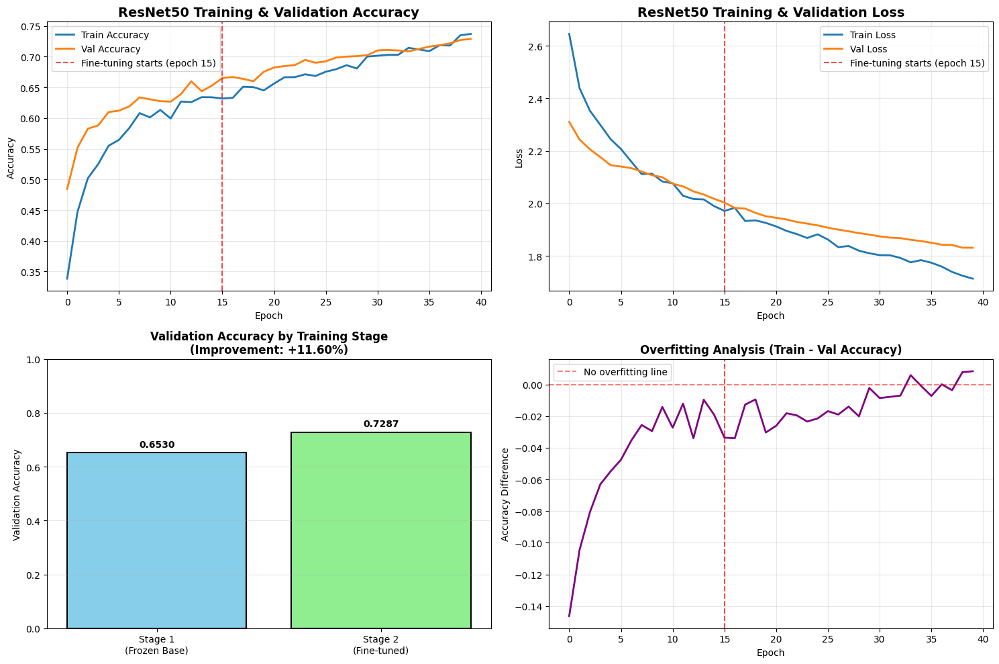

In [ ]:
# ============================================
# 7.3 Grafik Accuracy & Loss (Enhanced)
# ============================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Mark the transition between Stage 1 and Stage 2
stage1_epochs = len(history_stage1.history['accuracy'])

# Accuracy
axes[0, 0].plot(history_resnet['accuracy'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history_resnet['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0, 0].axvline(x=stage1_epochs, color='red', linestyle='--',
                   label=f'Fine-tuning starts (epoch {stage1_epochs})', alpha=0.7)
axes[0, 0].set_title('ResNet50 Training & Validation Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history_resnet['loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history_resnet['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].axvline(x=stage1_epochs, color='red', linestyle='--',
                   label=f'Fine-tuning starts (epoch {stage1_epochs})', alpha=0.7)
axes[0, 1].set_title('ResNet50 Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Stage comparison
stage1_val_acc = history_stage1.history['val_accuracy'][-1]
stage2_val_acc = history_stage2.history['val_accuracy'][-1]
improvement = ((stage2_val_acc - stage1_val_acc) / stage1_val_acc) * 100

stages = ['Stage 1\n(Frozen Base)', 'Stage 2\n(Fine-tuned)']
accuracies = [stage1_val_acc, stage2_val_acc]
colors = ['skyblue', 'lightgreen']

axes[1, 0].bar(stages, accuracies, color=colors, edgecolor='black', linewidth=1.5)
axes[1, 0].set_title(f'Validation Accuracy by Training Stage\n(Improvement: +{improvement:.2f}%)',
                     fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Validation Accuracy')
axes[1, 0].set_ylim([0, 1])
for i, acc in enumerate(accuracies):
    axes[1, 0].text(i, acc + 0.02, f'{acc:.4f}', ha='center', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Overfitting analysis
train_val_diff = np.array(history_resnet['accuracy']) - np.array(history_resnet['val_accuracy'])
axes[1, 1].plot(train_val_diff, linewidth=2, color='purple')
axes[1, 1].axhline(y=0, color='r', linestyle='--', alpha=0.5, label='No overfitting line')
axes[1, 1].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7)
axes[1, 1].set_title('Overfitting Analysis (Train - Val Accuracy)', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Accuracy Difference')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


🔍 DETAILED ERROR ANALYSIS - RESNET50

📊 Overall Performance:
Total Samples: 1294
Correctly Classified: 943 (72.87%)
Misclassified: 351 (27.13%)

--------------------------------------------------------------------------------
📈 Per-Class Detailed Analysis:
--------------------------------------------------------------------------------

🎯 Class: Angry
   Total Samples: 262
   Correct: 111 (42.37%)
   Misclassified: 151 (57.63%)
   Avg Confidence (All): 0.742 ± 0.169
   Avg Confidence (Correct): 0.739
   Avg Confidence (Incorrect): 0.744
   Confidence Gap: -0.005
   Confused with:
      → Sad: 145 times (96.0% of errors)
      → Surprise: 6 times (4.0% of errors)

🎯 Class: Sad
   Total Samples: 786
   Correct: 688 (87.53%)
   Misclassified: 98 (12.47%)
   Avg Confidence (All): 0.821 ± 0.170
   Avg Confidence (Correct): 0.849
   Avg Confidence (Incorrect): 0.626
   Confidence Gap: 0.223
   Confused with:
      → Angry: 65 times (66.3% of errors)
      → Surprise: 33 times (33.7% of erro

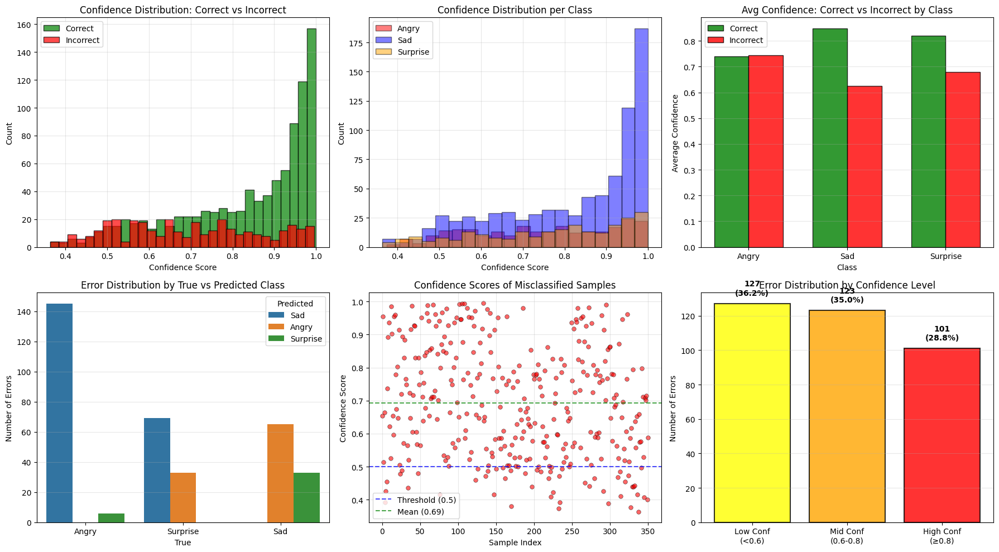


--------------------------------------------------------------------------------
⚠️ Error Confidence Breakdown:
--------------------------------------------------------------------------------
Low Confidence Errors (< 0.6): 127 (36.2%)
Medium Confidence Errors (0.6-0.8): 123 (35.0%)
High Confidence Errors (≥ 0.8): 101 (28.8%)

⚡ Most Confident Errors (Model was very sure, but wrong):
    True Predicted  Confidence
   Angry       Sad    0.995045
   Angry       Sad    0.993436
   Angry       Sad    0.993279
   Angry       Sad    0.991750
Surprise       Sad    0.990028
   Angry       Sad    0.989486
   Angry       Sad    0.988699
   Angry       Sad    0.986246
   Angry       Sad    0.984655
Surprise       Sad    0.981743

🤔 Least Confident Errors (Model was uncertain):
    True Predicted  Confidence
Surprise     Angry    0.363085
     Sad  Surprise    0.373052
Surprise       Sad    0.377308
     Sad  Surprise    0.379819
Surprise     Angry    0.389184
   Angry  Surprise    0.391503
     

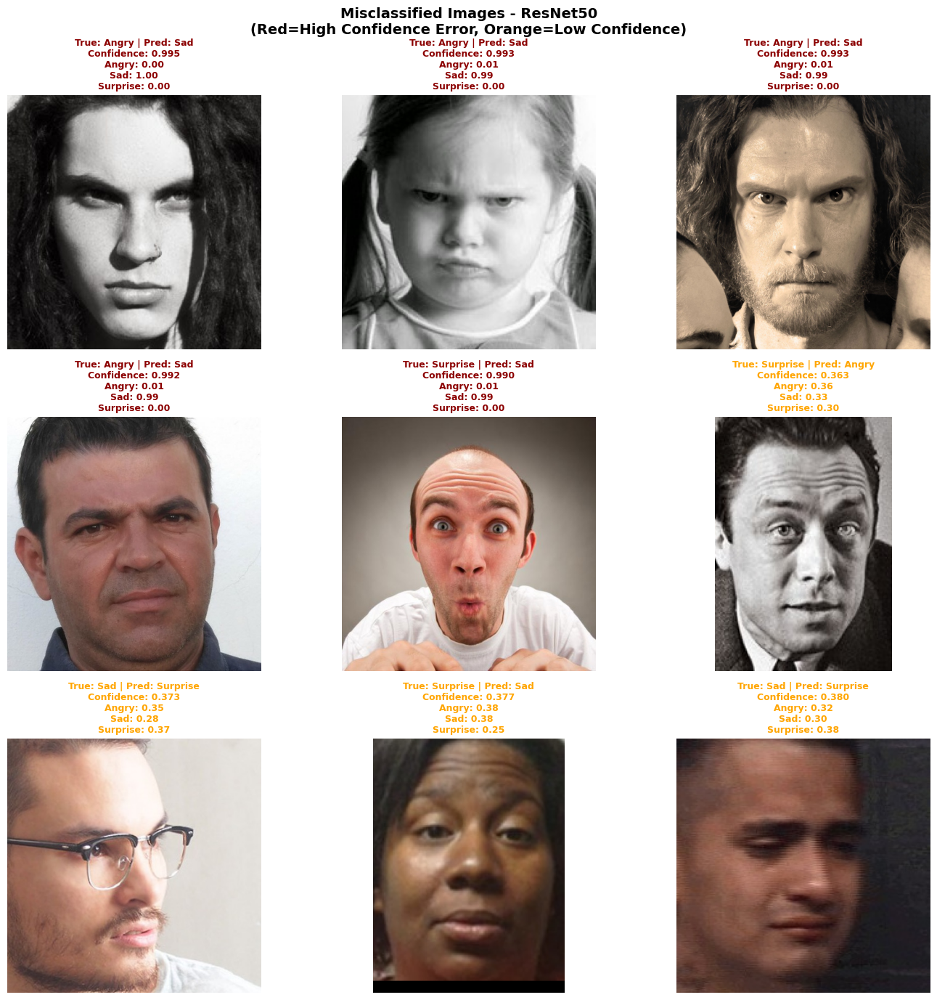


📋 RESNET50 PERFORMANCE SUMMARY
Overall Accuracy........................ 0.7287
Overall Error Rate...................... 0.2713
Avg Confidence (Correct)................ 0.8314
Avg Confidence (Incorrect).............. 0.6922
Confidence Reliability Gap.............. 0.1393

Per-Class Performance:

Angry:
  Accuracy: 0.4237
  Confidence (Correct): 0.7390
  Confidence (Incorrect): 0.7440

Sad:
  Accuracy: 0.8753
  Confidence (Correct): 0.8486
  Confidence (Incorrect): 0.6260

Surprise:
  Accuracy: 0.5854
  Confidence (Correct): 0.8209
  Confidence (Incorrect): 0.6791

✅ RESNET50 ERROR ANALYSIS COMPLETE!


In [ ]:
# ============================================
# 7.4 ERROR ANALYSIS - DETAILED & ENHANCED (ResNet50)
# ============================================

print("\n" + "="*80)
print("🔍 DETAILED ERROR ANALYSIS - RESNET50")
print("="*80)

class_names = list(val_gen_resnet.class_indices.keys())
misclassified_idx = np.where(y_true != y_pred)[0]
correctly_classified_idx = np.where(y_true == y_pred)[0]

print(f"\n📊 Overall Performance:")
print(f"Total Samples: {len(y_true)}")
print(f"Correctly Classified: {len(correctly_classified_idx)} ({len(correctly_classified_idx)/len(y_true)*100:.2f}%)")
print(f"Misclassified: {len(misclassified_idx)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)")

# 1. Per-Class Detailed Analysis
print("\n" + "-"*80)
print("📈 Per-Class Detailed Analysis:")
print("-"*80)

per_class_analysis = {}

for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_true = y_true[cls_mask]
    cls_pred = y_pred[cls_mask]
    cls_proba = y_pred_proba[cls_mask]

    correct = np.sum(cls_true == cls_pred)
    total = len(cls_true)
    accuracy = correct / total if total > 0 else 0

    # Confidence analysis
    confidence_scores = np.max(cls_proba, axis=1)
    avg_confidence = np.mean(confidence_scores)
    std_confidence = np.std(confidence_scores)

    # Separate confidence for correct vs incorrect
    correct_mask = (cls_true == cls_pred)
    correct_confidence = confidence_scores[correct_mask]
    incorrect_confidence = confidence_scores[~correct_mask]

    avg_correct_conf = np.mean(correct_confidence) if len(correct_confidence) > 0 else 0
    avg_incorrect_conf = np.mean(incorrect_confidence) if len(incorrect_confidence) > 0 else 0

    # Confusion analysis
    misclass_targets = cls_pred[cls_true != cls_pred]

    per_class_analysis[cls] = {
        'total': total,
        'correct': correct,
        'accuracy': accuracy,
        'avg_confidence': avg_confidence,
        'std_confidence': std_confidence,
        'avg_correct_conf': avg_correct_conf,
        'avg_incorrect_conf': avg_incorrect_conf,
        'misclass_targets': misclass_targets
    }

    print(f"\n🎯 Class: {cls}")
    print(f"   Total Samples: {total}")
    print(f"   Correct: {correct} ({accuracy*100:.2f}%)")
    print(f"   Misclassified: {total - correct} ({(1-accuracy)*100:.2f}%)")
    print(f"   Avg Confidence (All): {avg_confidence:.3f} ± {std_confidence:.3f}")
    print(f"   Avg Confidence (Correct): {avg_correct_conf:.3f}")
    print(f"   Avg Confidence (Incorrect): {avg_incorrect_conf:.3f}")
    print(f"   Confidence Gap: {avg_correct_conf - avg_incorrect_conf:.3f}")

    if len(misclass_targets) > 0:
        print(f"   Confused with:")
        for target_idx in np.unique(misclass_targets):
            count = np.sum(misclass_targets == target_idx)
            percentage = (count / (total - correct)) * 100
            print(f"      → {class_names[target_idx]}: {count} times ({percentage:.1f}% of errors)")

# 2. Comprehensive Confidence Analysis
print("\n" + "-"*80)
print("📊 Confidence Score Analysis:")
print("-"*80)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 2.1 Overall confidence distribution
correct_confidence = np.max(y_pred_proba[correctly_classified_idx], axis=1)
incorrect_confidence = np.max(y_pred_proba[misclassified_idx], axis=1)

axes[0, 0].hist(correct_confidence, bins=30, alpha=0.7, label='Correct', color='green', edgecolor='black')
axes[0, 0].hist(incorrect_confidence, bins=30, alpha=0.7, label='Incorrect', color='red', edgecolor='black')
axes[0, 0].set_title('Confidence Distribution: Correct vs Incorrect')
axes[0, 0].set_xlabel('Confidence Score')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

print(f"Overall Avg Confidence (Correct): {np.mean(correct_confidence):.3f}")
print(f"Overall Avg Confidence (Incorrect): {np.mean(incorrect_confidence):.3f}")
print(f"Confidence Gap: {np.mean(correct_confidence) - np.mean(incorrect_confidence):.3f}")

# 2.2 Per-class confidence distribution
colors_map = {'Angry': 'red', 'Sad': 'blue', 'Surprise': 'orange'}
for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_confidence = np.max(y_pred_proba[cls_mask], axis=1)
    axes[0, 1].hist(cls_confidence, bins=20, alpha=0.5,
                    label=cls, color=colors_map.get(cls, 'gray'), edgecolor='black')

axes[0, 1].set_title('Confidence Distribution per Class')
axes[0, 1].set_xlabel('Confidence Score')
axes[0, 1].set_ylabel('Count')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 2.3 Confidence comparison by class
class_conf_data = []
for cls in class_names:
    data = per_class_analysis[cls]
    class_conf_data.append({
        'Class': cls,
        'Correct': data['avg_correct_conf'],
        'Incorrect': data['avg_incorrect_conf']
    })

conf_df = pd.DataFrame(class_conf_data)
x_pos = np.arange(len(class_names))
width = 0.35

axes[0, 2].bar(x_pos - width/2, conf_df['Correct'], width,
               label='Correct', color='green', alpha=0.8, edgecolor='black')
axes[0, 2].bar(x_pos + width/2, conf_df['Incorrect'], width,
               label='Incorrect', color='red', alpha=0.8, edgecolor='black')
axes[0, 2].set_title('Avg Confidence: Correct vs Incorrect by Class')
axes[0, 2].set_xlabel('Class')
axes[0, 2].set_ylabel('Average Confidence')
axes[0, 2].set_xticks(x_pos)
axes[0, 2].set_xticklabels(class_names)
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3, axis='y')

# 3. Error Pattern Analysis
errors_df = pd.DataFrame({
    "True": [class_names[i] for i in y_true[misclassified_idx]],
    "Predicted": [class_names[i] for i in y_pred[misclassified_idx]],
    "Confidence": np.max(y_pred_proba[misclassified_idx], axis=1)
})

error_counts = errors_df.groupby(["True", "Predicted"]).agg({
    'Confidence': ['count', 'mean']
}).reset_index()
error_counts.columns = ['True', 'Predicted', 'Count', 'Avg_Confidence']
error_counts = error_counts.sort_values('Count', ascending=False)

# 3.1 Error distribution
sns.barplot(data=error_counts, x="True", y="Count", hue="Predicted", ax=axes[1, 0])
axes[1, 0].set_title('Error Distribution by True vs Predicted Class')
axes[1, 0].set_ylabel('Number of Errors')
axes[1, 0].grid(True, alpha=0.3, axis='y')

print(f"\n🔴 Top Confusion Patterns:")
print(error_counts.head(10).to_string(index=False))

# 3.2 Confidence of errors
axes[1, 1].scatter(range(len(errors_df)), errors_df['Confidence'],
                   alpha=0.6, c='red', s=30, edgecolors='black', linewidth=0.5)
axes[1, 1].axhline(y=0.5, color='blue', linestyle='--',
                   label='Threshold (0.5)', alpha=0.7)
axes[1, 1].axhline(y=np.mean(errors_df['Confidence']), color='green',
                   linestyle='--', label=f'Mean ({np.mean(errors_df["Confidence"]):.2f})', alpha=0.7)
axes[1, 1].set_title('Confidence Scores of Misclassified Samples')
axes[1, 1].set_xlabel('Sample Index')
axes[1, 1].set_ylabel('Confidence Score')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# 3.3 Low vs High confidence errors
low_confidence_threshold = 0.6
high_confidence_threshold = 0.8

low_conf_errors = errors_df[errors_df['Confidence'] < low_confidence_threshold]
high_conf_errors = errors_df[errors_df['Confidence'] >= high_confidence_threshold]
mid_conf_errors = errors_df[(errors_df['Confidence'] >= low_confidence_threshold) &
                            (errors_df['Confidence'] < high_confidence_threshold)]

error_categories = ['Low Conf\n(<0.6)', 'Mid Conf\n(0.6-0.8)', 'High Conf\n(≥0.8)']
error_category_counts = [len(low_conf_errors), len(mid_conf_errors), len(high_conf_errors)]

axes[1, 2].bar(error_categories, error_category_counts,
               color=['yellow', 'orange', 'red'], alpha=0.8, edgecolor='black', linewidth=1.5)
axes[1, 2].set_title('Error Distribution by Confidence Level')
axes[1, 2].set_ylabel('Number of Errors')
axes[1, 2].grid(True, alpha=0.3, axis='y')

for i, count in enumerate(error_category_counts):
    percentage = (count / len(errors_df)) * 100
    axes[1, 2].text(i, count + 5, f'{count}\n({percentage:.1f}%)',
                   ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# 4. Detailed Breakdown
print("\n" + "-"*80)
print("⚠️ Error Confidence Breakdown:")
print("-"*80)
print(f"Low Confidence Errors (< {low_confidence_threshold}): {len(low_conf_errors)} ({len(low_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"Medium Confidence Errors ({low_confidence_threshold}-{high_confidence_threshold}): {len(mid_conf_errors)} ({len(mid_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"High Confidence Errors (≥ {high_confidence_threshold}): {len(high_conf_errors)} ({len(high_conf_errors)/len(errors_df)*100:.1f}%)")

if len(high_conf_errors) > 0:
    print(f"\n⚡ Most Confident Errors (Model was very sure, but wrong):")
    print(high_conf_errors.nlargest(10, 'Confidence').to_string(index=False))

if len(low_conf_errors) > 0:
    print(f"\n🤔 Least Confident Errors (Model was uncertain):")
    print(low_conf_errors.nsmallest(10, 'Confidence').to_string(index=False))

# 5. Visual Error Analysis - Sample Images
print("\n" + "-"*80)
print("🔬 Visual Analysis - Misclassified Examples:")
print("-"*80)

num_examples = min(9, len(misclassified_idx))
if num_examples > 0:
    fig, axes = plt.subplots(3, 3, figsize=(14, 14))
    axes = axes.ravel()

    # Show diverse examples: some low confidence, some high confidence
    if len(high_conf_errors) > 0 and len(low_conf_errors) > 0:
        # Mix of high and low confidence errors
        sample_indices = (
            list(high_conf_errors.nlargest(5, 'Confidence').index) +
            list(low_conf_errors.nsmallest(4, 'Confidence').index)
        )[:9]
    else:
        sample_indices = misclassified_idx[:9]

    for plot_idx, sample_idx in enumerate(sample_indices):
        if plot_idx >= 9:
            break

        # Find actual index in misclassified_idx
        actual_idx = misclassified_idx[sample_idx] if sample_idx < len(misclassified_idx) else misclassified_idx[plot_idx]

        img_path = val_gen_resnet.filepaths[actual_idx]
        img = Image.open(img_path)

        true_label = class_names[y_true[actual_idx]]
        pred_label = class_names[y_pred[actual_idx]]
        confidence = np.max(y_pred_proba[actual_idx])

        # All class probabilities
        probs = y_pred_proba[actual_idx]
        prob_text = "\n".join([f"{class_names[j]}: {probs[j]:.2f}" for j in range(len(class_names))])

        axes[plot_idx].imshow(img)
        title_color = 'darkred' if confidence >= high_confidence_threshold else 'orange'
        axes[plot_idx].set_title(
            f"True: {true_label} | Pred: {pred_label}\n"
            f"Confidence: {confidence:.3f}\n{prob_text}",
            fontsize=9, color=title_color, fontweight='bold'
        )
        axes[plot_idx].axis('off')

    # Hide unused subplots
    for plot_idx in range(num_examples, 9):
        axes[plot_idx].axis('off')

    plt.suptitle("Misclassified Images - ResNet50\n(Red=High Confidence Error, Orange=Low Confidence)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# 6. Model Performance Summary
print("\n" + "="*80)
print("📋 RESNET50 PERFORMANCE SUMMARY")
print("="*80)

summary_metrics = {
    'Overall Accuracy': len(correctly_classified_idx) / len(y_true),
    'Overall Error Rate': len(misclassified_idx) / len(y_true),
    'Avg Confidence (Correct)': np.mean(correct_confidence),
    'Avg Confidence (Incorrect)': np.mean(incorrect_confidence),
    'Confidence Reliability Gap': np.mean(correct_confidence) - np.mean(incorrect_confidence),
}

for metric, value in summary_metrics.items():
    print(f"{metric:.<40} {value:.4f}")

print("\nPer-Class Performance:")
for cls in class_names:
    data = per_class_analysis[cls]
    print(f"\n{cls}:")
    print(f"  Accuracy: {data['accuracy']:.4f}")
    print(f"  Confidence (Correct): {data['avg_correct_conf']:.4f}")
    print(f"  Confidence (Incorrect): {data['avg_incorrect_conf']:.4f}")

print("\n" + "="*80)
print("✅ RESNET50 ERROR ANALYSIS COMPLETE!")
print("="*80)

In [ ]:
# ============================================
# 7.5 Save ResNet50 Model
# ============================================

from datetime import datetime
import os
import json
import numpy as np
from tensorflow.keras.models import load_model # Added for quick test at the end of the cell if needed

# Buat folder untuk menyimpan model (define it here)
model_save_dir = "/content/saved_models"
os.makedirs(model_save_dir, exist_ok=True)

timestamp_resnet = datetime.now().strftime("%Y%m%d_%H%M%S")
model_name_resnet = "resnet50_model"

# Save full model
resnet_model.save(os.path.join(model_save_dir, f"{model_name_resnet}.keras"))

# Save weights (PERHATIKAN format .weights.h5)
resnet_model.save_weights(os.path.join(model_save_dir, f"{model_name_resnet}.weights.h5"))

# Save architecture
with open(os.path.join(model_save_dir, f"{model_name_resnet}_architecture.json"), 'w') as f:
    f.write(resnet_model.to_json())

# Save training history (gabungan stage 1 dan 2)
with open(os.path.join(model_save_dir, f"{model_name_resnet}_history.json"), 'w') as f:
    # Convert numpy arrays in history_resnet to lists for JSON serialization
    history_resnet_serializable = {
        key: [float(val) for val in values]
        for key, values in history_resnet.items()
    }
    json.dump(history_resnet_serializable, f, indent=4)

# Save configuration
resnet_config = {
    "model_name": model_name_resnet,
    "timestamp": timestamp_resnet,
    "architecture": "ResNet50 Transfer Learning",
    "base_model": "ResNet50",
    "input_shape": [128, 128, 3],
    "num_classes": 3,
    "class_names": list(train_gen_resnet.class_indices.keys()),
    "total_params": int(resnet_model.count_params()),
    "trainable_params": int(sum([np.prod(w.shape) for w in resnet_model.trainable_weights])),
    "training_strategy": "Two-stage (frozen base + fine-tuning)",
    "stage1_epochs": len(history_stage1.history['loss']),
    "stage2_epochs": len(history_stage2.history['loss']),
    "total_epochs": len(history_resnet['loss']),
    "final_val_accuracy": float(history_resnet['val_accuracy'][-1]),
    "best_val_accuracy": float(max(history_resnet['val_accuracy'])),
    "final_val_loss": float(history_resnet['val_loss'][-1]), # Added final_val_loss
    "best_val_loss": float(min(history_resnet['val_loss'])) # Added best_val_loss
}

with open(os.path.join(model_save_dir, f"{model_name_resnet}_config.json"), 'w') as f:
    json.dump(resnet_config, f, indent=4)

print(f"✅ ResNet50 model saved successfully!")

✅ ResNet50 model saved successfully!


In [ ]:
# ============================================
# 7.6 Download ResNet50 Model Files (ZIP)
# ============================================

import zipfile
from datetime import datetime

print("\n" + "="*80)
print("📦 CREATING ZIP ARCHIVE FOR RESNET50 MODEL")
print("="*80)

# Nama file ZIP dengan timestamp
zip_timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
zip_filename = f"/content/resnet50_model_complete_{zip_timestamp}.zip"

# List file ResNet50 yang akan di-zip
resnet_files = [
    f"{model_name_resnet}.keras",
    f"{model_name_resnet}.weights.h5",
    f"{model_name_resnet}_architecture.json",
    f"{model_name_resnet}_history.json",
    f"{model_name_resnet}_config.json"
]

print("\n📋 Files to be included in ZIP:")
total_size = 0

# Compress semua file ResNet50 ke dalam ZIP
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for file in resnet_files:
        file_path = os.path.join(model_save_dir, file)
        if os.path.exists(file_path):
            # Calculate file size
            file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB
            total_size += file_size

            # Add to ZIP
            zipf.write(file_path, arcname=file)
            print(f"  ✅ {file} ({file_size:.2f} MB)")
        else:
            print(f"  ⚠️  {file} - File not found, skipping...")

print(f"\n📊 Archive Statistics:")
print(f"  Total files: {len([f for f in resnet_files if os.path.exists(os.path.join(model_save_dir, f))])}")
print(f"  Total size (uncompressed): {total_size:.2f} MB")

zip_size = os.path.getsize(zip_filename) / (1024 * 1024)
compression_ratio = ((total_size - zip_size) / total_size * 100) if total_size > 0 else 0

print(f"  ZIP size (compressed): {zip_size:.2f} MB")
print(f"  Compression ratio: {compression_ratio:.1f}% smaller")

print(f"\n✅ ZIP archive created successfully!")
print(f"📁 Location: {zip_filename}")

# Download file (hanya untuk Google Colab)
print("\n" + "-"*80)
print("⬇️  DOWNLOADING ZIP FILE...")
print("-"*80)

try:
    from google.colab import files
    files.download(zip_filename)
    print("✅ Download started! Check your browser's download folder.")
    print(f"   File name: resnet50_model_complete_{zip_timestamp}.zip")
    print(f"   File size: {zip_size:.2f} MB")
except ImportError:
    print("ℹ️  Not running in Google Colab - ZIP file saved locally at:")
    print(f"   {zip_filename}")
    print("   You can download it manually from the file browser.")
except Exception as e:
    print(f"⚠️  Error during download: {e}")
    print(f"   But ZIP file is still saved at: {zip_filename}")

# ============================================
# 7.7 Create Extraction Instructions
# ============================================

print("\n" + "="*80)
print("📖 HOW TO EXTRACT AND USE THE MODEL")
print("="*80)

instructions = f"""
EXTRACTION INSTRUCTIONS:
------------------------
1. Extract the ZIP file to your desired location
2. You will find the following files:
   - {model_name_resnet}.keras (Full model - easiest to use)
   - {model_name_resnet}.weights.h5 (Weights only)
   - {model_name_resnet}_architecture.json (Model structure)
   - {model_name_resnet}_history.json (Training history)
   - {model_name_resnet}_config.json (Model configuration)

LOADING THE MODEL:
------------------
Method 1 - Load Full Model (Recommended):
```python
from tensorflow.keras.models import load_model

# Load the complete model
model = load_model('path/to/{model_name_resnet}.keras')
print("Model loaded successfully!")

# Test prediction
import numpy as np
test_image = np.random.rand(1, 128, 128, 3)  # Example input
prediction = model.predict(test_image)
print(f"Prediction: {{prediction}}")
```

Method 2 - Load Architecture + Weights:
```python
import json
from tensorflow.keras.models import model_from_json
from tensorflow.keras.optimizers import Adam

# Load architecture
with open('path/to/{model_name_resnet}_architecture.json', 'r') as f:
    model_json = f.read()
model = model_from_json(model_json)

# Load weights
model.load_weights('path/to/{model_name_resnet}.weights.h5')

# Compile
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("Model loaded and compiled!")
```

LOAD CONFIGURATION & METADATA:
-------------------------------
```python
import json

# Load configuration
with open('path/to/{model_name_resnet}_config.json', 'r') as f:
    config = json.load(f)

print(f"Model: {{config['model_name']}}")
print(f"Architecture: {{config['architecture']}}")
print(f"Classes: {{config['class_names']}}")
print(f"Best Val Accuracy: {{config['best_val_accuracy']:.4f}}")
print(f"Total Parameters: {{config['total_params']:,}}")

# Load training history
with open('path/to/{model_name_resnet}_history.json', 'r') as f:
    history = json.load(f)

# Plot training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Train')
plt.plot(history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Train')
plt.plot(history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()
```

MAKING PREDICTIONS:
-------------------
```python
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np

# Load and preprocess image
img_path = 'path/to/your/image.jpg'
img = image.load_img(img_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)  # Important for ResNet50!

# Predict
predictions = model.predict(img_array)
class_names = {{config['class_names']}}  # ['Angry', 'Sad', 'Surprise']
predicted_class = class_names[np.argmax(predictions[0])]
confidence = np.max(predictions[0])

print(f"Predicted: {{predicted_class}}")
print(f"Confidence: {{confidence:.2%}}")
print(f"All probabilities: {{dict(zip(class_names, predictions[0]))}}")
```

CLASS INDICES:
--------------
{dict(enumerate(resnet_config['class_names']))}

NOTES:
------
- Always use preprocess_input from ResNet50 for proper preprocessing
- Input shape: (128, 128, 3)
- Output shape: (3,) - probabilities for each class
- Training strategy: Two-stage (frozen base + fine-tuning)
- Stage 1 epochs: {resnet_config['stage1_epochs']}
- Stage 2 epochs: {resnet_config['stage2_epochs']}
- Total epochs: {resnet_config['total_epochs']}
- Best validation accuracy: {resnet_config['best_val_accuracy']:.4f}
"""

# Save instructions to file
instructions_path = os.path.join(model_save_dir, f"{model_name_resnet}_instructions.txt")
with open(instructions_path, 'w') as f:
    f.write(instructions)

print(instructions)

print("\n" + "="*80)
print("✅ RESNET50 MODEL DOWNLOAD COMPLETE!")
print("="*80)

# ============================================
# 7.8 Optional: Create a Combined ZIP (CNN + ResNet50)
# ============================================

print("\n" + "-"*80)
print("💡 BONUS: Create Combined ZIP with Both Models?")
print("-"*80)
print("Run the following code if you want to download both CNN and ResNet50 together:")

print("""
# Create combined ZIP
combined_zip = f"/content/all_models_{zip_timestamp}.zip"

with zipfile.ZipFile(combined_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Add all files from saved_models directory
    for root, dirs, files in os.walk(model_save_dir):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, model_save_dir)
            zipf.write(file_path, arcname)

    print(f"✅ Combined ZIP created: {combined_zip}")

# Download
from google.colab import files
files.download(combined_zip)
print("⬇️ Download started!")
""")

# Quick summary
print("\n" + "="*80)
print("📊 FINAL SUMMARY")
print("="*80)
print(f"✅ ResNet50 model files saved to: {model_save_dir}")
print(f"✅ ZIP archive created: {zip_filename}")
print(f"✅ Instructions file: {instructions_path}")
print(f"\n📁 Saved files for ResNet50:")
for idx, file in enumerate(resnet_files, 1):
    file_path = os.path.join(model_save_dir, file)
    if os.path.exists(file_path):
        size = os.path.getsize(file_path) / (1024 * 1024)
        print(f"   {idx}. {file} ({size:.2f} MB)")

print("\n" + "="*80)



📦 CREATING ZIP ARCHIVE FOR RESNET50 MODEL

📋 Files to be included in ZIP:
  ✅ resnet50_model.keras (214.89 MB)
  ✅ resnet50_model.weights.h5 (214.72 MB)
  ✅ resnet50_model_architecture.json (0.16 MB)
  ✅ resnet50_model_history.json (0.00 MB)
  ✅ resnet50_model_config.json (0.00 MB)

📊 Archive Statistics:
  Total files: 5
  Total size (uncompressed): 429.78 MB
  ZIP size (compressed): 395.08 MB
  Compression ratio: 8.1% smaller

✅ ZIP archive created successfully!
📁 Location: /content/resnet50_model_complete_20251224_070124.zip

--------------------------------------------------------------------------------
⬇️  DOWNLOADING ZIP FILE...
--------------------------------------------------------------------------------


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Download started! Check your browser's download folder.
   File name: resnet50_model_complete_20251224_070124.zip
   File size: 395.08 MB

📖 HOW TO EXTRACT AND USE THE MODEL

EXTRACTION INSTRUCTIONS:
------------------------
1. Extract the ZIP file to your desired location
2. You will find the following files:
   - resnet50_model.keras (Full model - easiest to use)
   - resnet50_model.weights.h5 (Weights only)
   - resnet50_model_architecture.json (Model structure)
   - resnet50_model_history.json (Training history)
   - resnet50_model_config.json (Model configuration)

LOADING THE MODEL:
------------------
Method 1 - Load Full Model (Recommended):
```python
from tensorflow.keras.models import load_model

# Load the complete model
model = load_model('path/to/resnet50_model.keras')
print("Model loaded successfully!")

# Test prediction
import numpy as np
test_image = np.random.rand(1, 128, 128, 3)  # Example input
prediction = model.predict(test_image)
print(f"Prediction: {prediction}

### Model 3 - MobileNetV2

#### 8.1 Model 3: MobileNetV2

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

# ============================================
# 8.1 Model 3: MobileNetV2 (Enhanced)
# ============================================

print("\n" + "="*80)
print("📱 MOBILENETV2 - ENHANCED VERSION")
print("="*80)

# PERBAIKAN 1: Preprocessing khusus untuk MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess

img_size = (128, 128)
batch_size = 32

# Data generator dengan preprocessing MobileNetV2
train_datagen_mobilenet = ImageDataGenerator(
    preprocessing_function=mobilenet_preprocess,  # Khusus untuk MobileNetV2
    validation_split=0.2,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

train_gen_mobilenet = train_datagen_mobilenet.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_datagen_mobilenet = ImageDataGenerator(
    preprocessing_function=mobilenet_preprocess,  # Penting untuk validation juga
    validation_split=0.2
)

val_gen_mobilenet = val_datagen_mobilenet.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# PERBAIKAN 2: Base model MobileNetV2 dengan fine-tuning strategy yang lebih baik
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(128, 128, 3)
)

# Strategy: Freeze all layers initially
for layer in base_model.layers:
    layer.trainable = False

# PERBAIKAN 3: Custom head yang lebih robust
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x)

mobilenet_model = Model(inputs=base_model.input, outputs=preds)

print(f"\n📊 Model Info:")
print(f"Total layers: {len(mobilenet_model.layers)}")
print(f"Trainable layers (initial): {sum([layer.trainable for layer in mobilenet_model.layers])}")

# Compile dengan learning rate rendah untuk transfer learning
mobilenet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks yang lebih baik
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
    verbose=1
)

# PERBAIKAN 4: Two-stage training

print("\n" + "-"*80)
print("🎯 STAGE 1: Training custom head only (frozen base)")
print("-"*80)

# Stage 1: Train only the custom head
history_stage1 = mobilenet_model.fit(
    train_gen_mobilenet,
    validation_data=val_gen_mobilenet,
    epochs=15,
    callbacks=[early_stop, reduce_lr],
    class_weight=class_weights_dict,
    verbose=1
)

print("\n" + "-"*80)
print("🎯 STAGE 2: Fine-tuning top layers of base model")
print("-"*80)

# Stage 2: Unfreeze top layers for fine-tuning
# MobileNetV2 has fewer layers than ResNet50, so unfreeze last 30 layers
for layer in base_model.layers[-30:]:
    layer.trainable = True

print(f"Trainable layers (after unfreezing): {sum([layer.trainable for layer in mobilenet_model.layers])}")

# Recompile dengan learning rate lebih rendah untuk fine-tuning
mobilenet_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Learning rate sangat kecil
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tuning
early_stop_ft = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_ft = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=4,
    min_lr=1e-8,
    verbose=1
)

history_stage2 = mobilenet_model.fit(
    train_gen_mobilenet,
    validation_data=val_gen_mobilenet,
    epochs=25,
    callbacks=[early_stop_ft, reduce_lr_ft],
    class_weight=class_weights_dict,
    verbose=1
)

# Combine histories
history_mobilenet = {
    'accuracy': history_stage1.history['accuracy'] + history_stage2.history['accuracy'],
    'val_accuracy': history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy'],
    'loss': history_stage1.history['loss'] + history_stage2.history['loss'],
    'val_loss': history_stage1.history['val_loss'] + history_stage2.history['val_loss']
}




📱 MOBILENETV2 - ENHANCED VERSION
Found 5187 images belonging to 3 classes.
Found 1294 images belonging to 3 classes.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

📊 Model Info:
Total layers: 165
Trainable layers (initial): 11

--------------------------------------------------------------------------------
🎯 STAGE 1: Training custom head only (frozen base)
--------------------------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 98s 481ms/step - accuracy: 0.2760 - loss: 2.7599 - val_accuracy: 0.4498 - val_loss: 2.2786 - learning_rate: 1.0000e-04
Epoch 2/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 312ms/step - accuracy: 0.3913 - loss: 2.4809 - val_accuracy: 0.5657 - val_loss: 2.1485 - learning_rate: 1.0000e-04
Epoch 3/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 314ms/step - accuracy: 0.4381 - loss: 2.3933 - val_accuracy: 0.5811 - val_loss: 2.1167 - learning_rate: 1.0000e-04
Epoch 4/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 52s 313ms/step - accuracy: 0.4866 - loss: 2.2942 - val_accuracy: 0.5958 - val_loss: 2.0890 - learning_rate: 1.0000e-04
Epoch 5/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 312ms/step - accuracy: 0.5076 - loss: 2.2739 - val_accuracy: 0.6005 - val_loss: 2.0789 - learning_rate: 1.0000e-04
Epoch 6/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 312ms/step - accuracy: 0.5312 - loss: 2.1955 - val_accuracy: 0.6005 - val_loss: 2.0744 - learning_rate: 1.0000e-04
Epoch 7/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 51s 31


📊 EVALUATION - MOBILENETV2
41/41 ━━━━━━━━━━━━━━━━━━━━ 14s 240ms/step

📋 CLASSIFICATION REPORT - MobileNetV2 (Enhanced)
              precision    recall  f1-score   support

       Angry       0.51      0.45      0.48       262
         Sad       0.77      0.80      0.79       786
    Surprise       0.63      0.63      0.63       246

    accuracy                           0.70      1294
   macro avg       0.64      0.63      0.63      1294
weighted avg       0.69      0.70      0.70      1294



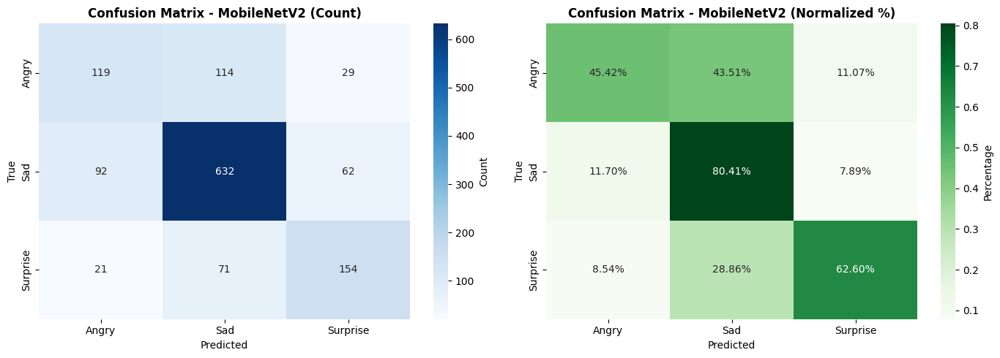

In [ ]:
# ============================================
# 8.2 Evaluasi & Classification Report (Enhanced)
# ============================================

print("\n" + "="*80)
print("📊 EVALUATION - MOBILENETV2")
print("="*80)

val_gen_mobilenet.reset()
y_true = val_gen_mobilenet.classes
y_pred_proba = mobilenet_model.predict(val_gen_mobilenet, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)

print("\n" + "="*60)
print("📋 CLASSIFICATION REPORT - MobileNetV2 (Enhanced)")
print("="*60)
print(classification_report(y_true, y_pred, target_names=val_gen_mobilenet.class_indices.keys()))

# Confusion Matrix - Enhanced Version
cm = confusion_matrix(y_true, y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confusion Matrix (Count)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=val_gen_mobilenet.class_indices.keys(),
            yticklabels=val_gen_mobilenet.class_indices.keys(),
            cbar_kws={'label': 'Count'})
axes[0].set_title("Confusion Matrix - MobileNetV2 (Count)", fontsize=12, fontweight='bold')
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

# Confusion Matrix (Normalized)
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1],
            xticklabels=val_gen_mobilenet.class_indices.keys(),
            yticklabels=val_gen_mobilenet.class_indices.keys(),
            cbar_kws={'label': 'Percentage'})
axes[1].set_title("Confusion Matrix - MobileNetV2 (Normalized %)", fontsize=12, fontweight='bold')
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()

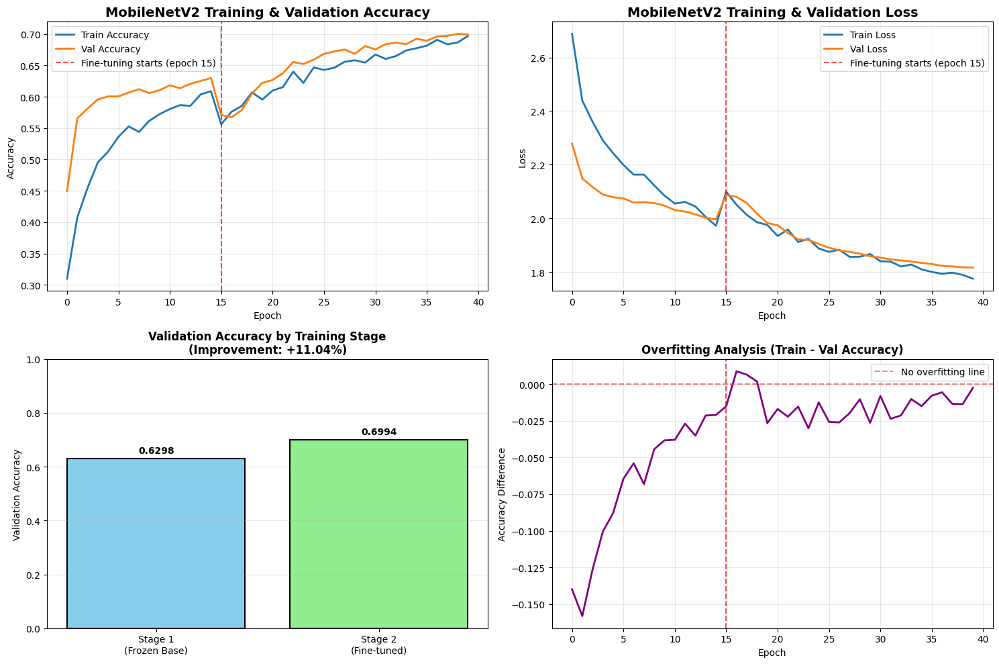

In [ ]:
# ============================================
# 8.3 Grafik Accuracy & Loss (Enhanced)
# ============================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Mark the transition between Stage 1 and Stage 2
stage1_epochs = len(history_stage1.history['accuracy'])

# Accuracy
axes[0, 0].plot(history_mobilenet['accuracy'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history_mobilenet['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[0, 0].axvline(x=stage1_epochs, color='red', linestyle='--',
                   label=f'Fine-tuning starts (epoch {stage1_epochs})', alpha=0.7)
axes[0, 0].set_title('MobileNetV2 Training & Validation Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history_mobilenet['loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history_mobilenet['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].axvline(x=stage1_epochs, color='red', linestyle='--',
                   label=f'Fine-tuning starts (epoch {stage1_epochs})', alpha=0.7)
axes[0, 1].set_title('MobileNetV2 Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Stage comparison
stage1_val_acc = history_stage1.history['val_accuracy'][-1]
stage2_val_acc = history_stage2.history['val_accuracy'][-1]
improvement = ((stage2_val_acc - stage1_val_acc) / stage1_val_acc) * 100

stages = ['Stage 1\n(Frozen Base)', 'Stage 2\n(Fine-tuned)']
accuracies = [stage1_val_acc, stage2_val_acc]
colors = ['skyblue', 'lightgreen']

axes[1, 0].bar(stages, accuracies, color=colors, edgecolor='black', linewidth=1.5)
axes[1, 0].set_title(f'Validation Accuracy by Training Stage\n(Improvement: +{improvement:.2f}%)',
                     fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Validation Accuracy')
axes[1, 0].set_ylim([0, 1])
for i, acc in enumerate(accuracies):
    axes[1, 0].text(i, acc + 0.02, f'{acc:.4f}', ha='center', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Overfitting analysis
train_val_diff = np.array(history_mobilenet['accuracy']) - np.array(history_mobilenet['val_accuracy'])
axes[1, 1].plot(train_val_diff, linewidth=2, color='purple')
axes[1, 1].axhline(y=0, color='r', linestyle='--', alpha=0.5, label='No overfitting line')
axes[1, 1].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7)
axes[1, 1].set_title('Overfitting Analysis (Train - Val Accuracy)', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Accuracy Difference')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


🔍 DETAILED ERROR ANALYSIS - MOBILENETV2

📊 Overall Performance:
Total Samples: 1294
Correctly Classified: 905 (69.94%)
Misclassified: 389 (30.06%)

--------------------------------------------------------------------------------
📈 Per-Class Detailed Analysis:
--------------------------------------------------------------------------------

🎯 Class: Angry
   Total Samples: 262
   Correct: 119 (45.42%)
   Misclassified: 143 (54.58%)
   Avg Confidence (All): 0.652 ± 0.161
   Avg Confidence (Correct): 0.660
   Avg Confidence (Incorrect): 0.646
   Confidence Gap: 0.014
   Confused with:
      → Sad: 114 times (79.7% of errors)
      → Surprise: 29 times (20.3% of errors)

🎯 Class: Sad
   Total Samples: 786
   Correct: 632 (80.41%)
   Misclassified: 154 (19.59%)
   Avg Confidence (All): 0.734 ± 0.171
   Avg Confidence (Correct): 0.766
   Avg Confidence (Incorrect): 0.603
   Confidence Gap: 0.163
   Confused with:
      → Angry: 92 times (59.7% of errors)
      → Surprise: 62 times (40.3% of

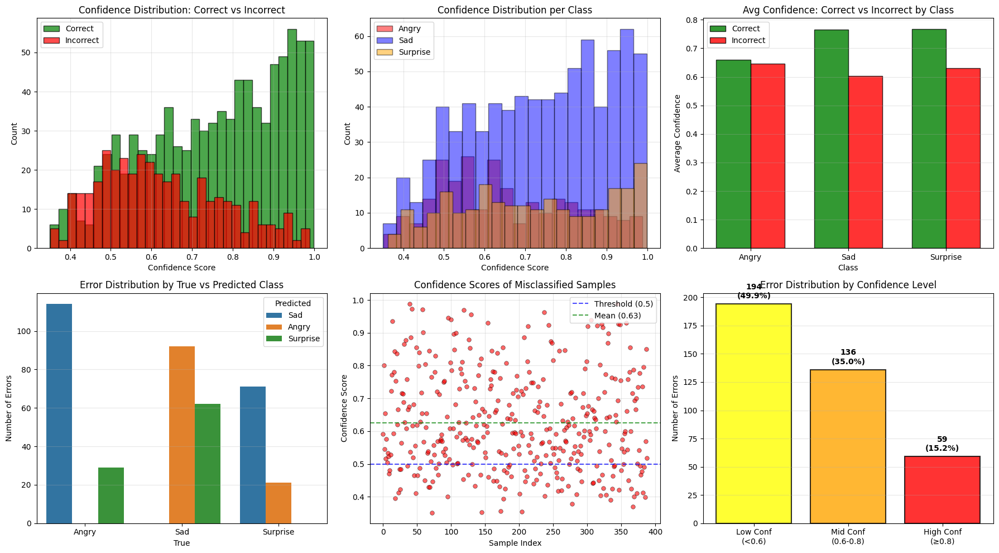


--------------------------------------------------------------------------------
⚠️ Error Confidence Breakdown:
--------------------------------------------------------------------------------
Low Confidence Errors (< 0.6): 194 (49.9%)
Medium Confidence Errors (0.6-0.8): 136 (35.0%)
High Confidence Errors (≥ 0.8): 59 (15.2%)

⚡ Most Confident Errors (Model was very sure, but wrong):
    True Predicted  Confidence
Surprise       Sad    0.988845
   Angry       Sad    0.987623
   Angry       Sad    0.972218
   Angry       Sad    0.971524
   Angry       Sad    0.968588
     Sad  Surprise    0.962727
   Angry       Sad    0.955679
   Angry       Sad    0.946046
   Angry       Sad    0.940180
Surprise       Sad    0.938175

🤔 Least Confident Errors (Model was uncertain):
    True Predicted  Confidence
   Angry  Surprise    0.351178
     Sad     Angry    0.353021
     Sad     Angry    0.353948
     Sad     Angry    0.355734
Surprise       Sad    0.370282
     Sad     Angry    0.378733
Surpri

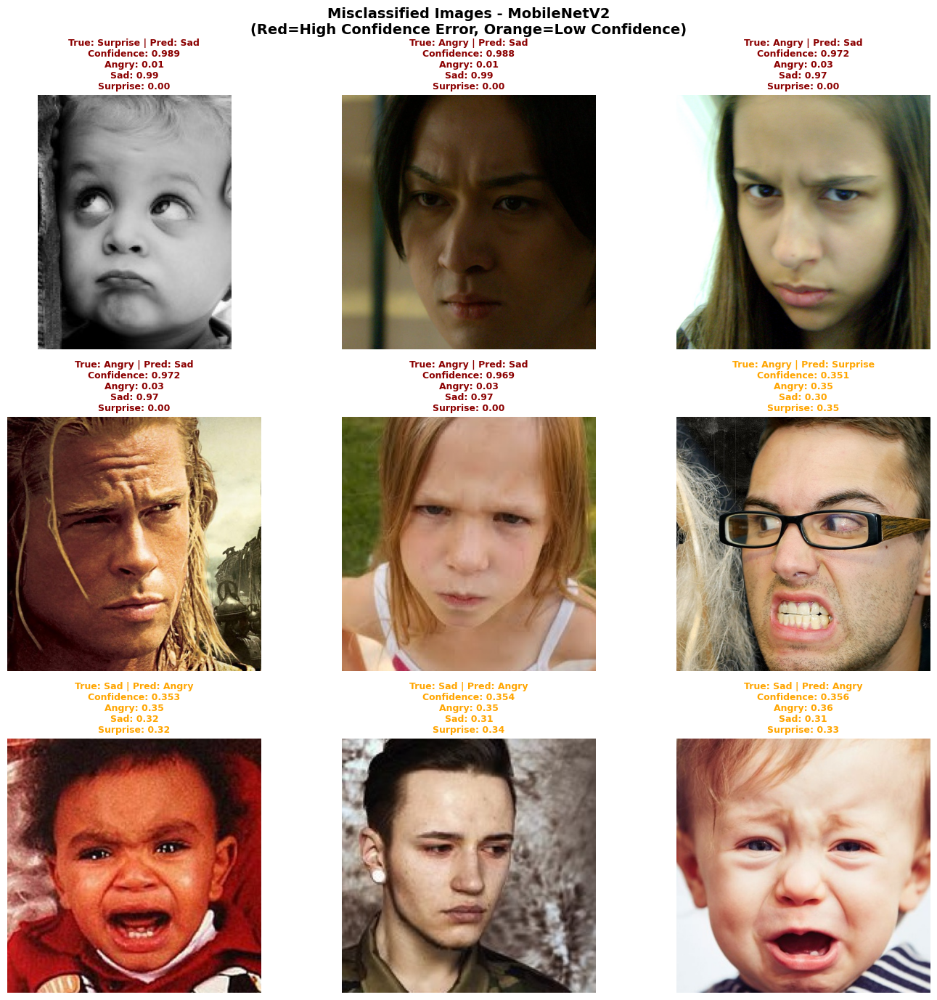


📋 MOBILENETV2 PERFORMANCE SUMMARY
Overall Accuracy........................ 0.6994
Overall Error Rate...................... 0.3006
Avg Confidence (Correct)................ 0.7525
Avg Confidence (Incorrect).............. 0.6256
Confidence Reliability Gap.............. 0.1269

Per-Class Performance:

Angry:
  Accuracy: 0.4542
  Confidence (Correct): 0.6598
  Confidence (Incorrect): 0.6459

Sad:
  Accuracy: 0.8041
  Confidence (Correct): 0.7663
  Confidence (Incorrect): 0.6033

Surprise:
  Accuracy: 0.6260
  Confidence (Correct): 0.7676
  Confidence (Incorrect): 0.6314

✅ MOBILENETV2 ERROR ANALYSIS COMPLETE!


In [ ]:
# ============================================
# 8.4 ERROR ANALYSIS - DETAILED & ENHANCED (MobileNetV2)
# ============================================

print("\n" + "="*80)
print("🔍 DETAILED ERROR ANALYSIS - MOBILENETV2")
print("="*80)

class_names = list(val_gen_mobilenet.class_indices.keys())
misclassified_idx = np.where(y_true != y_pred)[0]
correctly_classified_idx = np.where(y_true == y_pred)[0]

print(f"\n📊 Overall Performance:")
print(f"Total Samples: {len(y_true)}")
print(f"Correctly Classified: {len(correctly_classified_idx)} ({len(correctly_classified_idx)/len(y_true)*100:.2f}%)")
print(f"Misclassified: {len(misclassified_idx)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)")

# 1. Per-Class Detailed Analysis
print("\n" + "-"*80)
print("📈 Per-Class Detailed Analysis:")
print("-"*80)

per_class_analysis = {}

for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_true = y_true[cls_mask]
    cls_pred = y_pred[cls_mask]
    cls_proba = y_pred_proba[cls_mask]

    correct = np.sum(cls_true == cls_pred)
    total = len(cls_true)
    accuracy = correct / total if total > 0 else 0

    # Confidence analysis
    confidence_scores = np.max(cls_proba, axis=1)
    avg_confidence = np.mean(confidence_scores)
    std_confidence = np.std(confidence_scores)

    # Separate confidence for correct vs incorrect
    correct_mask = (cls_true == cls_pred)
    correct_confidence = confidence_scores[correct_mask]
    incorrect_confidence = confidence_scores[~correct_mask]

    avg_correct_conf = np.mean(correct_confidence) if len(correct_confidence) > 0 else 0
    avg_incorrect_conf = np.mean(incorrect_confidence) if len(incorrect_confidence) > 0 else 0

    # Confusion analysis
    misclass_targets = cls_pred[cls_true != cls_pred]

    per_class_analysis[cls] = {
        'total': total,
        'correct': correct,
        'accuracy': accuracy,
        'avg_confidence': avg_confidence,
        'std_confidence': std_confidence,
        'avg_correct_conf': avg_correct_conf,
        'avg_incorrect_conf': avg_incorrect_conf,
        'misclass_targets': misclass_targets
    }

    print(f"\n🎯 Class: {cls}")
    print(f"   Total Samples: {total}")
    print(f"   Correct: {correct} ({accuracy*100:.2f}%)")
    print(f"   Misclassified: {total - correct} ({(1-accuracy)*100:.2f}%)")
    print(f"   Avg Confidence (All): {avg_confidence:.3f} ± {std_confidence:.3f}")
    print(f"   Avg Confidence (Correct): {avg_correct_conf:.3f}")
    print(f"   Avg Confidence (Incorrect): {avg_incorrect_conf:.3f}")
    print(f"   Confidence Gap: {avg_correct_conf - avg_incorrect_conf:.3f}")

    if len(misclass_targets) > 0:
        print(f"   Confused with:")
        for target_idx in np.unique(misclass_targets):
            count = np.sum(misclass_targets == target_idx)
            percentage = (count / (total - correct)) * 100
            print(f"      → {class_names[target_idx]}: {count} times ({percentage:.1f}% of errors)")

# 2. Comprehensive Confidence Analysis
print("\n" + "-"*80)
print("📊 Confidence Score Analysis:")
print("-"*80)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 2.1 Overall confidence distribution
correct_confidence = np.max(y_pred_proba[correctly_classified_idx], axis=1)
incorrect_confidence = np.max(y_pred_proba[misclassified_idx], axis=1)

axes[0, 0].hist(correct_confidence, bins=30, alpha=0.7, label='Correct', color='green', edgecolor='black')
axes[0, 0].hist(incorrect_confidence, bins=30, alpha=0.7, label='Incorrect', color='red', edgecolor='black')
axes[0, 0].set_title('Confidence Distribution: Correct vs Incorrect')
axes[0, 0].set_xlabel('Confidence Score')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

print(f"Overall Avg Confidence (Correct): {np.mean(correct_confidence):.3f}")
print(f"Overall Avg Confidence (Incorrect): {np.mean(incorrect_confidence):.3f}")
print(f"Confidence Gap: {np.mean(correct_confidence) - np.mean(incorrect_confidence):.3f}")

# 2.2 Per-class confidence distribution
colors_map = {'Angry': 'red', 'Sad': 'blue', 'Surprise': 'orange'}
for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_confidence = np.max(y_pred_proba[cls_mask], axis=1)
    axes[0, 1].hist(cls_confidence, bins=20, alpha=0.5,
                    label=cls, color=colors_map.get(cls, 'gray'), edgecolor='black')

axes[0, 1].set_title('Confidence Distribution per Class')
axes[0, 1].set_xlabel('Confidence Score')
axes[0, 1].set_ylabel('Count')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 2.3 Confidence comparison by class
class_conf_data = []
for cls in class_names:
    data = per_class_analysis[cls]
    class_conf_data.append({
        'Class': cls,
        'Correct': data['avg_correct_conf'],
        'Incorrect': data['avg_incorrect_conf']
    })

conf_df = pd.DataFrame(class_conf_data)
x_pos = np.arange(len(class_names))
width = 0.35

axes[0, 2].bar(x_pos - width/2, conf_df['Correct'], width,
               label='Correct', color='green', alpha=0.8, edgecolor='black')
axes[0, 2].bar(x_pos + width/2, conf_df['Incorrect'], width,
               label='Incorrect', color='red', alpha=0.8, edgecolor='black')
axes[0, 2].set_title('Avg Confidence: Correct vs Incorrect by Class')
axes[0, 2].set_xlabel('Class')
axes[0, 2].set_ylabel('Average Confidence')
axes[0, 2].set_xticks(x_pos)
axes[0, 2].set_xticklabels(class_names)
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3, axis='y')

# 3. Error Pattern Analysis
errors_df = pd.DataFrame({
    "True": [class_names[i] for i in y_true[misclassified_idx]],
    "Predicted": [class_names[i] for i in y_pred[misclassified_idx]],
    "Confidence": np.max(y_pred_proba[misclassified_idx], axis=1)
})

error_counts = errors_df.groupby(["True", "Predicted"]).agg({
    'Confidence': ['count', 'mean']
}).reset_index()
error_counts.columns = ['True', 'Predicted', 'Count', 'Avg_Confidence']
error_counts = error_counts.sort_values('Count', ascending=False)

# 3.1 Error distribution
sns.barplot(data=error_counts, x="True", y="Count", hue="Predicted", ax=axes[1, 0])
axes[1, 0].set_title('Error Distribution by True vs Predicted Class')
axes[1, 0].set_ylabel('Number of Errors')
axes[1, 0].grid(True, alpha=0.3, axis='y')

print(f"\n🔴 Top Confusion Patterns:")
print(error_counts.head(10).to_string(index=False))

# 3.2 Confidence of errors
axes[1, 1].scatter(range(len(errors_df)), errors_df['Confidence'],
                   alpha=0.6, c='red', s=30, edgecolors='black', linewidth=0.5)
axes[1, 1].axhline(y=0.5, color='blue', linestyle='--',
                   label='Threshold (0.5)', alpha=0.7)
axes[1, 1].axhline(y=np.mean(errors_df['Confidence']), color='green',
                   linestyle='--', label=f'Mean ({np.mean(errors_df["Confidence"]):.2f})', alpha=0.7)
axes[1, 1].set_title('Confidence Scores of Misclassified Samples')
axes[1, 1].set_xlabel('Sample Index')
axes[1, 1].set_ylabel('Confidence Score')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# 3.3 Low vs High confidence errors
low_confidence_threshold = 0.6
high_confidence_threshold = 0.8

low_conf_errors = errors_df[errors_df['Confidence'] < low_confidence_threshold]
high_conf_errors = errors_df[errors_df['Confidence'] >= high_confidence_threshold]
mid_conf_errors = errors_df[(errors_df['Confidence'] >= low_confidence_threshold) &
                            (errors_df['Confidence'] < high_confidence_threshold)]

error_categories = ['Low Conf\n(<0.6)', 'Mid Conf\n(0.6-0.8)', 'High Conf\n(≥0.8)']
error_category_counts = [len(low_conf_errors), len(mid_conf_errors), len(high_conf_errors)]

axes[1, 2].bar(error_categories, error_category_counts,
               color=['yellow', 'orange', 'red'], alpha=0.8, edgecolor='black', linewidth=1.5)
axes[1, 2].set_title('Error Distribution by Confidence Level')
axes[1, 2].set_ylabel('Number of Errors')
axes[1, 2].grid(True, alpha=0.3, axis='y')

for i, count in enumerate(error_category_counts):
    percentage = (count / len(errors_df)) * 100
    axes[1, 2].text(i, count + 5, f'{count}\n({percentage:.1f}%)',
                   ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# 4. Detailed Breakdown
print("\n" + "-"*80)
print("⚠️ Error Confidence Breakdown:")
print("-"*80)
print(f"Low Confidence Errors (< {low_confidence_threshold}): {len(low_conf_errors)} ({len(low_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"Medium Confidence Errors ({low_confidence_threshold}-{high_confidence_threshold}): {len(mid_conf_errors)} ({len(mid_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"High Confidence Errors (≥ {high_confidence_threshold}): {len(high_conf_errors)} ({len(high_conf_errors)/len(errors_df)*100:.1f}%)")

if len(high_conf_errors) > 0:
    print(f"\n⚡ Most Confident Errors (Model was very sure, but wrong):")
    print(high_conf_errors.nlargest(10, 'Confidence').to_string(index=False))

if len(low_conf_errors) > 0:
    print(f"\n🤔 Least Confident Errors (Model was uncertain):")
    print(low_conf_errors.nsmallest(10, 'Confidence').to_string(index=False))

# 5. Visual Error Analysis - Sample Images
print("\n" + "-"*80)
print("🔬 Visual Analysis - Misclassified Examples:")
print("-"*80)

num_examples = min(9, len(misclassified_idx))
if num_examples > 0:
    fig, axes = plt.subplots(3, 3, figsize=(14, 14))
    axes = axes.ravel()

    # Show diverse examples: some low confidence, some high confidence
    if len(high_conf_errors) > 0 and len(low_conf_errors) > 0:
        # Mix of high and low confidence errors
        sample_indices = (
            list(high_conf_errors.nlargest(5, 'Confidence').index) +
            list(low_conf_errors.nsmallest(4, 'Confidence').index)
        )[:9]
    else:
        sample_indices = misclassified_idx[:9]

    for plot_idx, sample_idx in enumerate(sample_indices):
        if plot_idx >= 9:
            break

        # Find actual index in misclassified_idx
        actual_idx = misclassified_idx[sample_idx] if sample_idx < len(misclassified_idx) else misclassified_idx[plot_idx]

        img_path = val_gen_mobilenet.filepaths[actual_idx]
        img = Image.open(img_path)

        true_label = class_names[y_true[actual_idx]]
        pred_label = class_names[y_pred[actual_idx]]
        confidence = np.max(y_pred_proba[actual_idx])

        # All class probabilities
        probs = y_pred_proba[actual_idx]
        prob_text = "\n".join([f"{class_names[j]}: {probs[j]:.2f}" for j in range(len(class_names))])

        axes[plot_idx].imshow(img)
        title_color = 'darkred' if confidence >= high_confidence_threshold else 'orange'
        axes[plot_idx].set_title(
            f"True: {true_label} | Pred: {pred_label}\n"
            f"Confidence: {confidence:.3f}\n{prob_text}",
            fontsize=9, color=title_color, fontweight='bold'
        )
        axes[plot_idx].axis('off')

    # Hide unused subplots
    for plot_idx in range(num_examples, 9):
        axes[plot_idx].axis('off')

    plt.suptitle("Misclassified Images - MobileNetV2\n(Red=High Confidence Error, Orange=Low Confidence)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# 6. Model Performance Summary
print("\n" + "="*80)
print("📋 MOBILENETV2 PERFORMANCE SUMMARY")
print("="*80)

summary_metrics = {
    'Overall Accuracy': len(correctly_classified_idx) / len(y_true),
    'Overall Error Rate': len(misclassified_idx) / len(y_true),
    'Avg Confidence (Correct)': np.mean(correct_confidence),
    'Avg Confidence (Incorrect)': np.mean(incorrect_confidence),
    'Confidence Reliability Gap': np.mean(correct_confidence) - np.mean(incorrect_confidence),
}

for metric, value in summary_metrics.items():
    print(f"{metric:.<40} {value:.4f}")

print("\nPer-Class Performance:")
for cls in class_names:
    data = per_class_analysis[cls]
    print(f"\n{cls}:")
    print(f"  Accuracy: {data['accuracy']:.4f}")
    print(f"  Confidence (Correct): {data['avg_correct_conf']:.4f}")
    print(f"  Confidence (Incorrect): {data['avg_incorrect_conf']:.4f}")

print("\n" + "="*80)
print("✅ MOBILENETV2 ERROR ANALYSIS COMPLETE!")
print("="*80)

In [ ]:
# ============================================
# 8.5 Save MobileNetV2 Model (FIXED)
# ============================================

import json
from datetime import datetime

print("\n" + "="*80)
print("💾 SAVING MOBILENETV2 MODEL & ARTIFACTS")
print("="*80)

# Buat folder untuk menyimpan model (gunakan folder yang sama)
model_save_dir = "/content/saved_models-mobilenet"
os.makedirs(model_save_dir, exist_ok=True)

# Timestamp untuk versioning
timestamp_mobilenet = datetime.now().strftime("%Y%m%d_%H%M%S")
model_name_mobilenet = "mobilenetv2_model"

# ============================================
# 1. Save Full Model (Recommended - Keras format)
# ============================================
model_path_keras = os.path.join(model_save_dir, f"{model_name_mobilenet}.keras")
mobilenet_model.save(model_path_keras)
print(f"✅ Model saved (Keras format): {model_path_keras}")

# ============================================
# 2. Save Model Architecture (JSON)
# ============================================
model_json = mobilenet_model.to_json()
json_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_architecture.json")
with open(json_path, 'w') as json_file:
    json_file.write(model_json)
print(f"✅ Model architecture saved: {json_path}")

# ============================================
# 3. Save Model Weights Only
# ============================================
weights_path = os.path.join(model_save_dir, f"{model_name_mobilenet}.weights.h5")
mobilenet_model.save_weights(weights_path)
print(f"✅ Model weights saved: {weights_path}")

# ============================================
# 4. Save Model with Timestamp (Versioning)
# ============================================
versioned_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_{timestamp_mobilenet}.keras")
mobilenet_model.save(versioned_path)
print(f"✅ Versioned model saved: {versioned_path}")

# ============================================
# 5. Save Training History (gabungan stage 1 dan 2)
# ============================================
history_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_history.json")
with open(history_path, 'w') as f:
    json.dump(history_mobilenet, f, indent=4)
print(f"✅ Training history saved: {history_path}")

# ============================================
# 6. Save Class Indices Mapping
# ============================================
class_indices_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_class_indices.json")
with open(class_indices_path, 'w') as f:
    json.dump(train_gen_mobilenet.class_indices, f, indent=4)
print(f"✅ Class indices saved: {class_indices_path}")

# ============================================
# 7. Save Model Configuration & Metadata (FIXED)
# ============================================

# PERBAIKAN: Convert class_weights_dict to native Python types
class_weights_python = {int(k): float(v) for k, v in class_weights_dict.items()}

mobilenet_config = {
    "model_name": model_name_mobilenet,
    "timestamp": timestamp_mobilenet,
    "architecture": "MobileNetV2 Transfer Learning",
    "base_model": "MobileNetV2",
    "input_shape": [128, 128, 3],
    "num_classes": 3,
    "class_names": list(train_gen_mobilenet.class_indices.keys()),
    "class_weights": class_weights_python,  # FIXED: menggunakan Python native types
    "total_params": int(mobilenet_model.count_params()),  # FIXED: convert to int
    "trainable_params": int(sum([np.prod(w.shape) for w in mobilenet_model.trainable_weights])),  # FIXED
    "training_samples": int(train_gen_mobilenet.samples),  # FIXED
    "validation_samples": int(val_gen_mobilenet.samples),  # FIXED
    "batch_size": int(batch_size),  # FIXED
    "training_strategy": "Two-stage (frozen base + fine-tuning)",
    "stage1_epochs": int(len(history_stage1.history['loss'])),  # FIXED
    "stage2_epochs": int(len(history_stage2.history['loss'])),  # FIXED
    "total_epochs": int(len(history_mobilenet['loss'])),  # FIXED
    "final_train_accuracy": float(history_mobilenet['accuracy'][-1]),
    "final_val_accuracy": float(history_mobilenet['val_accuracy'][-1]),
    "final_train_loss": float(history_mobilenet['loss'][-1]),
    "final_val_loss": float(history_mobilenet['val_loss'][-1]),
    "best_val_accuracy": float(max(history_mobilenet['val_accuracy'])),
    "best_val_loss": float(min(history_mobilenet['val_loss'])),
    "optimizer": "Adam",
    "initial_learning_rate": 0.0001,
    "fine_tuning_learning_rate": 0.00001,
    "loss_function": "categorical_crossentropy"
}

config_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_config.json")
with open(config_path, 'w') as f:
    json.dump(mobilenet_config, f, indent=4)
print(f"✅ Model configuration saved: {config_path}")

# ============================================
# 8. Save Performance Metrics
# ============================================
from sklearn.metrics import precision_score, recall_score, f1_score

val_gen_mobilenet.reset()
y_true = val_gen_mobilenet.classes
y_pred = np.argmax(mobilenet_model.predict(val_gen_mobilenet), axis=1)

performance_metrics = {
    "overall_accuracy": float(np.mean(y_true == y_pred)),
    "per_class_metrics": {}
}

class_names = list(train_gen_mobilenet.class_indices.keys())

for i, cls in enumerate(class_names):
    cls_true = (y_true == i).astype(int)
    cls_pred = (y_pred == i).astype(int)

    performance_metrics["per_class_metrics"][cls] = {
        "precision": float(precision_score(cls_true, cls_pred, zero_division=0)),
        "recall": float(recall_score(cls_true, cls_pred, zero_division=0)),
        "f1_score": float(f1_score(cls_true, cls_pred, zero_division=0)),
        "support": int(np.sum(cls_true))  # FIXED: convert to int
    }

metrics_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_metrics.json")
with open(metrics_path, 'w') as f:
    json.dump(performance_metrics, f, indent=4)
print(f"✅ Performance metrics saved: {metrics_path}")

# ============================================
# 9. Create Model Info Summary
# ============================================
summary_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_summary.txt")
with open(summary_path, 'w') as f:
    f.write("="*80 + "\n")
    f.write(f"MODEL SUMMARY: {model_name_mobilenet}\n")
    f.write("="*80 + "\n\n")

    f.write(f"Created: {timestamp_mobilenet}\n")
    f.write(f"Architecture: MobileNetV2 Transfer Learning\n")
    f.write(f"Total Parameters: {mobilenet_model.count_params():,}\n")
    f.write(f"Trainable Parameters: {mobilenet_config['trainable_params']:,}\n")
    f.write(f"Training Samples: {train_gen_mobilenet.samples}\n")
    f.write(f"Validation Samples: {val_gen_mobilenet.samples}\n")
    f.write(f"Training Strategy: {mobilenet_config['training_strategy']}\n\n")

    f.write("TRAINING STAGES:\n")
    f.write(f"  Stage 1 (Frozen Base): {mobilenet_config['stage1_epochs']} epochs\n")
    f.write(f"  Stage 2 (Fine-tuning): {mobilenet_config['stage2_epochs']} epochs\n")
    f.write(f"  Total Epochs: {mobilenet_config['total_epochs']}\n\n")

    f.write("FINAL PERFORMANCE:\n")
    f.write(f"  Train Accuracy: {mobilenet_config['final_train_accuracy']:.4f}\n")
    f.write(f"  Val Accuracy: {mobilenet_config['final_val_accuracy']:.4f}\n")
    f.write(f"  Train Loss: {mobilenet_config['final_train_loss']:.4f}\n")
    f.write(f"  Val Loss: {mobilenet_config['final_val_loss']:.4f}\n\n")

    f.write("BEST PERFORMANCE:\n")
    f.write(f"  Best Val Accuracy: {mobilenet_config['best_val_accuracy']:.4f}\n")
    f.write(f"  Best Val Loss: {mobilenet_config['best_val_loss']:.4f}\n\n")

    f.write("PER-CLASS METRICS:\n")
    for cls, metrics in performance_metrics["per_class_metrics"].items():
        f.write(f"\n  {cls}:\n")
        f.write(f"    Precision: {metrics['precision']:.4f}\n")
        f.write(f"    Recall: {metrics['recall']:.4f}\n")
        f.write(f"    F1-Score: {metrics['f1_score']:.4f}\n")
        f.write(f"    Support: {metrics['support']}\n")

    # Model architecture summary
    f.write("\n" + "="*80 + "\n")
    f.write("MODEL ARCHITECTURE:\n")
    f.write("="*80 + "\n")

    # Redirect summary to file
    mobilenet_model.summary(print_fn=lambda x: f.write(x + '\n'))

print(f"✅ Model summary saved: {summary_path}")

# ============================================
# 10. List All Saved Files for MobileNetV2
# ============================================
print("\n" + "-"*80)
print("📁 MobileNetV2 Model Files:")
print("-"*80)

mobilenet_files = [
    f"{model_name_mobilenet}.keras",
    f"{model_name_mobilenet}.weights.h5",
    f"{model_name_mobilenet}_architecture.json",
    f"{model_name_mobilenet}_{timestamp_mobilenet}.keras",
    f"{model_name_mobilenet}_history.json",
    f"{model_name_mobilenet}_class_indices.json",
    f"{model_name_mobilenet}_config.json",
    f"{model_name_mobilenet}_metrics.json",
    f"{model_name_mobilenet}_summary.txt"
]

total_size = 0
for idx, file in enumerate(mobilenet_files, 1):
    file_path = os.path.join(model_save_dir, file)
    if os.path.exists(file_path):
        file_size = os.path.getsize(file_path) / (1024 * 1024)
        total_size += file_size
        print(f"{idx}. {file} ({file_size:.2f} MB)")

print(f"\nTotal Size: {total_size:.2f} MB")

print("\n" + "="*80)
print("✅ MOBILENETV2 MODEL FILES SAVED SUCCESSFULLY!")
print("="*80)

# ============================================
# 11. Quick Load Example
# ============================================
print("\n" + "-"*80)
print("📖 HOW TO LOAD THE MODEL LATER:")
print("-"*80)
print(f"""
# Method 1: Load full model (Recommended - Easiest)
from tensorflow.keras.models import load_model
loaded_model = load_model('/content/saved_models/{model_name_mobilenet}.keras')
print("✅ MobileNetV2 model loaded successfully!")

# Method 2: Load architecture + weights separately
import json
from tensorflow.keras.models import model_from_json
from tensorflow.keras.optimizers import Adam

# Load architecture
with open('/content/saved_models/{model_name_mobilenet}_architecture.json', 'r') as f:
    loaded_model_json = f.read()
loaded_model = model_from_json(loaded_model_json)

# Load weights
loaded_model.load_weights('/content/saved_models/{model_name_mobilenet}.weights.h5')

# Compile the model
loaded_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("✅ Model loaded and compiled successfully!")

# Load class indices
with open('/content/saved_models/{model_name_mobilenet}_class_indices.json', 'r') as f:
    class_indices = json.load(f)
print(f"✅ Class indices loaded: {{class_indices}}")

# Load configuration
with open('/content/saved_models/{model_name_mobilenet}_config.json', 'r') as f:
    config = json.load(f)
print(f"✅ Config loaded - Best Val Accuracy: {{config['best_val_accuracy']:.4f}}")
""")

print("\n" + "="*80)
print("💾 MOBILENETV2 MODEL SAVING COMPLETE!")
print("="*80)

# ============================================
# 12. Test Model Load (Quick Verification)
# ============================================
print("\n" + "-"*80)
print("🧪 Testing MobileNetV2 Model Load (Quick Verification):")
print("-"*80)

try:
    # Test loading
    test_model = load_model(model_path_keras)
    print("✅ MobileNetV2 model can be loaded successfully!")
    print(f"   Model input shape: {test_model.input_shape}")
    print(f"   Model output shape: {test_model.output_shape}")
    print(f"   Total parameters: {test_model.count_params():,}")
except Exception as e:
    print(f"❌ Error loading model: {e}")


💾 SAVING MOBILENETV2 MODEL & ARTIFACTS
✅ Model saved (Keras format): /content/saved_models-mobilenet/mobilenetv2_model.keras
✅ Model architecture saved: /content/saved_models-mobilenet/mobilenetv2_model_architecture.json
✅ Model weights saved: /content/saved_models-mobilenet/mobilenetv2_model.weights.h5
✅ Versioned model saved: /content/saved_models-mobilenet/mobilenetv2_model_20251224_080243.keras
✅ Training history saved: /content/saved_models-mobilenet/mobilenetv2_model_history.json
✅ Class indices saved: /content/saved_models-mobilenet/mobilenetv2_model_class_indices.json
✅ Model configuration saved: /content/saved_models-mobilenet/mobilenetv2_model_config.json
41/41 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step
✅ Performance metrics saved: /content/saved_models-mobilenet/mobilenetv2_model_metrics.json


✅ Model summary saved: /content/saved_models-mobilenet/mobilenetv2_model_summary.txt

--------------------------------------------------------------------------------
📁 MobileNetV2 Model Files:
--------------------------------------------------------------------------------
1. mobilenetv2_model.keras (30.33 MB)
2. mobilenetv2_model.weights.h5 (30.17 MB)
3. mobilenetv2_model_architecture.json (0.15 MB)
4. mobilenetv2_model_20251224_080243.keras (30.33 MB)
5. mobilenetv2_model_history.json (0.00 MB)
6. mobilenetv2_model_class_indices.json (0.00 MB)
7. mobilenetv2_model_config.json (0.00 MB)
8. mobilenetv2_model_metrics.json (0.00 MB)
9. mobilenetv2_model_summary.txt (0.07 MB)

Total Size: 91.05 MB

✅ MOBILENETV2 MODEL FILES SAVED SUCCESSFULLY!

--------------------------------------------------------------------------------
📖 HOW TO LOAD THE MODEL LATER:
--------------------------------------------------------------------------------

# Method 1: Load full model (Recommended - Easiest)
f

In [ ]:
# ============================================
# 8.6 Download MobileNetV2 Model Files (ZIP)
# ============================================

import zipfile
from datetime import datetime

print("\n" + "="*80)
print("📦 CREATING ZIP ARCHIVE FOR MOBILENETV2 MODEL")
print("="*80)

# Nama file ZIP dengan timestamp
zip_filename = f"/content/{model_name_mobilenet}_complete_{timestamp_mobilenet}.zip"

print("\n📋 Files to be included in ZIP:")
files_found = 0
total_size_uncompressed = 0

# Compress file MobileNetV2 ke dalam ZIP
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for file in mobilenet_files:
        file_path = os.path.join(model_save_dir, file)
        if os.path.exists(file_path):
            # Calculate file size
            file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB
            total_size_uncompressed += file_size
            files_found += 1

            # Add to ZIP with relative path
            zipf.write(file_path, arcname=file)
            print(f"  ✅ {file} ({file_size:.2f} MB)")
        else:
            print(f"  ⚠️  {file} - File not found, skipping...")

# Calculate ZIP statistics
zip_size = os.path.getsize(zip_filename) / (1024 * 1024)
compression_ratio = ((total_size_uncompressed - zip_size) / total_size_uncompressed * 100) if total_size_uncompressed > 0 else 0

print(f"\n📊 Archive Statistics:")
print(f"  Files included: {files_found}/{len(mobilenet_files)}")
print(f"  Total size (uncompressed): {total_size_uncompressed:.2f} MB")
print(f"  ZIP size (compressed): {zip_size:.2f} MB")
print(f"  Space saved: {compression_ratio:.1f}%")
print(f"\n✅ All MobileNetV2 model files compressed to: {zip_filename}")

# ============================================
# Create Usage Instructions File for MobileNetV2
# ============================================

print("\n" + "-"*80)
print("📝 Creating Usage Instructions...")
print("-"*80)

instructions = """
================================================================================
MOBILENETV2 MODEL - USAGE INSTRUCTIONS
================================================================================

Model: {model_name}
Created: {timestamp}
Architecture: MobileNetV2 Transfer Learning
Input Shape: (128, 128, 3)
Number of Classes: 3
Class Names: {class_names}

================================================================================
FILES INCLUDED
================================================================================

1. {model_name}.keras
   - Full model (recommended for loading)
   - Contains architecture, weights, and optimizer state

2. {model_name}.weights.h5
   - Model weights only
   - Use with architecture JSON

3. {model_name}_architecture.json
   - Model structure in JSON format
   - Use with weights file

4. {model_name}_{timestamp}.keras
   - Versioned copy of the model
   - Keep for backup/comparison

5. {model_name}_history.json
   - Training history (loss, accuracy per epoch)
   - Includes both Stage 1 and Stage 2 training

6. {model_name}_class_indices.json
   - Mapping of class names to indices

7. {model_name}_config.json
   - Model configuration and metadata
   - Includes training strategy info

8. {model_name}_metrics.json
   - Performance metrics (precision, recall, f1-score)

9. {model_name}_summary.txt
   - Complete model summary and architecture details

================================================================================
QUICK START - LOADING THE MODEL
================================================================================

Method 1: Load Full Model (Easiest & Recommended)
--------------------------------------------------
from tensorflow.keras.models import load_model
import numpy as np

# Load model
model = load_model('{model_name}.keras')
print("✅ MobileNetV2 model loaded successfully!")

# Test with dummy input
test_input = np.random.rand(1, 128, 128, 3)
prediction = model.predict(test_input)
print(f"Output shape: {{prediction.shape}}")


Method 2: Load Architecture + Weights Separately
-------------------------------------------------
import json
from tensorflow.keras.models import model_from_json
from tensorflow.keras.optimizers import Adam

# Load architecture
with open('{model_name}_architecture.json', 'r') as f:
    model_json = f.read()
model = model_from_json(model_json)

# Load weights
model.load_weights('{model_name}.weights.h5')

# Compile model
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("✅ Model loaded and compiled!")


================================================================================
MAKING PREDICTIONS - IMPORTANT: USE MOBILENETV2 PREPROCESSING!
================================================================================

Single Image Prediction:
------------------------
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import numpy as np

# Load image
img_path = 'path/to/your/image.jpg'
img = image.load_img(img_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT: Use MobileNetV2 preprocessing!
img_array = preprocess_input(img_array)

# Predict
predictions = model.predict(img_array)

# Load class names
import json
with open('{model_name}_class_indices.json', 'r') as f:
    class_indices = json.load(f)

class_names = list(class_indices.keys())
predicted_class = class_names[np.argmax(predictions[0])]
confidence = np.max(predictions[0])

print(f"Predicted Class: {{predicted_class}}")
print(f"Confidence: {{confidence:.2%}}")
print(f"\\nAll Probabilities:")
for cls, prob in zip(class_names, predictions[0]):
    print(f"  {{cls}}: {{prob:.2%}}")


Batch Prediction:
-----------------
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Create test generator with MobileNetV2 preprocessing
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow_from_directory(
    'path/to/test/folder',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Predict
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(test_generator.classes, predicted_classes))


================================================================================
LOADING MODEL METADATA
================================================================================

Load Configuration:
-------------------
import json

with open('{model_name}_config.json', 'r') as f:
    config = json.load(f)

print(f"Model Name: {{config['model_name']}}")
print(f"Architecture: {{config['architecture']}}")
print(f"Total Parameters: {{config['total_params']:,}}")
print(f"Trainable Parameters: {{config['trainable_params']:,}}")
print(f"Training Strategy: {{config['training_strategy']}}")
print(f"Stage 1 Epochs: {{config['stage1_epochs']}}")
print(f"Stage 2 Epochs: {{config['stage2_epochs']}}")
print(f"Best Val Accuracy: {{config['best_val_accuracy']:.4f}}")


Load Performance Metrics:
--------------------------
with open('{model_name}_metrics.json', 'r') as f:
    metrics = json.load(f)

print(f"Overall Accuracy: {{metrics['overall_accuracy']:.4f}}")
print("\\nPer-Class Metrics:")
for cls, metric in metrics['per_class_metrics'].items():
    print(f"\\n{{cls}}:")
    print(f"  Precision: {{metric['precision']:.4f}}")
    print(f"  Recall: {{metric['recall']:.4f}}")
    print(f"  F1-Score: {{metric['f1_score']:.4f}}")
    print(f"  Support: {{metric['support']}}")


Load Training History:
-----------------------
with open('{model_name}_history.json', 'r') as f:
    history = json.load(f)

# Plot training curves
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Val Accuracy')
plt.title('MobileNetV2 Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('MobileNetV2 Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


================================================================================
MODEL INFORMATION
================================================================================

Architecture: MobileNetV2 Transfer Learning
Base Model: MobileNetV2 (pretrained on ImageNet)
Total Parameters: {total_params:,}
Trainable Parameters: {trainable_params:,}

Training Configuration:
  - Training Strategy: Two-stage (frozen base + fine-tuning)
  - Stage 1: Train custom head only (frozen base)
  - Stage 2: Fine-tune top 30 layers of base model
  - Optimizer: Adam
  - Initial Learning Rate: 0.0001
  - Fine-tuning Learning Rate: 0.00001
  - Loss Function: categorical_crossentropy
  - Batch Size: {batch_size}

Performance:
  - Final Train Accuracy: {final_train_acc:.4f}
  - Final Val Accuracy: {final_val_acc:.4f}
  - Best Val Accuracy: {best_val_acc:.4f}
  - Final Train Loss: {final_train_loss:.4f}
  - Final Val Loss: {final_val_loss:.4f}

Class Information:
  - Number of Classes: {num_classes}
  - Class Names: {class_names_str}
  - Class Weights: {{class_weights}}

Dataset:
  - Training Samples: {train_samples}
  - Validation Samples: {val_samples}


================================================================================
IMPORTANT NOTES FOR MOBILENETV2
================================================================================

⚠️ CRITICAL: Always use MobileNetV2 preprocessing!
   from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

   This is DIFFERENT from standard normalization (divide by 255).
   MobileNetV2 expects inputs in range [-1, 1].

1. Image Preprocessing:
   - Always resize images to (128, 128)
   - MUST use preprocess_input from mobilenet_v2
   - Use RGB format (3 channels)
   - DO NOT manually normalize to [0, 1]

2. Model Advantages:
   - Lightweight and fast (suitable for mobile/edge devices)
   - Fewer parameters than ResNet50
   - Good accuracy with efficient computation
   - Ideal for resource-constrained environments

3. Batch Processing:
   - Use ImageDataGenerator with preprocessing_function=preprocess_input
   - Set appropriate batch_size based on your memory

4. Model Evaluation:
   - Always evaluate on a separate test set
   - Check confusion matrix to identify problem classes
   - Monitor confidence scores for predictions

5. Fine-tuning Tips:
   - Already fine-tuned with two-stage approach
   - If retraining: start with very small learning rate (1e-6)
   - Monitor validation loss carefully to avoid overfitting


================================================================================
TROUBLESHOOTING
================================================================================

Q: Model predictions are random/incorrect
A: Make sure you're using MobileNetV2 preprocess_input, NOT standard normalization!
   Wrong: img_array / 255.0
   Correct: preprocess_input(img_array)

Q: Model fails to load
A: Ensure compatible TensorFlow/Keras version.
   Try: pip install tensorflow==2.15.0

Q: Different results each time
A: Set random seeds for reproducibility:
   import numpy as np
   import tensorflow as tf
   np.random.seed(42)
   tf.random.set_seed(42)

Q: Out of memory errors
A: Reduce batch_size when making predictions
   Process images one at a time if necessary

Q: Lower accuracy than expected
A: Verify you're using the correct preprocessing
   Check that images are RGB (not BGR)
   Ensure input size is (128, 128)


================================================================================
COMPARISON WITH OTHER MODELS
================================================================================

MobileNetV2 vs ResNet50:
- ✅ Faster inference time
- ✅ Smaller model size
- ✅ Lower memory footprint
- ✅ Better for mobile/edge deployment
- ⚠️ Slightly lower accuracy (trade-off)

MobileNetV2 vs Custom CNN:
- ✅ Better feature extraction (pretrained)
- ✅ Higher accuracy
- ✅ Faster training (transfer learning)
- ⚠️ Larger model size
- ⚠️ Requires specific preprocessing


================================================================================
CONTACT & SUPPORT
================================================================================

For questions or issues:
- Check model summary: {model_name}_summary.txt
- Review training history: {model_name}_history.json
- Examine model config: {model_name}_config.json

Model created on: {timestamp}
Architecture: MobileNetV2 Transfer Learning for Emotion Recognition
Task: Multi-class Classification (3 classes)
Training Strategy: Two-stage fine-tuning

================================================================================
""".format(
    model_name=model_name_mobilenet,
    timestamp=timestamp_mobilenet,
    class_names=mobilenet_config['class_names'],
    total_params=mobilenet_config['total_params'],
    trainable_params=mobilenet_config['trainable_params'],
    batch_size=mobilenet_config['batch_size'],
    final_train_acc=mobilenet_config['final_train_accuracy'],
    final_val_acc=mobilenet_config['final_val_accuracy'],
    best_val_acc=mobilenet_config['best_val_accuracy'],
    final_train_loss=mobilenet_config['final_train_loss'],
    final_val_loss=mobilenet_config['final_val_loss'],
    num_classes=mobilenet_config['num_classes'],
    class_names_str=', '.join(mobilenet_config['class_names']),
    class_weights=mobilenet_config['class_weights'],
    train_samples=mobilenet_config['training_samples'],
    val_samples=mobilenet_config['validation_samples']
)

# Save instructions
instructions_path = os.path.join(model_save_dir, f"{model_name_mobilenet}_instructions.txt")
with open(instructions_path, 'w') as f:
    f.write(instructions)

print(f"✅ Instructions saved: {instructions_path}")

# Add instructions to ZIP
with zipfile.ZipFile(zip_filename, 'a', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(instructions_path, arcname=f"{model_name_mobilenet}_instructions.txt")

print(f"✅ Instructions added to ZIP archive")

# Download file (hanya untuk Google Colab)
print("\n" + "-"*80)
print("⬇️  DOWNLOADING ZIP FILE...")
print("-"*80)

try:
    from google.colab import files
    files.download(zip_filename)
    print("✅ Download started! Check your browser's download folder.")
    print(f"   File name: {model_name_mobilenet}_complete_{timestamp_mobilenet}.zip")
    print(f"   File size: {zip_size:.2f} MB")
except ImportError:
    print("ℹ️  Not running in Google Colab - ZIP file saved locally at:")
    print(f"   {zip_filename}")
    print("   You can download it manually from the file browser.")
except Exception as e:
    print(f"⚠️  Error during download: {e}")
    print(f"   But ZIP file is still saved at: {zip_filename}")

# ============================================
# Final Summary
# ============================================

print("\n" + "="*80)
print("📊 FINAL SUMMARY - MOBILENETV2 MODEL")
print("="*80)
print(f"✅ Model files saved to: {model_save_dir}")
print(f"✅ ZIP archive created: {zip_filename}")
print(f"✅ ZIP size: {zip_size:.2f} MB")
print(f"✅ Compression: {compression_ratio:.1f}% space saved")
print(f"✅ Files included: {files_found}")
print(f"✅ Instructions file: {model_name_mobilenet}_instructions.txt")

print("\n📦 Archive Contents:")
for idx, file in enumerate(mobilenet_files + [f"{model_name_mobilenet}_instructions.txt"], 1):
    file_path = os.path.join(model_save_dir, file)
    if os.path.exists(file_path):
        size = os.path.getsize(file_path) / (1024 * 1024)
        print(f"   {idx}. {file} ({size:.2f} MB)")

print("\n" + "="*80)
print("✅ MOBILENETV2 MODEL PACKAGING COMPLETE!")
print("="*80)
print("\n💡 Next Steps:")
print("   1. Download the ZIP file from your browser")
print("   2. Extract the ZIP file to your desired location")
print("   3. Read the instructions file for usage examples")
print("   4. IMPORTANT: Always use MobileNetV2 preprocess_input!")
print("\n" + "="*80)


📦 CREATING ZIP ARCHIVE FOR MOBILENETV2 MODEL

📋 Files to be included in ZIP:
  ✅ mobilenetv2_model.keras (30.33 MB)
  ✅ mobilenetv2_model.weights.h5 (30.17 MB)
  ✅ mobilenetv2_model_architecture.json (0.15 MB)
  ✅ mobilenetv2_model_20251224_080243.keras (30.33 MB)
  ✅ mobilenetv2_model_history.json (0.00 MB)
  ✅ mobilenetv2_model_class_indices.json (0.00 MB)
  ✅ mobilenetv2_model_config.json (0.00 MB)
  ✅ mobilenetv2_model_metrics.json (0.00 MB)
  ✅ mobilenetv2_model_summary.txt (0.07 MB)

📊 Archive Statistics:
  Files included: 9/9
  Total size (uncompressed): 91.05 MB
  ZIP size (compressed): 81.90 MB
  Space saved: 10.0%

✅ All MobileNetV2 model files compressed to: /content/mobilenetv2_model_complete_20251224_080243.zip

--------------------------------------------------------------------------------
📝 Creating Usage Instructions...
--------------------------------------------------------------------------------
✅ Instructions saved: /content/saved_models-mobilenet/mobilenetv2_mod

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Download started! Check your browser's download folder.
   File name: mobilenetv2_model_complete_20251224_080243.zip
   File size: 81.90 MB

📊 FINAL SUMMARY - MOBILENETV2 MODEL
✅ Model files saved to: /content/saved_models-mobilenet
✅ ZIP archive created: /content/mobilenetv2_model_complete_20251224_080243.zip
✅ ZIP size: 81.90 MB
✅ Compression: 10.0% space saved
✅ Files included: 9
✅ Instructions file: mobilenetv2_model_instructions.txt

📦 Archive Contents:
   1. mobilenetv2_model.keras (30.33 MB)
   2. mobilenetv2_model.weights.h5 (30.17 MB)
   3. mobilenetv2_model_architecture.json (0.15 MB)
   4. mobilenetv2_model_20251224_080243.keras (30.33 MB)
   5. mobilenetv2_model_history.json (0.00 MB)
   6. mobilenetv2_model_class_indices.json (0.00 MB)
   7. mobilenetv2_model_config.json (0.00 MB)
   8. mobilenetv2_model_metrics.json (0.00 MB)
   9. mobilenetv2_model_summary.txt (0.07 MB)
   10. mobilenetv2_model_instructions.txt (0.01 MB)

✅ MOBILENETV2 MODEL PACKAGING COMPLETE!

💡 Next

### Model 4 - VGG

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# ============================================
# 9.1 Model 4: VGG16 (Enhanced with Best Practices)
# ============================================

print("\n" + "="*80)
print("🎨 VGG16 - ENHANCED VERSION WITH BEST PRACTICES")
print("="*80)

# PERBAIKAN 1: Preprocessing khusus untuk VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess

img_size = (128, 128)
batch_size = 32

# Data generator dengan preprocessing VGG16
train_datagen_vgg = ImageDataGenerator(
    preprocessing_function=vgg16_preprocess,  # Khusus untuk VGG16
    validation_split=0.2,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    channel_shift_range=20.0,  # NEW: color channel variation
    fill_mode='nearest'
)

train_gen_vgg = train_datagen_vgg.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_datagen_vgg = ImageDataGenerator(
    preprocessing_function=vgg16_preprocess,  # Penting untuk validation juga
    validation_split=0.2
)

val_gen_vgg = val_datagen_vgg.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# PERBAIKAN 2: VGG16 Base model dengan fine-tuning strategy optimal
base_model = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(128, 128, 3)
)

# Strategy: Freeze all layers initially
for layer in base_model.layers:
    layer.trainable = False

print(f"\n📊 VGG16 Base Model Info:")
print(f"Total layers in base: {len(base_model.layers)}")
print(f"Trainable layers (initial): {sum([layer.trainable for layer in base_model.layers])}")

# PERBAIKAN 3: Custom head yang lebih robust dengan anti-overfitting measures
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Better than Flatten for preventing overfitting
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.3)(x)
preds = Dense(3, activation='softmax')(x)

vgg_model = Model(inputs=base_model.input, outputs=preds)

print(f"\nVGG16 Full Model Info:")
print(f"Total layers: {len(vgg_model.layers)}")
print(f"Total parameters: {vgg_model.count_params():,}")
print(f"Trainable layers (initial): {sum([layer.trainable for layer in vgg_model.layers])}")

# Compile dengan learning rate rendah untuk transfer learning
vgg_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# PERBAIKAN 4: Enhanced Callbacks dengan ModelCheckpoint
checkpoint_path = "/content/vgg16_best_model.keras"

callbacks_stage1 = [
    EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=4,
        min_lr=1e-7,
        verbose=1
    ),
    ModelCheckpoint(
        checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

# PERBAIKAN 5: Three-stage training untuk hasil optimal

print("\n" + "-"*80)
print("🎯 STAGE 1: Training custom head only (frozen base)")
print("-"*80)

# Stage 1: Train only the custom head
history_stage1 = vgg_model.fit(
    train_gen_vgg,
    validation_data=val_gen_vgg,
    epochs=20,
    callbacks=callbacks_stage1,
    class_weight=class_weights_dict,
    verbose=1
)

print("\n" + "-"*80)
print("🎯 STAGE 2: Fine-tuning last block of VGG16")
print("-"*80)

# Stage 2: Unfreeze last block (block5) - gradual unfreezing
# VGG16 structure: block1-5, each has conv layers
for layer in base_model.layers:
    if 'block5' in layer.name:
        layer.trainable = True

print(f"Trainable layers (after unfreezing block5): {sum([layer.trainable for layer in vgg_model.layers])}")

# Recompile dengan learning rate lebih rendah
vgg_model.compile(
    optimizer=Adam(learning_rate=5e-5),  # Lower LR for fine-tuning
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_stage2 = [
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-8,
        verbose=1
    ),
    ModelCheckpoint(
        checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

history_stage2 = vgg_model.fit(
    train_gen_vgg,
    validation_data=val_gen_vgg,
    epochs=25,
    callbacks=callbacks_stage2,
    class_weight=class_weights_dict,
    verbose=1
)

print("\n" + "-"*80)
print("🎯 STAGE 3: Fine-tuning block4 + block5 (optional deep fine-tuning)")
print("-"*80)

# Stage 3: Unfreeze more layers for deep fine-tuning
for layer in base_model.layers:
    if 'block4' in layer.name or 'block5' in layer.name:
        layer.trainable = True

print(f"Trainable layers (after unfreezing block4+5): {sum([layer.trainable for layer in vgg_model.layers])}")

# Recompile dengan learning rate sangat rendah
vgg_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Very low LR
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_stage3 = [
    EarlyStopping(
        monitor='val_loss',
        patience=12,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=6,
        min_lr=1e-9,
        verbose=1
    ),
    ModelCheckpoint(
        checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

history_stage3 = vgg_model.fit(
    train_gen_vgg,
    validation_data=val_gen_vgg,
    epochs=20,
    callbacks=callbacks_stage3,
    class_weight=class_weights_dict,
    verbose=1
)

# Combine histories
history_vgg = {
    'accuracy': history_stage1.history['accuracy'] + history_stage2.history['accuracy'] + history_stage3.history['accuracy'],
    'val_accuracy': history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy'] + history_stage3.history['val_accuracy'],
    'loss': history_stage1.history['loss'] + history_stage2.history['loss'] + history_stage3.history['loss'],
    'val_loss': history_stage1.history['val_loss'] + history_stage2.history['val_loss'] + history_stage3.history['val_loss']
}

print("\n" + "="*80)
print("✅ VGG16 THREE-STAGE TRAINING COMPLETE!")
print("="*80)
print(f"Stage 1 epochs: {len(history_stage1.history['loss'])}")
print(f"Stage 2 epochs: {len(history_stage2.history['loss'])}")
print(f"Stage 3 epochs: {len(history_stage3.history['loss'])}")
print(f"Total epochs: {len(history_vgg['loss'])}")







🎨 VGG16 - ENHANCED VERSION WITH BEST PRACTICES
Found 5187 images belonging to 3 classes.
Found 1294 images belonging to 3 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

📊 VGG16 Base Model Info:
Total layers in base: 19
Trainable layers (initial): 0

VGG16 Full Model Info:
Total layers: 30
Total parameters: 15,147,075
Trainable layers (initial): 11

--------------------------------------------------------------------------------
🎯 STAGE 1: Training custom head only (frozen base)
--------------------------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.3850 - loss: 2.6414
Epoch 1: val_accuracy improved from -inf to 0.46445, saving model to /content/vgg16_best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 78s 409ms/step - accuracy: 0.3850 - loss: 2.6408 - val_accuracy: 0.4645 - val_loss: 2.1023 - learning_rate: 1.0000e-04
Epoch 2/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - accuracy: 0.3984 - loss: 2.3548
Epoch 2: val_accuracy improved from 0.46445 to 0.49536, saving model to /content/vgg16_best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 66s 402ms/step - accuracy: 0.3984 - loss: 2.3547 - val_accuracy: 0.4954 - val_loss: 2.0519 - learning_rate: 1.0000e-04
Epoch 3/20
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step - accuracy: 0.4159 - loss: 2.2367
Epoch 3: val_accuracy improved from 0.49536 to 0.53478, saving model to /content/vgg16_best_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 58s 352ms/step - accuracy: 0.4160 - loss: 2.2366 - val_accuracy: 0.5348 - val_loss: 2.0159 - learning_


📊 EVALUATION - VGG16
41/41 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step

📋 CLASSIFICATION REPORT - VGG16 (Enhanced)
              precision    recall  f1-score   support

       Angry       0.77      0.82      0.80       262
         Sad       0.92      0.89      0.91       786
    Surprise       0.82      0.84      0.83       246

    accuracy                           0.87      1294
   macro avg       0.84      0.85      0.84      1294
weighted avg       0.87      0.87      0.87      1294



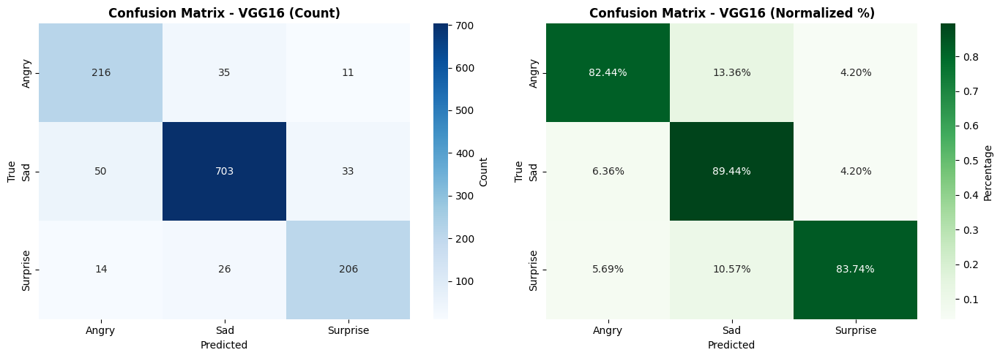

In [ ]:
# ============================================
# 9.2 Evaluasi & Classification Report (Enhanced)
# ============================================

print("\n" + "="*80)
print("📊 EVALUATION - VGG16")
print("="*80)

val_gen_vgg.reset()
y_true = val_gen_vgg.classes
y_pred_proba = vgg_model.predict(val_gen_vgg, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)

print("\n" + "="*60)
print("📋 CLASSIFICATION REPORT - VGG16 (Enhanced)")
print("="*60)
print(classification_report(y_true, y_pred, target_names=val_gen_vgg.class_indices.keys()))

# Confusion Matrix - Enhanced Version
cm = confusion_matrix(y_true, y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confusion Matrix (Count)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=val_gen_vgg.class_indices.keys(),
            yticklabels=val_gen_vgg.class_indices.keys(),
            cbar_kws={'label': 'Count'})
axes[0].set_title("Confusion Matrix - VGG16 (Count)", fontsize=12, fontweight='bold')
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

# Confusion Matrix (Normalized)
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1],
            xticklabels=val_gen_vgg.class_indices.keys(),
            yticklabels=val_gen_vgg.class_indices.keys(),
            cbar_kws={'label': 'Percentage'})
axes[1].set_title("Confusion Matrix - VGG16 (Normalized %)", fontsize=12, fontweight='bold')
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()


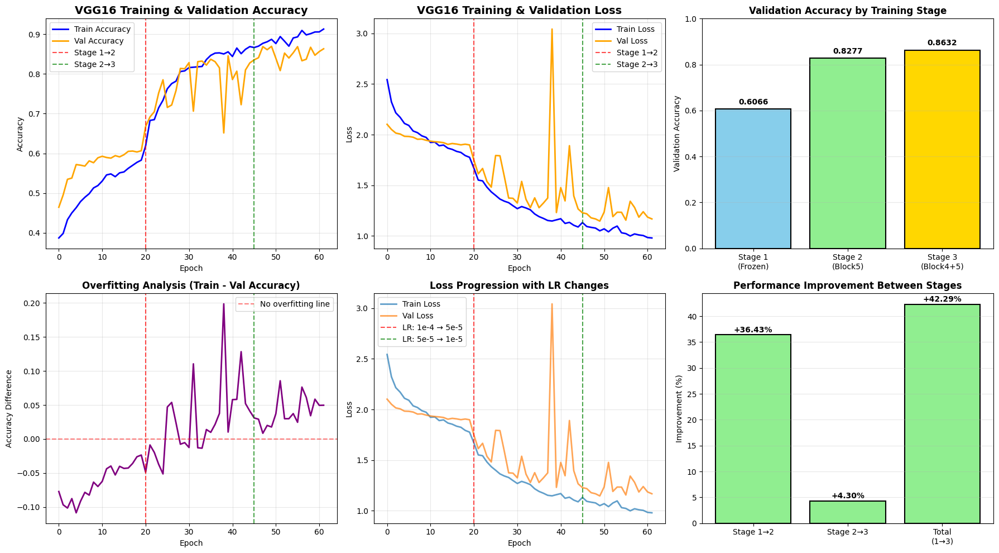


📈 Performance Summary:
Stage 1 (Frozen Base):     Val Acc = 0.6066
Stage 2 (Block5 Fine-tune): Val Acc = 0.8277 (+36.43%)
Stage 3 (Block4+5 Fine-tune): Val Acc = 0.8632 (+4.30%)
Total Improvement: +42.29%


In [ ]:
# ============================================
# 9.3 Grafik Accuracy & Loss (Enhanced with 3 Stages)
# ============================================

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Mark transitions between stages
stage1_epochs = len(history_stage1.history['accuracy'])
stage2_epochs = len(history_stage2.history['accuracy'])

# Accuracy
axes[0, 0].plot(history_vgg['accuracy'], label='Train Accuracy', linewidth=2, color='blue')
axes[0, 0].plot(history_vgg['val_accuracy'], label='Val Accuracy', linewidth=2, color='orange')
axes[0, 0].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7, label='Stage 1→2')
axes[0, 0].axvline(x=stage1_epochs+stage2_epochs, color='green', linestyle='--', alpha=0.7, label='Stage 2→3')
axes[0, 0].set_title('VGG16 Training & Validation Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history_vgg['loss'], label='Train Loss', linewidth=2, color='blue')
axes[0, 1].plot(history_vgg['val_loss'], label='Val Loss', linewidth=2, color='orange')
axes[0, 1].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7, label='Stage 1→2')
axes[0, 1].axvline(x=stage1_epochs+stage2_epochs, color='green', linestyle='--', alpha=0.7, label='Stage 2→3')
axes[0, 1].set_title('VGG16 Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Stage comparison
stage1_val_acc = history_stage1.history['val_accuracy'][-1]
stage2_val_acc = history_stage2.history['val_accuracy'][-1]
stage3_val_acc = history_stage3.history['val_accuracy'][-1]

stages = ['Stage 1\n(Frozen)', 'Stage 2\n(Block5)', 'Stage 3\n(Block4+5)']
accuracies = [stage1_val_acc, stage2_val_acc, stage3_val_acc]
colors = ['skyblue', 'lightgreen', 'gold']

axes[0, 2].bar(stages, accuracies, color=colors, edgecolor='black', linewidth=1.5)
axes[0, 2].set_title('Validation Accuracy by Training Stage', fontsize=12, fontweight='bold')
axes[0, 2].set_ylabel('Validation Accuracy')
axes[0, 2].set_ylim([0, 1])
for i, acc in enumerate(accuracies):
    axes[0, 2].text(i, acc + 0.02, f'{acc:.4f}', ha='center', fontweight='bold')
axes[0, 2].grid(True, alpha=0.3, axis='y')

# Overfitting analysis
train_val_diff = np.array(history_vgg['accuracy']) - np.array(history_vgg['val_accuracy'])
axes[1, 0].plot(train_val_diff, linewidth=2, color='purple')
axes[1, 0].axhline(y=0, color='r', linestyle='--', alpha=0.5, label='No overfitting line')
axes[1, 0].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7)
axes[1, 0].axvline(x=stage1_epochs+stage2_epochs, color='green', linestyle='--', alpha=0.7)
axes[1, 0].set_title('Overfitting Analysis (Train - Val Accuracy)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Accuracy Difference')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Learning rate effect (if available in history)
axes[1, 1].plot(history_vgg['loss'], label='Train Loss', linewidth=2, alpha=0.7)
axes[1, 1].plot(history_vgg['val_loss'], label='Val Loss', linewidth=2, alpha=0.7)
axes[1, 1].axvline(x=stage1_epochs, color='red', linestyle='--', alpha=0.7, label='LR: 1e-4 → 5e-5')
axes[1, 1].axvline(x=stage1_epochs+stage2_epochs, color='green', linestyle='--', alpha=0.7, label='LR: 5e-5 → 1e-5')
axes[1, 1].set_title('Loss Progression with LR Changes', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# Performance improvement
improvement_12 = ((stage2_val_acc - stage1_val_acc) / stage1_val_acc) * 100
improvement_23 = ((stage3_val_acc - stage2_val_acc) / stage2_val_acc) * 100
improvement_total = ((stage3_val_acc - stage1_val_acc) / stage1_val_acc) * 100

improvements = [improvement_12, improvement_23, improvement_total]
improvement_labels = ['Stage 1→2', 'Stage 2→3', 'Total\n(1→3)']
improvement_colors = ['lightgreen' if x > 0 else 'lightcoral' for x in improvements]

axes[1, 2].bar(improvement_labels, improvements, color=improvement_colors, edgecolor='black', linewidth=1.5)
axes[1, 2].axhline(y=0, color='black', linestyle='-', linewidth=0.8)
axes[1, 2].set_title('Performance Improvement Between Stages', fontsize=12, fontweight='bold')
axes[1, 2].set_ylabel('Improvement (%)')
for i, imp in enumerate(improvements):
    axes[1, 2].text(i, imp + 0.5 if imp > 0 else imp - 0.5, f'{imp:+.2f}%', ha='center', fontweight='bold')
axes[1, 2].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print(f"\n📈 Performance Summary:")
print(f"Stage 1 (Frozen Base):     Val Acc = {stage1_val_acc:.4f}")
print(f"Stage 2 (Block5 Fine-tune): Val Acc = {stage2_val_acc:.4f} ({improvement_12:+.2f}%)")
print(f"Stage 3 (Block4+5 Fine-tune): Val Acc = {stage3_val_acc:.4f} ({improvement_23:+.2f}%)")
print(f"Total Improvement: {improvement_total:+.2f}%")


🔍 DETAILED ERROR ANALYSIS - VGG16

📊 Overall Performance:
Total Samples: 1294
Correctly Classified: 1125 (86.94%)
Misclassified: 169 (13.06%)

--------------------------------------------------------------------------------
📈 Per-Class Detailed Analysis:
--------------------------------------------------------------------------------

🎯 Class: Angry
   Total Samples: 262
   Correct: 216 (82.44%)
   Misclassified: 46 (17.56%)
   Avg Confidence (All): 0.828 ± 0.162
   Avg Confidence (Correct): 0.848
   Avg Confidence (Incorrect): 0.733
   Confidence Gap: 0.115
   Confidence Percentiles (25/50/75): 0.696 / 0.877 / 0.975
   Confused with:
      → Sad: 35 times (76.1% of errors)
      → Surprise: 11 times (23.9% of errors)

🎯 Class: Sad
   Total Samples: 786
   Correct: 703 (89.44%)
   Misclassified: 83 (10.56%)
   Avg Confidence (All): 0.897 ± 0.150
   Avg Confidence (Correct): 0.924
   Avg Confidence (Incorrect): 0.666
   Confidence Gap: 0.258
   Confidence Percentiles (25/50/75): 0.862 

/tmp/ipython-input-764666667.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[0, 2].boxplot(conf_data_by_class, labels=class_names, patch_artist=True)



🔴 Top Confusion Patterns:
    True Predicted  Count  Avg_Confidence  Std_Confidence
     Sad     Angry     50        0.679548        0.142397
   Angry       Sad     35        0.755794        0.174247
     Sad  Surprise     33        0.644581        0.154566
Surprise       Sad     26        0.757428        0.180670
Surprise     Angry     14        0.652167        0.202021
   Angry  Surprise     11        0.661148        0.152146


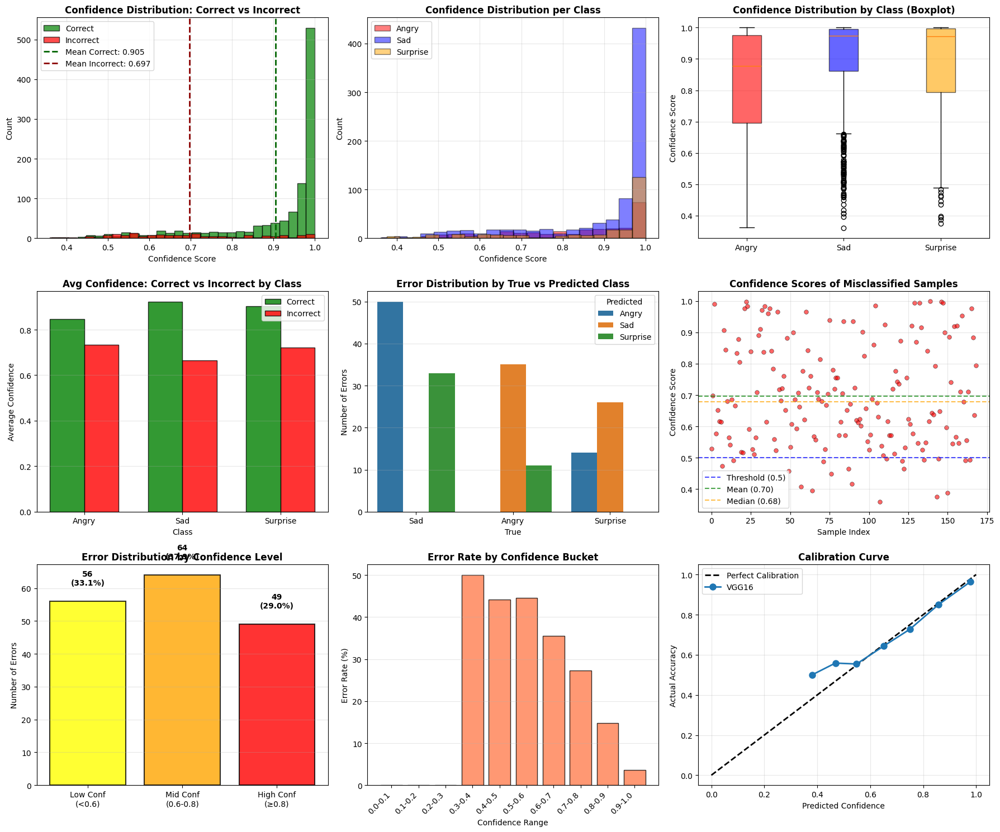


--------------------------------------------------------------------------------
⚠️ Error Confidence Breakdown:
--------------------------------------------------------------------------------
Low Confidence Errors (< 0.6): 56 (33.1%)
Medium Confidence Errors (0.6-0.8): 64 (37.9%)
High Confidence Errors (≥ 0.8): 49 (29.0%)

⚡ Most Confident Errors (Model was very sure, but wrong):
    True Predicted  Confidence
Surprise       Sad    0.999638
   Angry       Sad    0.997391
Surprise       Sad    0.997071
Surprise       Sad    0.994151
Surprise     Angry    0.994055
Surprise       Sad    0.993873
   Angry  Surprise    0.989793
     Sad  Surprise    0.984723
   Angry       Sad    0.983924
   Angry       Sad    0.983492

🤔 Least Confident Errors (Model was uncertain):
    True Predicted  Confidence
     Sad  Surprise    0.360196
Surprise     Angry    0.375186
Surprise     Angry    0.387546
     Sad  Surprise    0.395673
     Sad  Surprise    0.407756
     Sad  Surprise    0.417082
     Sad

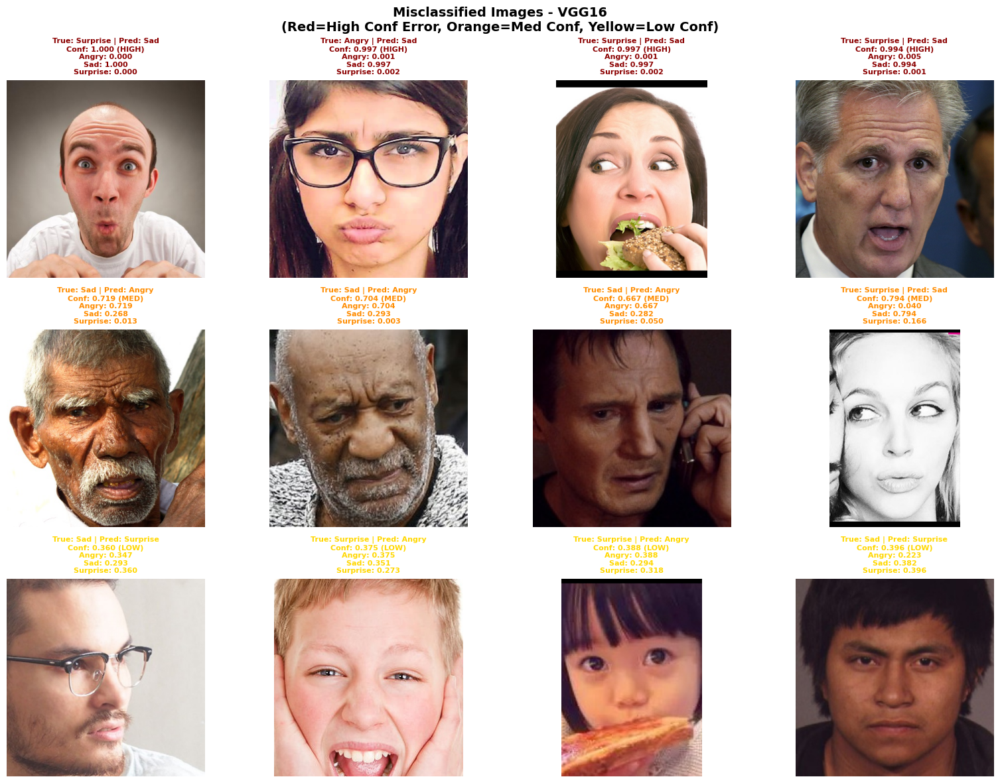


📋 VGG16 PERFORMANCE SUMMARY
Overall Accuracy........................ 0.8694
Overall Error Rate...................... 0.1306
Avg Confidence (Correct)................ 0.9054
Avg Confidence (Incorrect).............. 0.6970
Confidence Reliability Gap.............. 0.2084
Median Confidence (All)................. 0.9652

--------------------------------------------------------------------------------
Per-Class Performance:
--------------------------------------------------------------------------------

Angry:
  Samples: 262
  Accuracy: 0.8244
  Confidence (Correct): 0.8479
  Confidence (Incorrect): 0.7332
  Confidence Gap: 0.1147

Sad:
  Samples: 786
  Accuracy: 0.8944
  Confidence (Correct): 0.9238
  Confidence (Incorrect): 0.6656
  Confidence Gap: 0.2582

Surprise:
  Samples: 246
  Accuracy: 0.8374
  Confidence (Correct): 0.9031
  Confidence (Incorrect): 0.7206
  Confidence Gap: 0.1825

✅ VGG16 ERROR ANALYSIS COMPLETE!

--------------------------------------------------------------------

In [ ]:
# ============================================
# 9.4 ERROR ANALYSIS - DETAILED & ENHANCED (VGG16)
# ============================================

print("\n" + "="*80)
print("🔍 DETAILED ERROR ANALYSIS - VGG16")
print("="*80)

class_names = list(val_gen_vgg.class_indices.keys())
misclassified_idx = np.where(y_true != y_pred)[0]
correctly_classified_idx = np.where(y_true == y_pred)[0]

print(f"\n📊 Overall Performance:")
print(f"Total Samples: {len(y_true)}")
print(f"Correctly Classified: {len(correctly_classified_idx)} ({len(correctly_classified_idx)/len(y_true)*100:.2f}%)")
print(f"Misclassified: {len(misclassified_idx)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)")

# 1. Per-Class Detailed Analysis
print("\n" + "-"*80)
print("📈 Per-Class Detailed Analysis:")
print("-"*80)

per_class_analysis = {}

for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_true = y_true[cls_mask]
    cls_pred = y_pred[cls_mask]
    cls_proba = y_pred_proba[cls_mask]

    correct = np.sum(cls_true == cls_pred)
    total = len(cls_true)
    accuracy = correct / total if total > 0 else 0

    # Confidence analysis
    confidence_scores = np.max(cls_proba, axis=1)
    avg_confidence = np.mean(confidence_scores)
    std_confidence = np.std(confidence_scores)

    # Separate confidence for correct vs incorrect
    correct_mask = (cls_true == cls_pred)
    correct_confidence = confidence_scores[correct_mask]
    incorrect_confidence = confidence_scores[~correct_mask]

    avg_correct_conf = np.mean(correct_confidence) if len(correct_confidence) > 0 else 0
    avg_incorrect_conf = np.mean(incorrect_confidence) if len(incorrect_confidence) > 0 else 0

    # Confidence percentiles
    conf_percentiles = np.percentile(confidence_scores, [25, 50, 75])

    # Confusion analysis
    misclass_targets = cls_pred[cls_true != cls_pred]

    per_class_analysis[cls] = {
        'total': total,
        'correct': correct,
        'accuracy': accuracy,
        'avg_confidence': avg_confidence,
        'std_confidence': std_confidence,
        'avg_correct_conf': avg_correct_conf,
        'avg_incorrect_conf': avg_incorrect_conf,
        'conf_percentiles': conf_percentiles,
        'misclass_targets': misclass_targets
    }

    print(f"\n🎯 Class: {cls}")
    print(f"   Total Samples: {total}")
    print(f"   Correct: {correct} ({accuracy*100:.2f}%)")
    print(f"   Misclassified: {total - correct} ({(1-accuracy)*100:.2f}%)")
    print(f"   Avg Confidence (All): {avg_confidence:.3f} ± {std_confidence:.3f}")
    print(f"   Avg Confidence (Correct): {avg_correct_conf:.3f}")
    print(f"   Avg Confidence (Incorrect): {avg_incorrect_conf:.3f}")
    print(f"   Confidence Gap: {avg_correct_conf - avg_incorrect_conf:.3f}")
    print(f"   Confidence Percentiles (25/50/75): {conf_percentiles[0]:.3f} / {conf_percentiles[1]:.3f} / {conf_percentiles[2]:.3f}")

    if len(misclass_targets) > 0:
        print(f"   Confused with:")
        for target_idx in np.unique(misclass_targets):
            count = np.sum(misclass_targets == target_idx)
            percentage = (count / (total - correct)) * 100
            print(f"      → {class_names[target_idx]}: {count} times ({percentage:.1f}% of errors)")

# 2. Comprehensive Confidence Analysis
print("\n" + "-"*80)
print("📊 Confidence Score Analysis:")
print("-"*80)

fig, axes = plt.subplots(3, 3, figsize=(18, 15))

# 2.1 Overall confidence distribution
correct_confidence = np.max(y_pred_proba[correctly_classified_idx], axis=1)
incorrect_confidence = np.max(y_pred_proba[misclassified_idx], axis=1)

axes[0, 0].hist(correct_confidence, bins=30, alpha=0.7, label='Correct', color='green', edgecolor='black')
axes[0, 0].hist(incorrect_confidence, bins=30, alpha=0.7, label='Incorrect', color='red', edgecolor='black')
axes[0, 0].axvline(x=np.mean(correct_confidence), color='darkgreen', linestyle='--', linewidth=2, label=f'Mean Correct: {np.mean(correct_confidence):.3f}')
axes[0, 0].axvline(x=np.mean(incorrect_confidence), color='darkred', linestyle='--', linewidth=2, label=f'Mean Incorrect: {np.mean(incorrect_confidence):.3f}')
axes[0, 0].set_title('Confidence Distribution: Correct vs Incorrect', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Confidence Score')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

print(f"Overall Avg Confidence (Correct): {np.mean(correct_confidence):.3f}")
print(f"Overall Avg Confidence (Incorrect): {np.mean(incorrect_confidence):.3f}")
print(f"Confidence Gap: {np.mean(correct_confidence) - np.mean(incorrect_confidence):.3f}")
print(f"Confidence Std (Correct): {np.std(correct_confidence):.3f}")
print(f"Confidence Std (Incorrect): {np.std(incorrect_confidence):.3f}")

# 2.2 Per-class confidence distribution
colors_map = {'Angry': 'red', 'Sad': 'blue', 'Surprise': 'orange'}
for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_confidence = np.max(y_pred_proba[cls_mask], axis=1)
    axes[0, 1].hist(cls_confidence, bins=20, alpha=0.5,
                    label=cls, color=colors_map.get(cls, 'gray'), edgecolor='black')

axes[0, 1].set_title('Confidence Distribution per Class', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Confidence Score')
axes[0, 1].set_ylabel('Count')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# 2.3 Confidence comparison by class (Box plot)
conf_data_by_class = []
for i, cls in enumerate(class_names):
    cls_mask = (y_true == i)
    cls_confidence = np.max(y_pred_proba[cls_mask], axis=1)
    conf_data_by_class.append(cls_confidence)

bp = axes[0, 2].boxplot(conf_data_by_class, labels=class_names, patch_artist=True)
for patch, color in zip(bp['boxes'], [colors_map.get(cls, 'gray') for cls in class_names]):
    patch.set_facecolor(color)
    patch.set_alpha(0.6)
axes[0, 2].set_title('Confidence Distribution by Class (Boxplot)', fontsize=12, fontweight='bold')
axes[0, 2].set_ylabel('Confidence Score')
axes[0, 2].grid(True, alpha=0.3, axis='y')

# 2.4 Confidence comparison: correct vs incorrect by class
class_conf_data = []
for cls in class_names:
    data = per_class_analysis[cls]
    class_conf_data.append({
        'Class': cls,
        'Correct': data['avg_correct_conf'],
        'Incorrect': data['avg_incorrect_conf']
    })

conf_df = pd.DataFrame(class_conf_data)
x_pos = np.arange(len(class_names))
width = 0.35

axes[1, 0].bar(x_pos - width/2, conf_df['Correct'], width,
               label='Correct', color='green', alpha=0.8, edgecolor='black')
axes[1, 0].bar(x_pos + width/2, conf_df['Incorrect'], width,
               label='Incorrect', color='red', alpha=0.8, edgecolor='black')
axes[1, 0].set_title('Avg Confidence: Correct vs Incorrect by Class', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Class')
axes[1, 0].set_ylabel('Average Confidence')
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(class_names)
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3, axis='y')

# 3. Error Pattern Analysis
errors_df = pd.DataFrame({
    "True": [class_names[i] for i in y_true[misclassified_idx]],
    "Predicted": [class_names[i] for i in y_pred[misclassified_idx]],
    "Confidence": np.max(y_pred_proba[misclassified_idx], axis=1)
})

error_counts = errors_df.groupby(["True", "Predicted"]).agg({
    'Confidence': ['count', 'mean', 'std']
}).reset_index()
error_counts.columns = ['True', 'Predicted', 'Count', 'Avg_Confidence', 'Std_Confidence']
error_counts = error_counts.sort_values('Count', ascending=False)

# 3.1 Error distribution
sns.barplot(data=error_counts, x="True", y="Count", hue="Predicted", ax=axes[1, 1])
axes[1, 1].set_title('Error Distribution by True vs Predicted Class', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Number of Errors')
axes[1, 1].grid(True, alpha=0.3, axis='y')

print(f"\n🔴 Top Confusion Patterns:")
print(error_counts.head(10).to_string(index=False))

# 3.2 Confidence of errors (scatter plot)
axes[1, 2].scatter(range(len(errors_df)), errors_df['Confidence'],
                   alpha=0.6, c='red', s=30, edgecolors='black', linewidth=0.5)
axes[1, 2].axhline(y=0.5, color='blue', linestyle='--',
                   label='Threshold (0.5)', alpha=0.7)
axes[1, 2].axhline(y=np.mean(errors_df['Confidence']), color='green',
                   linestyle='--', label=f'Mean ({np.mean(errors_df["Confidence"]):.2f})', alpha=0.7)
axes[1, 2].axhline(y=np.median(errors_df['Confidence']), color='orange',
                   linestyle='--', label=f'Median ({np.median(errors_df["Confidence"]):.2f})', alpha=0.7)
axes[1, 2].set_title('Confidence Scores of Misclassified Samples', fontsize=12, fontweight='bold')
axes[1, 2].set_xlabel('Sample Index')
axes[1, 2].set_ylabel('Confidence Score')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

# 3.3 Low vs High confidence errors
low_confidence_threshold = 0.6
high_confidence_threshold = 0.8

low_conf_errors = errors_df[errors_df['Confidence'] < low_confidence_threshold]
high_conf_errors = errors_df[errors_df['Confidence'] >= high_confidence_threshold]
mid_conf_errors = errors_df[(errors_df['Confidence'] >= low_confidence_threshold) &
                            (errors_df['Confidence'] < high_confidence_threshold)]

error_categories = ['Low Conf\n(<0.6)', 'Mid Conf\n(0.6-0.8)', 'High Conf\n(≥0.8)']
error_category_counts = [len(low_conf_errors), len(mid_conf_errors), len(high_conf_errors)]

axes[2, 0].bar(error_categories, error_category_counts,
               color=['yellow', 'orange', 'red'], alpha=0.8, edgecolor='black', linewidth=1.5)
axes[2, 0].set_title('Error Distribution by Confidence Level', fontsize=12, fontweight='bold')
axes[2, 0].set_ylabel('Number of Errors')
axes[2, 0].grid(True, alpha=0.3, axis='y')

for i, count in enumerate(error_category_counts):
    percentage = (count / len(errors_df)) * 100
    axes[2, 0].text(i, count + 5, f'{count}\n({percentage:.1f}%)',
                   ha='center', fontweight='bold')

# 3.4 Error rate by confidence bucket
confidence_buckets = np.linspace(0, 1, 11)
error_rates = []
bucket_labels = []

for i in range(len(confidence_buckets) - 1):
    lower = confidence_buckets[i]
    upper = confidence_buckets[i + 1]

    # All predictions in this bucket
    in_bucket = (np.max(y_pred_proba, axis=1) >= lower) & (np.max(y_pred_proba, axis=1) < upper)

    if np.sum(in_bucket) > 0:
        error_rate = np.sum(y_true[in_bucket] != y_pred[in_bucket]) / np.sum(in_bucket)
        error_rates.append(error_rate * 100)
        bucket_labels.append(f'{lower:.1f}-{upper:.1f}')
    else:
        error_rates.append(0)
        bucket_labels.append(f'{lower:.1f}-{upper:.1f}')

axes[2, 1].bar(range(len(error_rates)), error_rates, color='coral', alpha=0.8, edgecolor='black')
axes[2, 1].set_title('Error Rate by Confidence Bucket', fontsize=12, fontweight='bold')
axes[2, 1].set_xlabel('Confidence Range')
axes[2, 1].set_ylabel('Error Rate (%)')
axes[2, 1].set_xticks(range(len(bucket_labels)))
axes[2, 1].set_xticklabels(bucket_labels, rotation=45, ha='right')
axes[2, 1].grid(True, alpha=0.3, axis='y')

# 3.5 Calibration curve
from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve(
    (y_true == y_pred).astype(int),
    np.max(y_pred_proba, axis=1),
    n_bins=10
)

axes[2, 2].plot([0, 1], [0, 1], 'k--', label='Perfect Calibration', linewidth=2)
axes[2, 2].plot(prob_pred, prob_true, 'o-', label='VGG16', linewidth=2, markersize=8)
axes[2, 2].set_title('Calibration Curve', fontsize=12, fontweight='bold')
axes[2, 2].set_xlabel('Predicted Confidence')
axes[2, 2].set_ylabel('Actual Accuracy')
axes[2, 2].legend()
axes[2, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 4. Detailed Breakdown
print("\n" + "-"*80)
print("⚠️ Error Confidence Breakdown:")
print("-"*80)
print(f"Low Confidence Errors (< {low_confidence_threshold}): {len(low_conf_errors)} ({len(low_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"Medium Confidence Errors ({low_confidence_threshold}-{high_confidence_threshold}): {len(mid_conf_errors)} ({len(mid_conf_errors)/len(errors_df)*100:.1f}%)")
print(f"High Confidence Errors (≥ {high_confidence_threshold}): {len(high_conf_errors)} ({len(high_conf_errors)/len(errors_df)*100:.1f}%)")

if len(high_conf_errors) > 0:
    print(f"\n⚡ Most Confident Errors (Model was very sure, but wrong):")
    print(high_conf_errors.nlargest(10, 'Confidence').to_string(index=False))

if len(low_conf_errors) > 0:
    print(f"\n🤔 Least Confident Errors (Model was uncertain):")
    print(low_conf_errors.nsmallest(10, 'Confidence').to_string(index=False))

# 5. Class-wise Error Analysis
print("\n" + "-"*80)
print("📉 Class-wise Error Patterns:")
print("-"*80)

for true_class in class_names:
    class_errors = errors_df[errors_df['True'] == true_class]
    if len(class_errors) > 0:
        print(f"\n{true_class} → Most commonly confused with:")
        confusion_counts = class_errors['Predicted'].value_counts()
        for pred_class, count in confusion_counts.items():
            percentage = (count / len(class_errors)) * 100
            avg_conf = class_errors[class_errors['Predicted'] == pred_class]['Confidence'].mean()
            print(f"  → {pred_class}: {count} times ({percentage:.1f}%), Avg Confidence: {avg_conf:.3f}")

# 6. Visual Error Analysis - Sample Images
print("\n" + "-"*80)
print("🔬 Visual Analysis - Misclassified Examples:")
print("-"*80)

num_examples = min(12, len(misclassified_idx))
if num_examples > 0:
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.ravel()

    # Show diverse examples: mix of high, medium, and low confidence errors
    if len(high_conf_errors) >= 4 and len(mid_conf_errors) >= 4 and len(low_conf_errors) >= 4:
        sample_indices = (
            list(high_conf_errors.nlargest(4, 'Confidence').index) +
            list(mid_conf_errors.sample(min(4, len(mid_conf_errors))).index) +
            list(low_conf_errors.nsmallest(4, 'Confidence').index)
        )[:12]
    else:
        sample_indices = misclassified_idx[:12]

    for plot_idx, sample_idx in enumerate(sample_indices):
        if plot_idx >= 12:
            break

        # Find actual index in misclassified_idx
        actual_idx = misclassified_idx[sample_idx] if sample_idx < len(misclassified_idx) else misclassified_idx[plot_idx]

        img_path = val_gen_vgg.filepaths[actual_idx]
        img = Image.open(img_path)

        true_label = class_names[y_true[actual_idx]]
        pred_label = class_names[y_pred[actual_idx]]
        confidence = np.max(y_pred_proba[actual_idx])

        # All class probabilities
        probs = y_pred_proba[actual_idx]
        prob_text = "\n".join([f"{class_names[j]}: {probs[j]:.3f}" for j in range(len(class_names))])

        axes[plot_idx].imshow(img)

        # Color code by confidence level
        if confidence >= high_confidence_threshold:
            title_color = 'darkred'
            conf_label = 'HIGH'
        elif confidence >= low_confidence_threshold:
            title_color = 'darkorange'
            conf_label = 'MED'
        else:
            title_color = 'gold'
            conf_label = 'LOW'

        axes[plot_idx].set_title(
            f"True: {true_label} | Pred: {pred_label}\n"
            f"Conf: {confidence:.3f} ({conf_label})\n{prob_text}",
            fontsize=8, color=title_color, fontweight='bold'
        )
        axes[plot_idx].axis('off')

    # Hide unused subplots
    for plot_idx in range(num_examples, 12):
        axes[plot_idx].axis('off')

    plt.suptitle("Misclassified Images - VGG16\n(Red=High Conf Error, Orange=Med Conf, Yellow=Low Conf)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# 7. Model Performance Summary
print("\n" + "="*80)
print("📋 VGG16 PERFORMANCE SUMMARY")
print("="*80)

summary_metrics = {
    'Overall Accuracy': len(correctly_classified_idx) / len(y_true),
    'Overall Error Rate': len(misclassified_idx) / len(y_true),
    'Avg Confidence (Correct)': np.mean(correct_confidence),
    'Avg Confidence (Incorrect)': np.mean(incorrect_confidence),
    'Confidence Reliability Gap': np.mean(correct_confidence) - np.mean(incorrect_confidence),
    'Median Confidence (All)': np.median(np.max(y_pred_proba, axis=1)),
}

for metric, value in summary_metrics.items():
    print(f"{metric:.<40} {value:.4f}")

print("\n" + "-"*80)
print("Per-Class Performance:")
print("-"*80)
for cls in class_names:
    data = per_class_analysis[cls]
    print(f"\n{cls}:")
    print(f"  Samples: {data['total']}")
    print(f"  Accuracy: {data['accuracy']:.4f}")
    print(f"  Confidence (Correct): {data['avg_correct_conf']:.4f}")
    print(f"  Confidence (Incorrect): {data['avg_incorrect_conf']:.4f}")
    print(f"  Confidence Gap: {data['avg_correct_conf'] - data['avg_incorrect_conf']:.4f}")

print("\n" + "="*80)
print("✅ VGG16 ERROR ANALYSIS COMPLETE!")
print("="*80)

# 8. Generate Error Analysis Report
print("\n" + "-"*80)
print("📄 Generating Detailed Error Report...")
print("-"*80)

error_report = f"""
================================================================================
VGG16 ERROR ANALYSIS REPORT
================================================================================

Overall Performance:
- Total Validation Samples: {len(y_true)}
- Correctly Classified: {len(correctly_classified_idx)} ({len(correctly_classified_idx)/len(y_true)*100:.2f}%)
- Misclassified: {len(misclassified_idx)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)

Confidence Analysis:
- Avg Confidence (Correct): {np.mean(correct_confidence):.4f}
- Avg Confidence (Incorrect): {np.mean(incorrect_confidence):.4f}
- Confidence Reliability Gap: {np.mean(correct_confidence) - np.mean(incorrect_confidence):.4f}

Error Breakdown by Confidence:
- Low Confidence Errors (<0.6): {len(low_conf_errors)} ({len(low_conf_errors)/len(errors_df)*100:.1f}%)
- Medium Confidence Errors (0.6-0.8): {len(mid_conf_errors)} ({len(mid_conf_errors)/len(errors_df)*100:.1f}%)
- High Confidence Errors (≥0.8): {len(high_conf_errors)} ({len(high_conf_errors)/len(errors_df)*100:.1f}%)

Top Confusion Patterns:
{error_counts.head(5).to_string(index=False)}

Per-Class Performance:
"""

for cls in class_names:
    data = per_class_analysis[cls]
    error_report += f"""
{cls}:
  Total: {data['total']} samples
  Accuracy: {data['accuracy']*100:.2f}%
  Correct: {data['correct']} | Errors: {data['total'] - data['correct']}
  Avg Confidence (Correct): {data['avg_correct_conf']:.4f}
  Avg Confidence (Incorrect): {data['avg_incorrect_conf']:.4f}
  Confidence Gap: {data['avg_correct_conf'] - data['avg_incorrect_conf']:.4f}
"""

error_report += "\n" + "="*80

print(error_report)

In [ ]:
# ============================================
# 9.5 Save VGG16 Model (Complete)
# ============================================

import json
from datetime import datetime

print("\n" + "="*80)
print("💾 SAVING VGG16 MODEL & ARTIFACTS")
print("="*80)

# Buat folder untuk menyimpan model
model_save_dir = "/content/saved_models-vgg16"
os.makedirs(model_save_dir, exist_ok=True)

# Timestamp untuk versioning
timestamp_vgg = datetime.now().strftime("%Y%m%d_%H%M%S")
model_name_vgg = "vgg16_model"

# ============================================
# 1. Save Full Model (Recommended - Keras format)
# ============================================
model_path_keras = os.path.join(model_save_dir, f"{model_name_vgg}.keras")
vgg_model.save(model_path_keras)
print(f"✅ Model saved (Keras format): {model_path_keras}")

# ============================================
# 2. Save Model Architecture (JSON)
# ============================================
model_json = vgg_model.to_json()
json_path = os.path.join(model_save_dir, f"{model_name_vgg}_architecture.json")
with open(json_path, 'w') as json_file:
    json_file.write(model_json)
print(f"✅ Model architecture saved: {json_path}")

# ============================================
# 3. Save Model Weights Only
# ============================================
weights_path = os.path.join(model_save_dir, f"{model_name_vgg}.weights.h5")
vgg_model.save_weights(weights_path)
print(f"✅ Model weights saved: {weights_path}")

# ============================================
# 4. Save Model with Timestamp (Versioning)
# ============================================
versioned_path = os.path.join(model_save_dir, f"{model_name_vgg}_{timestamp_vgg}.keras")
vgg_model.save(versioned_path)
print(f"✅ Versioned model saved: {versioned_path}")

# ============================================
# 5. Save Training History (3 stages combined)
# ============================================
history_path = os.path.join(model_save_dir, f"{model_name_vgg}_history.json")
with open(history_path, 'w') as f:
    json.dump(history_vgg, f, indent=4)
print(f"✅ Training history saved: {history_path}")

# Save individual stage histories for detailed analysis
history_stages_path = os.path.join(model_save_dir, f"{model_name_vgg}_history_stages.json")
history_stages = {
    'stage1': {k: [float(v) for v in vals] for k, vals in history_stage1.history.items()},
    'stage2': {k: [float(v) for v in vals] for k, vals in history_stage2.history.items()},
    'stage3': {k: [float(v) for v in vals] for k, vals in history_stage3.history.items()}
}
with open(history_stages_path, 'w') as f:
    json.dump(history_stages, f, indent=4)
print(f"✅ Stage-wise training history saved: {history_stages_path}")

# ============================================
# 6. Save Class Indices Mapping
# ============================================
class_indices_path = os.path.join(model_save_dir, f"{model_name_vgg}_class_indices.json")
with open(class_indices_path, 'w') as f:
    json.dump(train_gen_vgg.class_indices, f, indent=4)
print(f"✅ Class indices saved: {class_indices_path}")

# ============================================
# 7. Save Model Configuration & Metadata (FIXED)
# ============================================

# Convert class_weights_dict to native Python types
class_weights_python = {int(k): float(v) for k, v in class_weights_dict.items()}

vgg_config = {
    "model_name": model_name_vgg,
    "timestamp": timestamp_vgg,
    "architecture": "VGG16 Transfer Learning",
    "base_model": "VGG16",
    "input_shape": [128, 128, 3],
    "num_classes": 3,
    "class_names": list(train_gen_vgg.class_indices.keys()),
    "class_weights": class_weights_python,
    "total_params": int(vgg_model.count_params()),
    "trainable_params": int(sum([np.prod(w.shape) for w in vgg_model.trainable_weights])),
    "training_samples": int(train_gen_vgg.samples),
    "validation_samples": int(val_gen_vgg.samples),
    "batch_size": int(batch_size),
    "training_strategy": "Three-stage (frozen base → block5 → block4+5)",
    "stage1_info": {
        "description": "Train custom head only (frozen base)",
        "epochs": int(len(history_stage1.history['loss'])),
        "initial_lr": 0.0001,
        "final_train_acc": float(history_stage1.history['accuracy'][-1]),
        "final_val_acc": float(history_stage1.history['val_accuracy'][-1])
    },
    "stage2_info": {
        "description": "Fine-tune block5",
        "epochs": int(len(history_stage2.history['loss'])),
        "initial_lr": 0.00005,
        "final_train_acc": float(history_stage2.history['accuracy'][-1]),
        "final_val_acc": float(history_stage2.history['val_accuracy'][-1])
    },
    "stage3_info": {
        "description": "Fine-tune block4 + block5",
        "epochs": int(len(history_stage3.history['loss'])),
        "initial_lr": 0.00001,
        "final_train_acc": float(history_stage3.history['accuracy'][-1]),
        "final_val_acc": float(history_stage3.history['val_accuracy'][-1])
    },
    "total_epochs": int(len(history_vgg['loss'])),
    "final_train_accuracy": float(history_vgg['accuracy'][-1]),
    "final_val_accuracy": float(history_vgg['val_accuracy'][-1]),
    "final_train_loss": float(history_vgg['loss'][-1]),
    "final_val_loss": float(history_vgg['val_loss'][-1]),
    "best_val_accuracy": float(max(history_vgg['val_accuracy'])),
    "best_val_loss": float(min(history_vgg['val_loss'])),
    "optimizer": "Adam",
    "loss_function": "categorical_crossentropy"
}

config_path = os.path.join(model_save_dir, f"{model_name_vgg}_config.json")
with open(config_path, 'w') as f:
    json.dump(vgg_config, f, indent=4)
print(f"✅ Model configuration saved: {config_path}")

# ============================================
# 8. Save Performance Metrics
# ============================================
from sklearn.metrics import precision_score, recall_score, f1_score

val_gen_vgg.reset()
y_true = val_gen_vgg.classes
y_pred = np.argmax(vgg_model.predict(val_gen_vgg), axis=1)

performance_metrics = {
    "overall_accuracy": float(np.mean(y_true == y_pred)),
    "per_class_metrics": {}
}

class_names = list(train_gen_vgg.class_indices.keys())

for i, cls in enumerate(class_names):
    cls_true = (y_true == i).astype(int)
    cls_pred = (y_pred == i).astype(int)

    performance_metrics["per_class_metrics"][cls] = {
        "precision": float(precision_score(cls_true, cls_pred, zero_division=0)),
        "recall": float(recall_score(cls_true, cls_pred, zero_division=0)),
        "f1_score": float(f1_score(cls_true, cls_pred, zero_division=0)),
        "support": int(np.sum(cls_true))
    }

metrics_path = os.path.join(model_save_dir, f"{model_name_vgg}_metrics.json")
with open(metrics_path, 'w') as f:
    json.dump(performance_metrics, f, indent=4)
print(f"✅ Performance metrics saved: {metrics_path}")

# ============================================
# 9. Create Model Info Summary
# ============================================
summary_path = os.path.join(model_save_dir, f"{model_name_vgg}_summary.txt")
with open(summary_path, 'w') as f:
    f.write("="*80 + "\n")
    f.write(f"MODEL SUMMARY: {model_name_vgg}\n")
    f.write("="*80 + "\n\n")

    f.write(f"Created: {timestamp_vgg}\n")
    f.write(f"Architecture: VGG16 Transfer Learning\n")
    f.write(f"Total Parameters: {vgg_model.count_params():,}\n")
    f.write(f"Trainable Parameters: {vgg_config['trainable_params']:,}\n")
    f.write(f"Training Samples: {train_gen_vgg.samples}\n")
    f.write(f"Validation Samples: {val_gen_vgg.samples}\n")
    f.write(f"Training Strategy: {vgg_config['training_strategy']}\n\n")

    f.write("TRAINING STAGES:\n")
    f.write(f"  Stage 1 ({vgg_config['stage1_info']['description']}): {vgg_config['stage1_info']['epochs']} epochs\n")
    f.write(f"    Initial LR: {vgg_config['stage1_info']['initial_lr']}\n")
    f.write(f"    Final Val Acc: {vgg_config['stage1_info']['final_val_acc']:.4f}\n\n")

    f.write(f"  Stage 2 ({vgg_config['stage2_info']['description']}): {vgg_config['stage2_info']['epochs']} epochs\n")
    f.write(f"    Initial LR: {vgg_config['stage2_info']['initial_lr']}\n")
    f.write(f"    Final Val Acc: {vgg_config['stage2_info']['final_val_acc']:.4f}\n\n")

    f.write(f"  Stage 3 ({vgg_config['stage3_info']['description']}): {vgg_config['stage3_info']['epochs']} epochs\n")
    f.write(f"    Initial LR: {vgg_config['stage3_info']['initial_lr']}\n")
    f.write(f"    Final Val Acc: {vgg_config['stage3_info']['final_val_acc']:.4f}\n\n")

    f.write(f"  Total Epochs: {vgg_config['total_epochs']}\n\n")

    f.write("FINAL PERFORMANCE:\n")
    f.write(f"  Train Accuracy: {vgg_config['final_train_accuracy']:.4f}\n")
    f.write(f"  Val Accuracy: {vgg_config['final_val_accuracy']:.4f}\n")
    f.write(f"  Train Loss: {vgg_config['final_train_loss']:.4f}\n")
    f.write(f"  Val Loss: {vgg_config['final_val_loss']:.4f}\n\n")

    f.write("BEST PERFORMANCE:\n")
    f.write(f"  Best Val Accuracy: {vgg_config['best_val_accuracy']:.4f}\n")
    f.write(f"  Best Val Loss: {vgg_config['best_val_loss']:.4f}\n\n")

    f.write("PER-CLASS METRICS:\n")
    for cls, metrics in performance_metrics["per_class_metrics"].items():
        f.write(f"\n  {cls}:\n")
        f.write(f"    Precision: {metrics['precision']:.4f}\n")
        f.write(f"    Recall: {metrics['recall']:.4f}\n")
        f.write(f"    F1-Score: {metrics['f1_score']:.4f}\n")
        f.write(f"    Support: {metrics['support']}\n")

    # Model architecture summary
    f.write("\n" + "="*80 + "\n")
    f.write("MODEL ARCHITECTURE:\n")
    f.write("="*80 + "\n")

    # Redirect summary to file
    vgg_model.summary(print_fn=lambda x: f.write(x + '\n'))

print(f"✅ Model summary saved: {summary_path}")

# ============================================
# 10. List All Saved Files for VGG16
# ============================================
print("\n" + "-"*80)
print("📁 VGG16 Model Files:")
print("-"*80)

vgg_files = [
    f"{model_name_vgg}.keras",
    f"{model_name_vgg}.weights.h5",
    f"{model_name_vgg}_architecture.json",
    f"{model_name_vgg}_{timestamp_vgg}.keras",
    f"{model_name_vgg}_history.json",
    f"{model_name_vgg}_history_stages.json",
    f"{model_name_vgg}_class_indices.json",
    f"{model_name_vgg}_config.json",
    f"{model_name_vgg}_metrics.json",
    f"{model_name_vgg}_summary.txt"
]

total_size = 0
for idx, file in enumerate(vgg_files, 1):
    file_path = os.path.join(model_save_dir, file)
    if os.path.exists(file_path):
        file_size = os.path.getsize(file_path) / (1024 * 1024)
        total_size += file_size
        print(f"{idx}. {file} ({file_size:.2f} MB)")

print(f"\nTotal Size: {total_size:.2f} MB")

print("\n" + "="*80)
print("✅ VGG16 MODEL FILES SAVED SUCCESSFULLY!")
print("="*80)

# ============================================
# 11. Quick Load Example
# ============================================
print("\n" + "-"*80)
print("📖 HOW TO LOAD THE MODEL LATER:")
print("-"*80)
print(f"""
# Method 1: Load full model (Recommended - Easiest)
from tensorflow.keras.models import load_model
loaded_model = load_model('{model_save_dir}/{model_name_vgg}.keras')
print("✅ VGG16 model loaded successfully!")

# Method 2: Load architecture + weights separately
import json
from tensorflow.keras.models import model_from_json
from tensorflow.keras.optimizers import Adam

# Load architecture
with open('{model_save_dir}/{model_name_vgg}_architecture.json', 'r') as f:
    loaded_model_json = f.read()
loaded_model = model_from_json(loaded_model_json)

# Load weights
loaded_model.load_weights('{model_save_dir}/{model_name_vgg}.weights.h5')

# Compile the model
loaded_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print("✅ Model loaded and compiled successfully!")

# Load class indices
with open('{model_save_dir}/{model_name_vgg}_class_indices.json', 'r') as f:
    class_indices = json.load(f)
print(f"✅ Class indices loaded: {{class_indices}}")

# Load configuration
with open('{model_save_dir}/{model_name_vgg}_config.json', 'r') as f:
    config = json.load(f)
print(f"✅ Config loaded - Best Val Accuracy: {{config['best_val_accuracy']:.4f}}")
""")

print("\n" + "="*80)
print("💾 VGG16 MODEL SAVING COMPLETE!")
print("="*80)

# ============================================
# 12. Test Model Load (Quick Verification)
# ============================================
print("\n" + "-"*80)
print("🧪 Testing VGG16 Model Load (Quick Verification):")
print("-"*80)

try:
    # Test loading
    test_model = load_model(model_path_keras)
    print("✅ VGG16 model can be loaded successfully!")
    print(f"   Model input shape: {test_model.input_shape}")
    print(f"   Model output shape: {test_model.output_shape}")
    print(f"   Total parameters: {test_model.count_params():,}")
except Exception as e:
    print(f"❌ Error loading model: {e}")


💾 SAVING VGG16 MODEL & ARTIFACTS
✅ Model saved (Keras format): /content/saved_models-vgg16/vgg16_model.keras
✅ Model architecture saved: /content/saved_models-vgg16/vgg16_model_architecture.json
✅ Model weights saved: /content/saved_models-vgg16/vgg16_model.weights.h5
✅ Versioned model saved: /content/saved_models-vgg16/vgg16_model_20251224_100208.keras
✅ Training history saved: /content/saved_models-vgg16/vgg16_model_history.json
✅ Stage-wise training history saved: /content/saved_models-vgg16/vgg16_model_history_stages.json
✅ Class indices saved: /content/saved_models-vgg16/vgg16_model_class_indices.json
✅ Model configuration saved: /content/saved_models-vgg16/vgg16_model_config.json
41/41 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step
✅ Performance metrics saved: /content/saved_models-vgg16/vgg16_model_metrics.json


✅ Model summary saved: /content/saved_models-vgg16/vgg16_model_summary.txt

--------------------------------------------------------------------------------
📁 VGG16 Model Files:
--------------------------------------------------------------------------------
1. vgg16_model.keras (160.21 MB)
2. vgg16_model.weights.h5 (160.19 MB)
3. vgg16_model_architecture.json (0.03 MB)
4. vgg16_model_20251224_100208.keras (160.21 MB)
5. vgg16_model_history.json (0.01 MB)
6. vgg16_model_history_stages.json (0.01 MB)
7. vgg16_model_class_indices.json (0.00 MB)
8. vgg16_model_config.json (0.00 MB)
9. vgg16_model_metrics.json (0.00 MB)
10. vgg16_model_summary.txt (0.01 MB)

Total Size: 480.67 MB

✅ VGG16 MODEL FILES SAVED SUCCESSFULLY!

--------------------------------------------------------------------------------
📖 HOW TO LOAD THE MODEL LATER:
--------------------------------------------------------------------------------

# Method 1: Load full model (Recommended - Easiest)
from tensorflow.keras.model

In [ ]:
# ============================================
# 9.6 Download VGG16 Model Complete (ZIP File)
# ============================================
import os
import zipfile
from datetime import datetime
from google.colab import files

print("\n" + "="*80)
print("📦 MEMBUAT & MENDOWNLOAD FILE ZIP MODEL VGG16 LENGKAP")
print("="*80)

# Pastikan direktori dan variabel dari section sebelumnya sudah ada
# model_save_dir = "/content/saved_models-vgg16"
# timestamp_vgg = datetime.now().strftime("%Y%m%d_%H%M%S")  # Jika belum ada, generate baru
# model_name_vgg = "vgg16_model"

# Nama file ZIP dengan timestamp
zip_filename = f"{model_name_vgg}_complete_{timestamp_vgg}.zip"
zip_path = os.path.join(model_save_dir, zip_filename)

# Buat file ZIP yang berisi semua file model
print("🔄 Membuat file ZIP...")
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    # Tambahkan semua file di dalam folder saved_models-vgg16
    for root, dirs, files_list in os.walk(model_save_dir):
        for file in files_list:
            file_full_path = os.path.join(root, file)
            # Simpan path relatif agar struktur di dalam ZIP rapi
            arcname = os.path.relpath(file_full_path, model_save_dir)
            zipf.write(file_full_path, arcname)

# Hitung ukuran ZIP
zip_size_mb = os.path.getsize(zip_path) / (1024 * 1024)
print(f"✅ File ZIP berhasil dibuat: {zip_path}")
print(f"   Ukuran total: {zip_size_mb:.2f} MB")

# Tampilkan daftar isi ZIP (opsional, untuk verifikasi)
print("\n📋 Isi file ZIP:")
with zipfile.ZipFile(zip_path, 'r') as zipf:
    zipf.printdir()

# Download otomatis di Google Colab
print("\n⬇️ Memulai download file ZIP...")
files.download(zip_path)

print("\n" + "="*80)
print("🎉 DOWNLOAD MODEL VGG16 LENGKAP SELESAI!")
print("   Anda sekarang memiliki satu file ZIP yang berisi:")
print("   - Model Keras (.keras)")
print("   - Weights (.h5)")
print("   - Architecture JSON")
print("   - History, config, metrics, class indices")
print("   - Summary txt")
print("   - Dan semua artifact lainnya")
print("="*80)


📦 MEMBUAT & MENDOWNLOAD FILE ZIP MODEL VGG16 LENGKAP
🔄 Membuat file ZIP...


OSError: [Errno 28] No space left on device